# Benjamin Johnson

In [2]:
# Try some predictions with an SVM:

# https://www.geeksforgeeks.org/predicting-stock-price-direction-using-support-vector-machines/

from sklearn.svm import SVC 
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

import pandas as pd 
import numpy as np 
  
# To plot 
import matplotlib.pyplot as plt 

import warnings 
warnings.filterwarnings("ignore")


In [3]:
df = pd.read_csv('all_stocks_5yr.csv')
# Filter down to just one stock
df = df.rename(columns={'Name': 'Ticks'})
df.head()

,date,open,high,low,close,volume,Ticks
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL


In [4]:
min_date = df['date'].min()
max_date = df['date'].max()
print("Min date:", min_date)
print("Max date:", max_date)


Min date: 2013-02-08
Max date: 2018-02-07


In [5]:
df.describe()

,open,high,low,close,volume
count,619029.000000,619032.000000,619032.000000,619040.000000,6.190400e+05
mean,83.023334,83.778311,82.256096,83.043763,4.321823e+06
std,97.378769,98.207519,96.507421,97.389748,8.693610e+06
min,1.620000,1.690000,1.500000,1.590000,0.000000e+00
25%,40.220000,40.620000,39.830000,40.245000,1.070320e+06
50%,62.590000,63.150000,62.020000,62.620000,2.082094e+06
75%,94.370000,95.180000,93.540000,94.410000,4.284509e+06
max,2044.000000,2067.990000,2035.110000,2049.000000,6.182376e+08


In [6]:
# Get all unique stock names:

unique_values = df['Ticks'].unique()
print(unique_values)

['AAL' 'AAPL' 'AAP' 'ABBV' 'ABC' 'ABT' 'ACN' 'ADBE' 'ADI' 'ADM' 'ADP'
 'ADSK' 'ADS' 'AEE' 'AEP' 'AES' 'AET' 'AFL' 'AGN' 'AIG' 'AIV' 'AIZ' 'AJG'
 'AKAM' 'ALB' 'ALGN' 'ALK' 'ALLE' 'ALL' 'ALXN' 'AMAT' 'AMD' 'AME' 'AMGN'
 'AMG' 'AMP' 'AMT' 'AMZN' 'ANDV' 'ANSS' 'ANTM' 'AON' 'AOS' 'APA' 'APC'
 'APD' 'APH' 'APTV' 'ARE' 'ARNC' 'ATVI' 'AVB' 'AVGO' 'AVY' 'AWK' 'AXP'
 'AYI' 'AZO' 'A' 'BAC' 'BAX' 'BA' 'BBT' 'BBY' 'BDX' 'BEN' 'BF.B' 'BHF'
 'BHGE' 'BIIB' 'BK' 'BLK' 'BLL' 'BMY' 'BRK.B' 'BSX' 'BWA' 'BXP' 'CAG'
 'CAH' 'CAT' 'CA' 'CBG' 'CBOE' 'CBS' 'CB' 'CCI' 'CCL' 'CDNS' 'CELG' 'CERN'
 'CFG' 'CF' 'CHD' 'CHK' 'CHRW' 'CHTR' 'CINF' 'CI' 'CLX' 'CL' 'CMA' 'CMCSA'
 'CME' 'CMG' 'CMI' 'CMS' 'CNC' 'CNP' 'COF' 'COG' 'COL' 'COO' 'COP' 'COST'
 'COTY' 'CPB' 'CRM' 'CSCO' 'CSRA' 'CSX' 'CTAS' 'CTL' 'CTSH' 'CTXS' 'CVS'
 'CVX' 'CXO' 'C' 'DAL' 'DE' 'DFS' 'DGX' 'DG' 'DHI' 'DHR' 'DISCA' 'DISCK'
 'DISH' 'DIS' 'DLR' 'DLTR' 'DOV' 'DPS' 'DRE' 'DRI' 'DTE' 'DUK' 'DVA' 'DVN'
 'DWDP' 'DXC' 'D' 'EA' 'EBAY' 'ECL' 'ED' 'EFX' 'EIX' 'E

Test accuracy: 0.5555555555555556
Test precision: 0.5798816568047337
Test precision: 0.7050359712230215
Test precision: 0.6363636363636364
Train accuracy: 0.5441906653426017


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


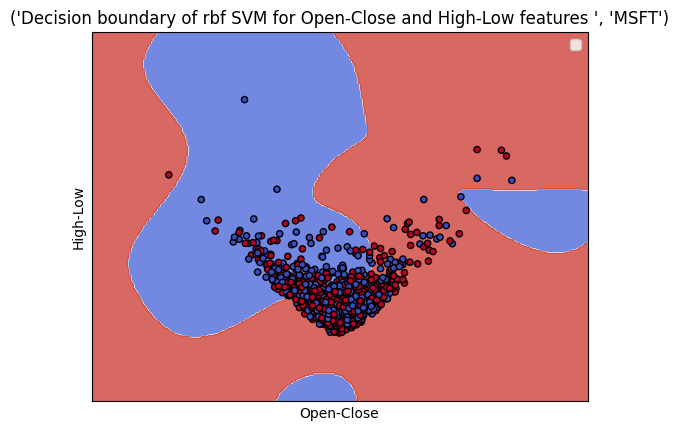

Test accuracy: 0.5873015873015873
Test precision: 0.6390532544378699
Test precision: 0.7152317880794702
Test precision: 0.675
Train accuracy: 0.548162859980139


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


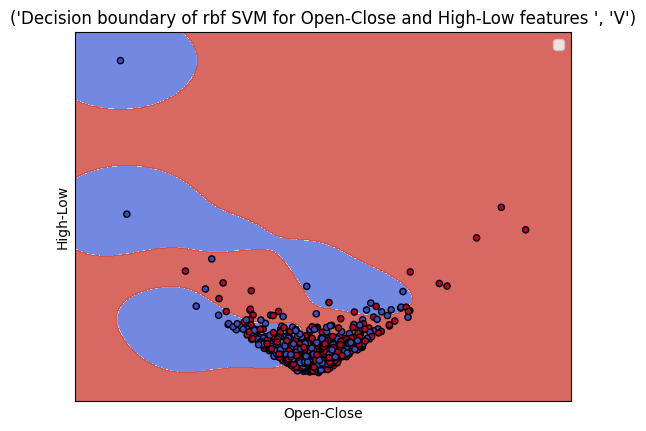

Test accuracy: 0.5912698412698413
Test precision: 0.5991561181434599
Test precision: 0.9466666666666667
Test precision: 0.7338501291989664
Train accuracy: 0.5600794438927508


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


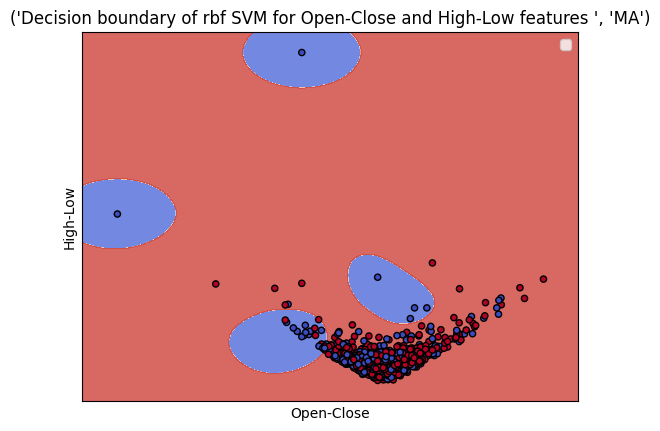

Test accuracy: 0.4444444444444444
Test precision: 0.5365853658536586
Test precision: 0.15384615384615385
Test precision: 0.2391304347826087
Train accuracy: 0.5322740814299901


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


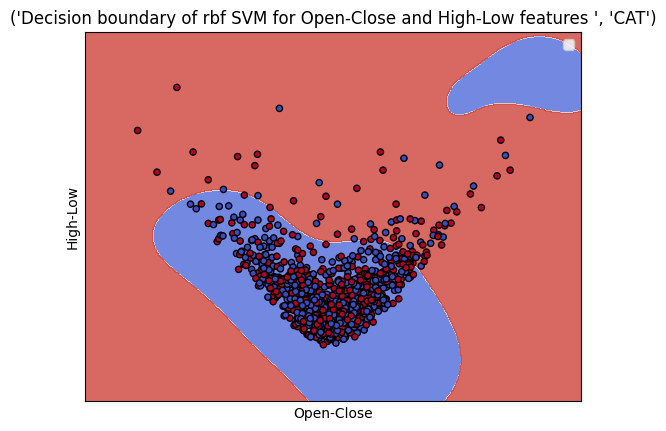

In [7]:
#############
# Section One
#############

decision_names = ["MSFT", "V", "MA", "CAT"]

# # Try plotting the decision boundary, this takes a long time
# # From here: https://stackoverflow.com/questions/51297423/plot-scikit-learn-sklearn-svm-decision-boundary-surface

# AMZN especially takes a while, removed to save time on running the code

for name in decision_names:
    # Filter down to just one stock
    df = df.rename(columns={'Name': 'Ticks'})
    
    v = df.loc[df['Ticks'] == name]
    v.index = pd.to_datetime(v['date']) 
    
    v = v.drop(['date'], axis='columns') 
    
    # Create predictor variables 
    v['Open-Close'] = v['open'] - v['close']
    v['High-Low'] = v['high'] - v['low']
      
    # Store all predictor variables in a variable X 
    X = v[['Open-Close', 'High-Low']] 
    X.head() 
    
    # If the next day close is greater than the current day close, classify as buy (1)
    # else it is a no-position (0)
    y = np.where(v['close'].shift(-1) > v['close'], 1, 0) 
    
    
    # Split and train on a buy and a sell
    split_percentage = 0.8
    split = int(split_percentage*len(v)) 
      
    # Train data set 
    X_train = X[:split] 
    y_train = y[:split] 
      
    # Test data set 
    X_test = X[split:] 
    y_test = y[split:]
    
    svm = SVC(kernel ='rbf', C=1)
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    print("Test precision:", precision)
    print("Test precision:", recall)
    print("Test precision:", f1)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)
    
    
    
    
    def make_meshgrid(x, y, h=.02):
        x_min, x_max = x.min() - 1, x.max() + 1
        y_min, y_max = y.min() - 1, y.max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        return xx, yy
    
    def plot_contours(ax, clf, xx, yy, **params):
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        out = ax.contourf(xx, yy, Z, **params)
        return out
    
    fig, ax = plt.subplots()
    # title for the plots
    title = ('Decision boundary of rbf SVM for Open-Close and High-Low features ', name)
    
    # Get Y
    y = y_train
    
    # Set-up grid for plotting.
    X0, X1 = X_train['Open-Close'].to_numpy(), X_train['High-Low'].to_numpy()
    xx, yy = make_meshgrid(X0, X1)
    
    plot_contours(ax, cls, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_ylabel('High-Low')
    ax.set_xlabel('Open-Close')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
    ax.legend()
    plt.show()



In [7]:
#############
# Section two
#############
 
amzn = df.loc[df['Ticks'] == 'AMZN']
amzn.head()

,date,open,high,low,close,volume,Ticks
46387,2013-02-08,261.40,265.25,260.555,261.95,3879078,AMZN
46388,2013-02-11,263.20,263.25,256.600,257.21,3403403,AMZN
46389,2013-02-12,259.19,260.16,257.000,258.70,2938660,AMZN
46390,2013-02-13,261.53,269.96,260.300,269.47,5292996,AMZN
46391,2013-02-14,267.37,270.65,265.400,269.24,3462780,AMZN


In [8]:
amzn.index = pd.to_datetime(amzn['date']) 

amzn = amzn.drop(['date'], axis='columns') 

In [9]:
# Create predictor variables 
amzn['Open-Close'] = amzn['open'] - amzn['close']
amzn['High-Low'] = amzn['high'] - amzn['low']
  
# Store all predictor variables in a variable X 
X = amzn[['Open-Close', 'High-Low']] 
X.head() 

,Open-Close,High-Low
date,,
2013-02-08,-0.55,4.695
2013-02-11,5.99,6.650
2013-02-12,0.49,3.160
2013-02-13,-7.94,9.660
2013-02-14,-1.87,5.250


In [10]:
amzn.head()

,open,high,low,close,volume,Ticks,Open-Close,High-Low
date,,,,,,,,
2013-02-08,261.40,265.25,260.555,261.95,3879078,AMZN,-0.55,4.695
2013-02-11,263.20,263.25,256.600,257.21,3403403,AMZN,5.99,6.650
2013-02-12,259.19,260.16,257.000,258.70,2938660,AMZN,0.49,3.160
2013-02-13,261.53,269.96,260.300,269.47,5292996,AMZN,-7.94,9.660
2013-02-14,267.37,270.65,265.400,269.24,3462780,AMZN,-1.87,5.250


In [11]:

# If the next day close is greater than the current day close, classify as buy (1)
# else it is a no-position (0)
y = np.where(amzn['close'].shift(-1) > amzn['close'], 1, 0) 
print(y)

# Here we either predict and buy one unit of the stock, or we predict that we should not hold a unit 
# this does not factor in the potential cost of buying or selling, it assumes a hold and not-hold is free for a single unit

[0 1 1 ... 1 0 0]


In [12]:
# Split and train on a buy and a sell
split_percentage = 0.8
split = int(split_percentage*len(amzn)) 
  
# Train data set 
X_train = X[:split] 
y_train = y[:split] 
  
# Test data set 
X_test = X[split:] 
y_test = y[split:]

In [13]:

# Try different kernel functions
# RBF generally performs the best

svm = SVC(kernel ='poly')
cls = svm.fit(X_train, y_train)

y_pred = cls.predict(X_test)
y_pred_train = cls.predict(X_train)

accuracy = accuracy_score(y_test, y_pred)
print("Test accuracy:", accuracy)

accuracy = accuracy_score(y_train, y_pred_train)
print("Train accuracy:", accuracy)

Test accuracy: 0.5714285714285714
Train accuracy: 0.5342601787487586


In [14]:
svm = SVC(kernel ='linear')
cls = svm.fit(X_train, y_train)

y_pred = cls.predict(X_test)
y_pred_train = cls.predict(X_train)

accuracy = accuracy_score(y_test, y_pred)
print("Test accuracy:", accuracy)

accuracy = accuracy_score(y_train, y_pred_train)
print("Train accuracy:", accuracy)

Test accuracy: 0.5714285714285714
Train accuracy: 0.5332671300893744


In [15]:
# In this case, sigmoid seems to have the highest test accuracy
# However, if you try to use to predict returns it performs worse for some reason

svm = SVC(kernel ='sigmoid')
cls = svm.fit(X_train, y_train)

y_pred = cls.predict(X_test)
y_pred_train = cls.predict(X_train)

accuracy = accuracy_score(y_test, y_pred)
print("Test accuracy:", accuracy)

accuracy = accuracy_score(y_train, y_pred_train)
print("Train accuracy:", accuracy)

Test accuracy: 0.5753968253968254
Train accuracy: 0.5153922542204568


In [16]:
# Used this article: https://medium.com/@myselfaman12345/c-and-gamma-in-svm-e6cee48626be

# Try tuning the regularization parameter
# In general I am not seeing significantly better results for either of these

C_vals = [0.5, 0.8, 1, 1.2, 1.5, 2, 3, 5, 8]

for C_val in C_vals:
    print("Regularization value: ", C_val)
    svm = SVC(kernel ='rbf', C=C_val)
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)
    
    accuracy = accuracy_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)


# Try tuning the gamma parameter

gamma_vals = [0.5, 0.8, 1, 1.2, 1.5, 2, 3, 5, 8, 10]

for gamma_val in gamma_vals:
    print("gamma_val: ", gamma_val)
    svm = SVC(kernel ='rbf', gamma=gamma_val)
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)
    
    accuracy = accuracy_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)

Regularization value:  0.5
Test accuracy: 0.5714285714285714
Train accuracy: 0.5332671300893744
Regularization value:  0.8
Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143
Regularization value:  1
Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143
Regularization value:  1.2
Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143
Regularization value:  1.5
Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143
Regularization value:  2
Test accuracy: 0.5714285714285714
Train accuracy: 0.5392254220456802
Regularization value:  3
Test accuracy: 0.5396825396825397
Train accuracy: 0.5531281032770605
Regularization value:  5
Test accuracy: 0.5555555555555556
Train accuracy: 0.5600794438927508
Regularization value:  8
Test accuracy: 0.5357142857142857
Train accuracy: 0.5571002979145978
gamma_val:  0.5
Test accuracy: 0.5238095238095238
Train accuracy: 0.6663356504468719
gamma_val:  0.8
Test accuracy: 0.5238095238095238
Train accuracy:

In [17]:
# Regularization with the normal margin seems to work well here

svm = SVC(kernel ='rbf', C=1)
cls = svm.fit(X_train, y_train)

y_pred = cls.predict(X_test)
y_pred_train = cls.predict(X_train)

accuracy = accuracy_score(y_test, y_pred)
print("Test accuracy:", accuracy)

accuracy = accuracy_score(y_train, y_pred_train)
print("Train accuracy:", accuracy)

Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143


In [18]:
amzn_future = amzn[split:]
amzn_future['Predicted_Signal'] = cls.predict(X_test)

In [19]:
amzn_future['Return'] = amzn_future['close'].pct_change()

amzn_future.head()

,open,high,low,close,volume,Ticks,Open-Close,High-Low,Predicted_Signal,Return
date,,,,,,,,,,
2017-02-08,812.69,821.4790,812.5000,819.71,2857985,AMZN,-7.02,8.9790,1,NaN
2017-02-09,821.60,825.0000,819.7100,821.36,2484948,AMZN,0.24,5.2900,1,0.002013
2017-02-10,823.82,828.0000,822.8500,827.46,2429609,AMZN,-3.64,5.1500,1,0.007427
2017-02-13,831.62,842.9999,828.5500,836.53,4172618,AMZN,-4.91,14.4499,1,0.010961
2017-02-14,837.00,838.3100,831.4522,836.39,2792442,AMZN,0.61,6.8578,1,-0.000167


In [20]:
amzn_future['Strategy_Return'] = amzn_future.Return * amzn_future.Predicted_Signal.shift(1)


In [21]:
amzn_future['Cum_Ret'] = amzn_future['Return'].cumsum() 

In [22]:
amzn_future['Cum_Strategy'] = amzn_future['Strategy_Return'].cumsum() 


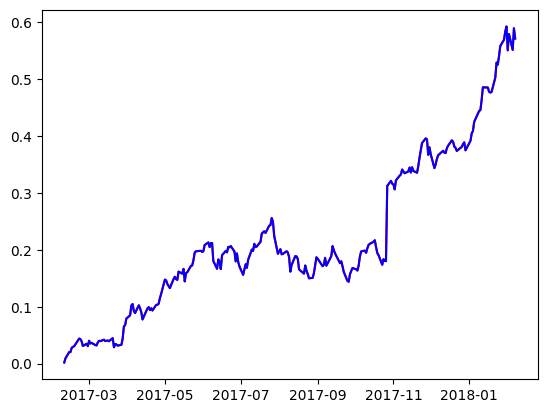

In [23]:
plt.plot(amzn_future['Cum_Ret'],color='red') 
plt.plot(amzn_future['Cum_Strategy'],color='blue')

Modeling  AMZN
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01       -2.47     5.560            2.32
2013-03-04       -7.75     9.160            8.53
2013-03-05       -1.59     6.690           14.41
2013-03-06        1.97     4.657            6.12
2013-03-07        0.22     2.950            4.55
...                ...       ...             ...
2018-02-01       55.00    74.740          174.21
2018-02-02       47.44    84.000           84.80
2018-02-05       12.62   138.260          125.09
2018-02-06      -81.38    92.200           95.00
2018-02-07       32.22    45.840          149.52

[1245 rows x 3 columns]
Test accuracy: 0.5542168674698795
Train accuracy: 0.5331325301204819
              open      high       low   close   volume Ticks  Close14-Close1  \
date                                                                            
2017-02-13  831.62  842.9999  828.5500  836.53  4172618  AMZN            5.02   
2017-02-14 

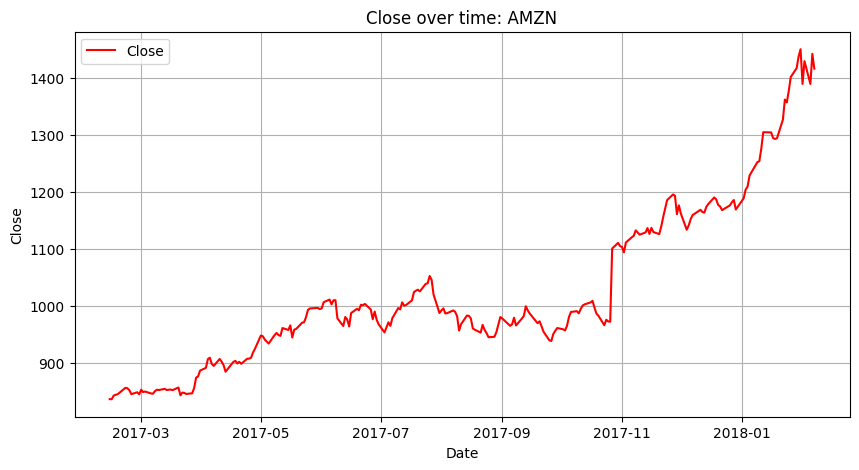

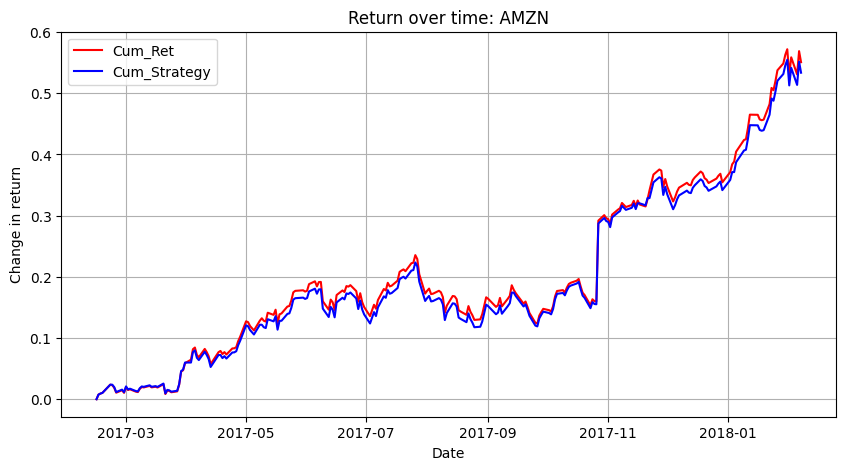

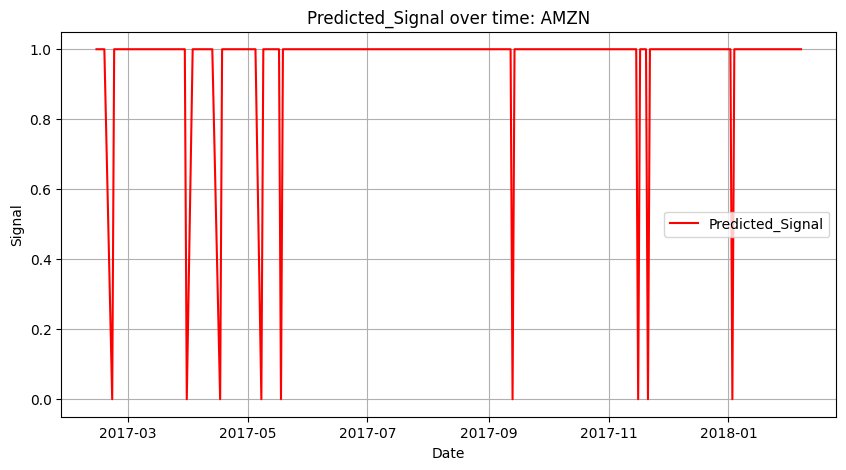

Modeling  AAPL
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01      1.0757    1.1714         -4.7971
2013-03-04      1.1071    1.3143         -7.0657
2013-03-05     -1.3805    2.0628         -6.8357
2013-03-06      1.2640    1.5457         -5.1237
2013-03-07     -0.8689    1.5643         -5.8468
...                ...       ...             ...
2018-02-01     -0.6150    1.8600         -7.8500
2018-02-02      5.5000    6.7000         -9.3100
2018-02-05      2.6100    7.8800        -15.6900
2018-02-06     -8.2000    9.7200        -22.6100
2018-02-07      3.5450    4.3315        -16.2300

[1245 rows x 3 columns]
Test accuracy: 0.5180722891566265
Train accuracy: 0.5391566265060241
              open    high       low    close    volume Ticks  Close14-Close1  \
date                                                                            
2017-02-13  133.08  133.82  132.7500  133.290  23035421  AAPL          12.150   
2017-02-14 

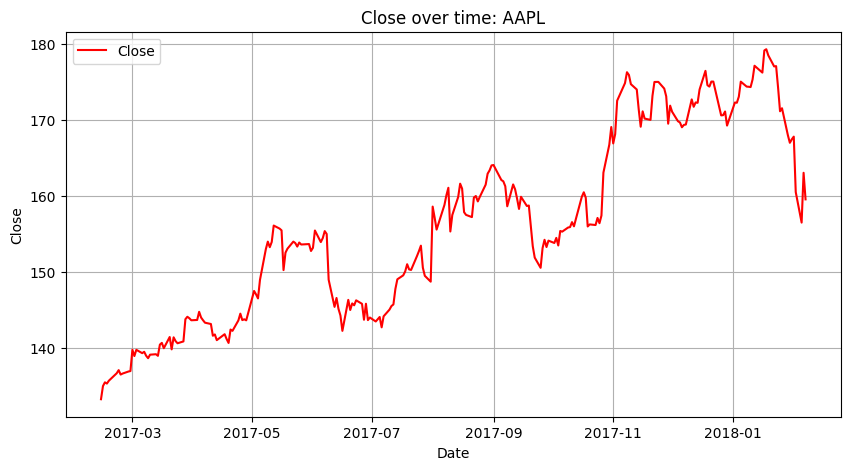

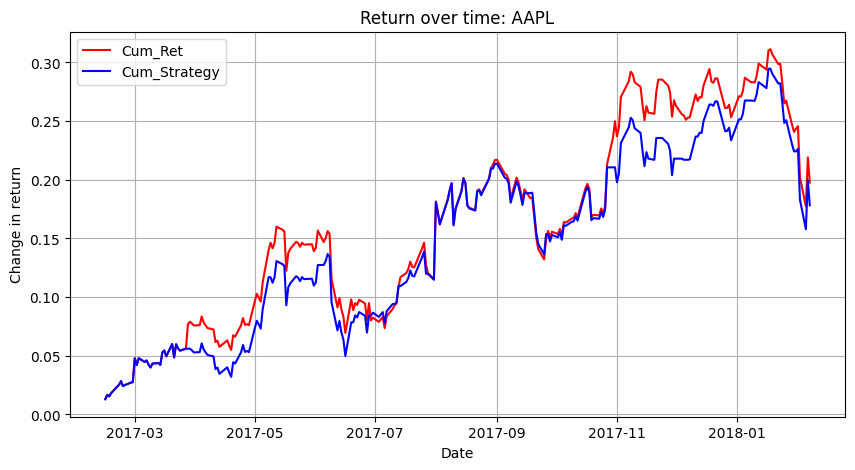

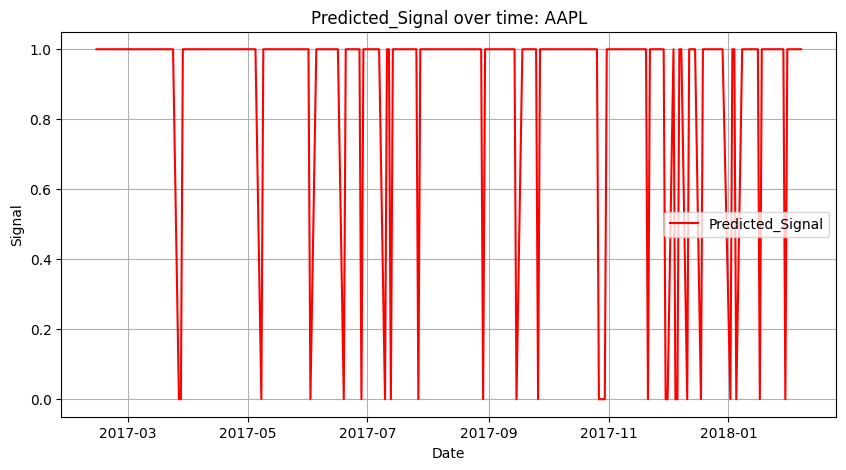

Modeling  MSFT
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01       -0.23    0.4600            0.25
2013-03-04       -0.30    0.4500            0.09
2013-03-05       -0.06    0.3800            0.27
2013-03-06        0.12    0.4500            0.32
2013-03-07       -0.03    0.2750            0.05
...                ...       ...             ...
2018-02-01        0.53    2.4887            6.93
2018-02-02        1.86    2.4700            4.66
2018-02-05        2.56    5.2400            3.43
2018-02-06       -4.44    6.2250           -2.14
2018-02-07        0.88    2.5700            1.23

[1245 rows x 3 columns]
Test accuracy: 0.5180722891566265
Train accuracy: 0.5622489959839357
             open   high     low  close    volume Ticks  Close14-Close1  \
date                                                                      
2017-02-13  64.24  64.86  64.130  64.72  22920101  MSFT            0.48   
2017-02-14  64.41  64.72  64.

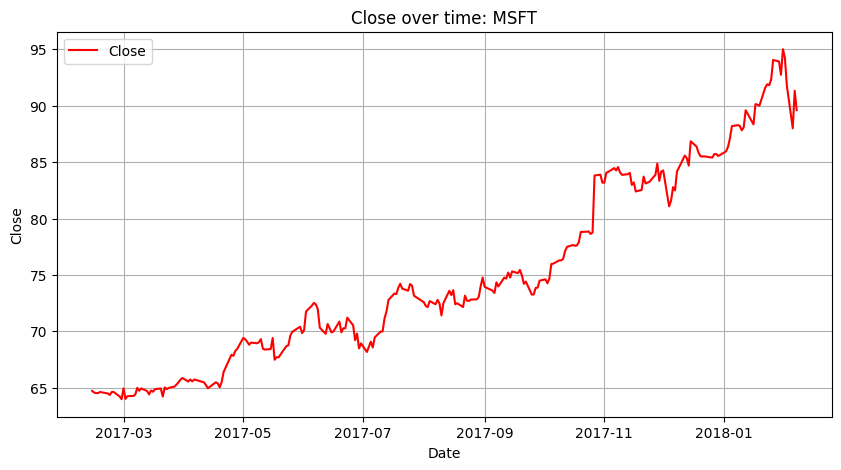

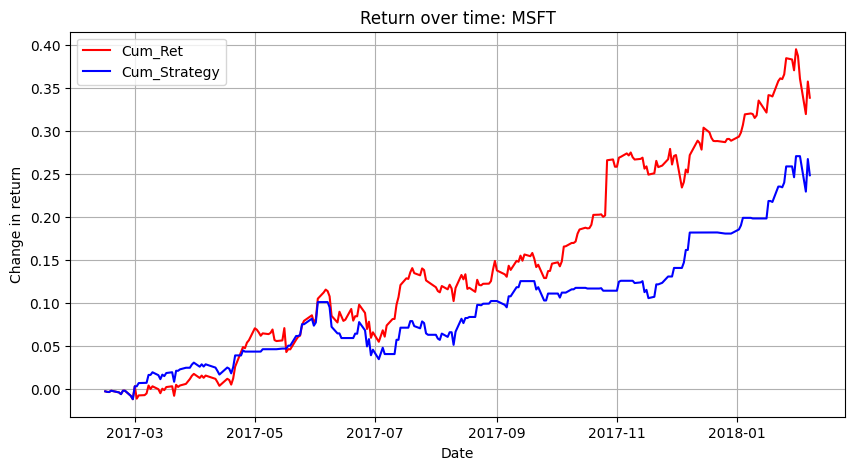

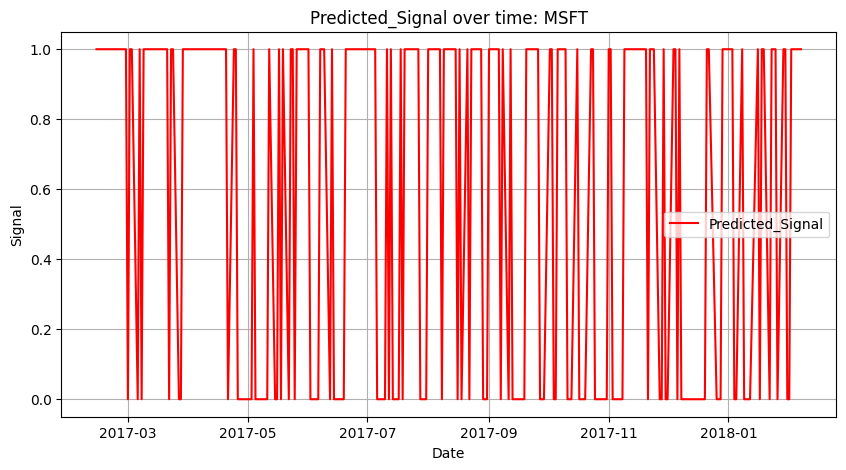

Modeling  WMT
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01     -0.9600    1.1200           -0.70
2013-03-04     -1.7400    1.7500            0.34
2013-03-05     -0.2500    1.0500            1.86
2013-03-06      0.3700    0.8785            2.33
2013-03-07      0.1699    0.4100            2.56
...                ...       ...             ...
2018-02-01      0.4400    1.3800            6.58
2018-02-02      0.6700    2.3200            4.65
2018-02-05      3.3100    7.5200            3.79
2018-02-06     -3.2600    3.8300           -2.61
2018-02-07     -2.3500    4.5800           -3.40

[1245 rows x 3 columns]
Test accuracy: 0.4899598393574297
Train accuracy: 0.5431726907630522
             open    high     low  close    volume Ticks  Close14-Close1  \
date                                                                       
2017-02-13  68.32  68.650  67.560  67.77   8374307   WMT            0.62   
2017-02-14  67.88  68.680  

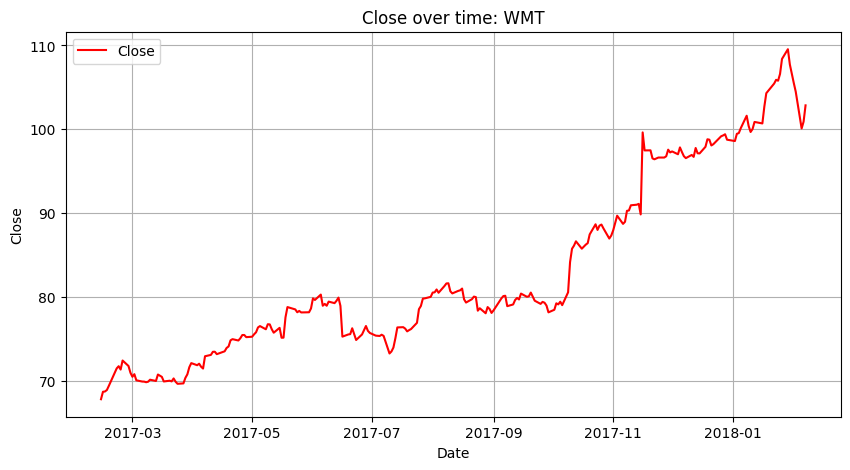

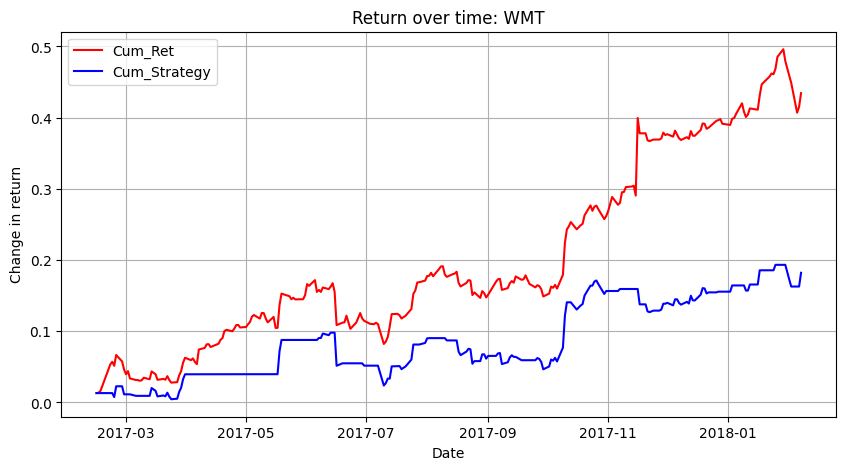

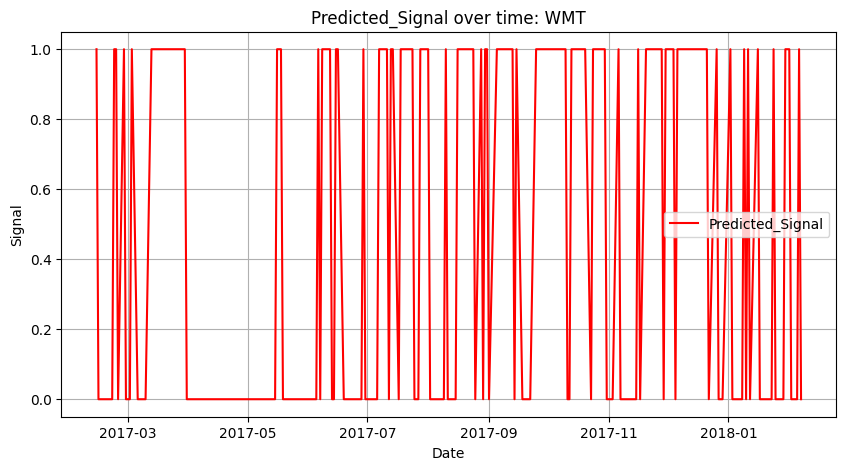

Modeling  V
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01     -0.0375    0.5525          0.2100
2013-03-04     -0.4350    0.4975          0.4375
2013-03-05     -0.0500    0.4800          0.6750
2013-03-06     -0.0500    0.3750          1.3800
2013-03-07      0.0900    0.5325          1.2700
...                ...       ...             ...
2018-02-01     -0.9800    2.1600          4.3900
2018-02-02      2.8100    3.0200          5.6300
2018-02-05      2.4300    6.1200          0.5200
2018-02-06     -4.7700    7.0500         -5.7100
2018-02-07      0.4400    3.2500         -3.1400

[1245 rows x 3 columns]
Test accuracy: 0.5742971887550201
Train accuracy: 0.5612449799196787
             open   high      low  close   volume Ticks  Close14-Close1  \
date                                                                      
2017-02-13  86.20  86.70  86.0000  86.44  6046310     V            2.67   
2017-02-14  86.52  86.97  86.260

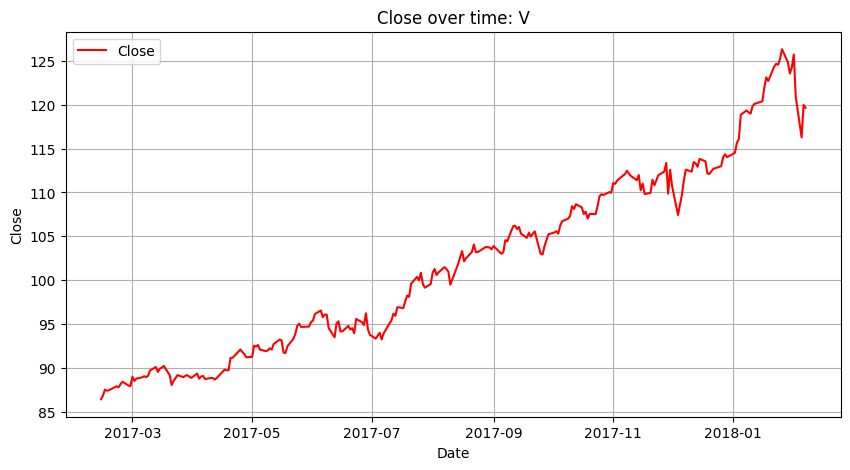

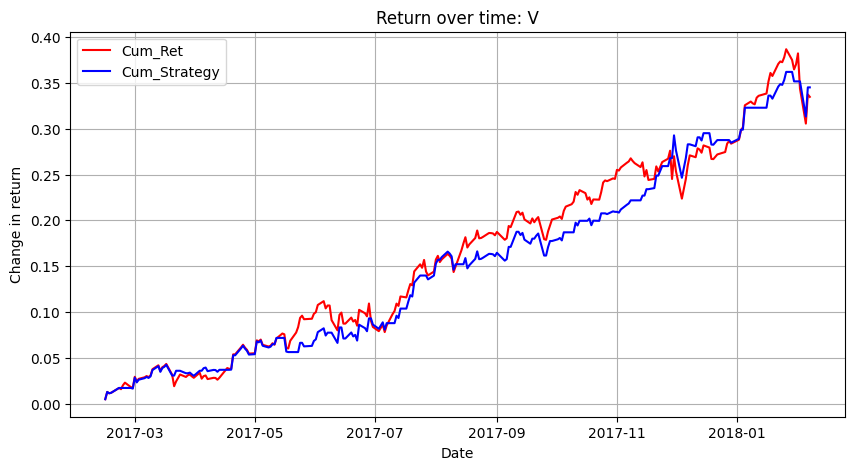

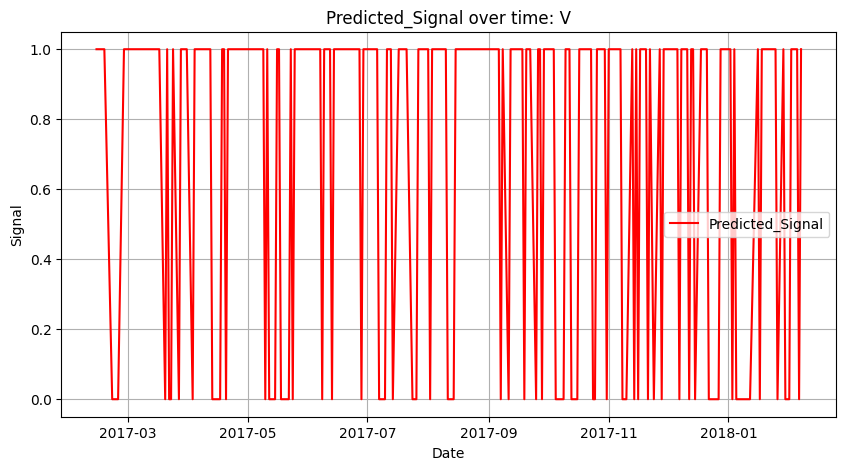

Modeling  MA
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01      -0.330    0.6220          -0.665
2013-03-04      -0.543    0.6647          -0.255
2013-03-05      -0.457    0.8930           0.177
2013-03-06      -0.206    0.7880           0.789
2013-03-07       0.105    0.4305           0.542
...                ...       ...             ...
2018-02-01      -0.420    5.7150           8.080
2018-02-02       1.350    6.6900          10.600
2018-02-05       2.780    7.9500           8.260
2018-02-06      -8.780   12.5600           0.270
2018-02-07       0.270    5.1600           3.800

[1245 rows x 3 columns]
Test accuracy: 0.5783132530120482
Train accuracy: 0.5692771084337349
              open    high      low   close   volume Ticks  Close14-Close1  \
date                                                                         
2017-02-13  107.70  108.33  107.540  108.28  2337277    MA           -2.65   
2017-02-14  108.01  10

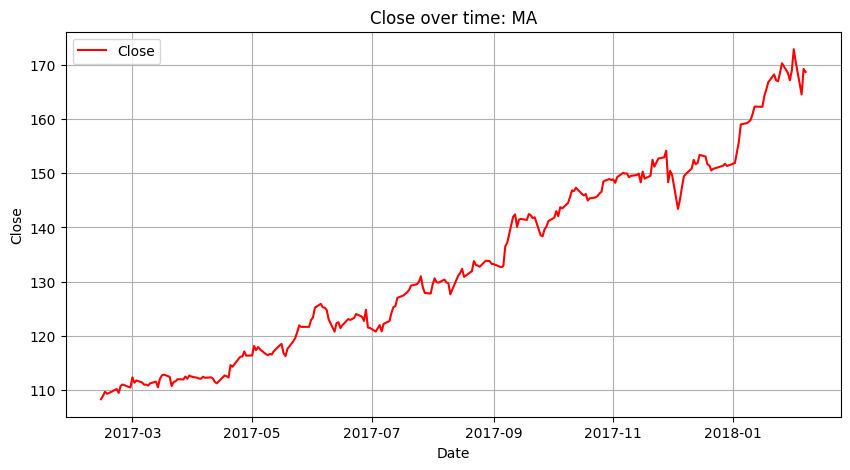

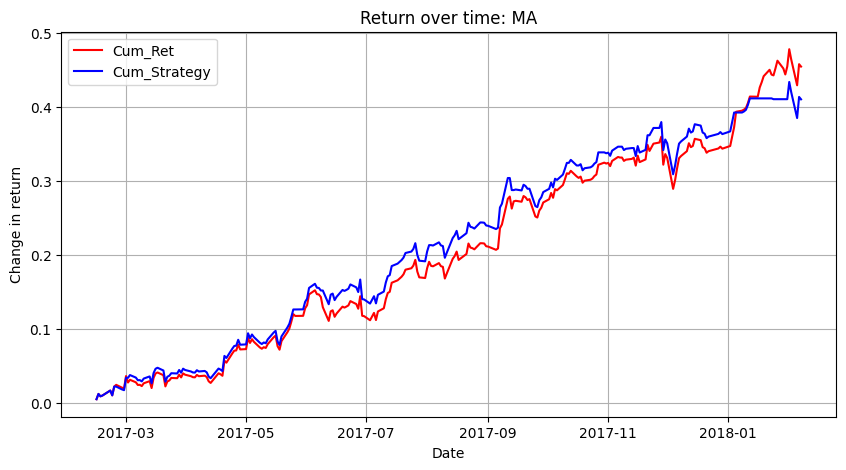

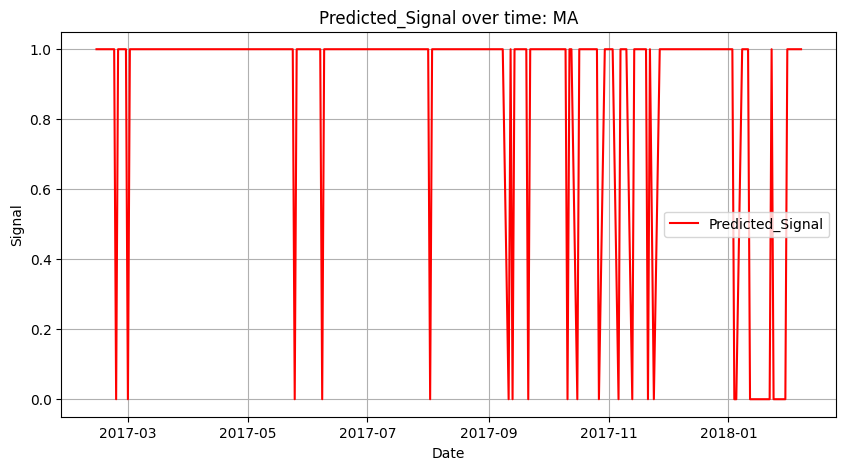

Modeling  COST
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01       -0.60     1.390           -1.50
2013-03-04       -2.17     2.300           -0.57
2013-03-05        0.53     1.130            1.67
2013-03-06        0.59     1.130            1.52
2013-03-07        1.58     2.080            0.54
...                ...       ...             ...
2018-02-01       -0.06     2.960            5.49
2018-02-02        0.26     2.800            1.63
2018-02-05        7.89     9.575           -0.54
2018-02-06       -6.10     9.040           -9.52
2018-02-07        1.41     3.120           -6.50

[1245 rows x 3 columns]
Test accuracy: 0.5421686746987951
Train accuracy: 0.5582329317269076
              open    high       low   close   volume Ticks  Close14-Close1  \
date                                                                          
2017-02-13  172.49  172.49  170.7800  171.96  2272213  COST            8.33   
2017-02-14  171.6

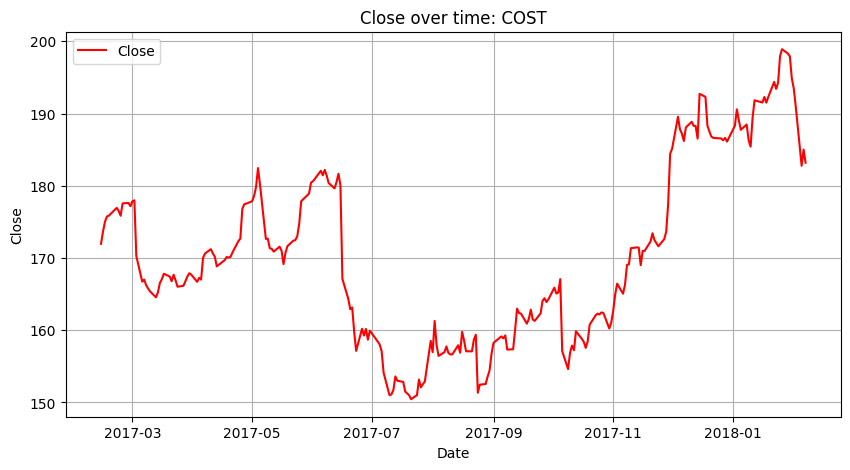

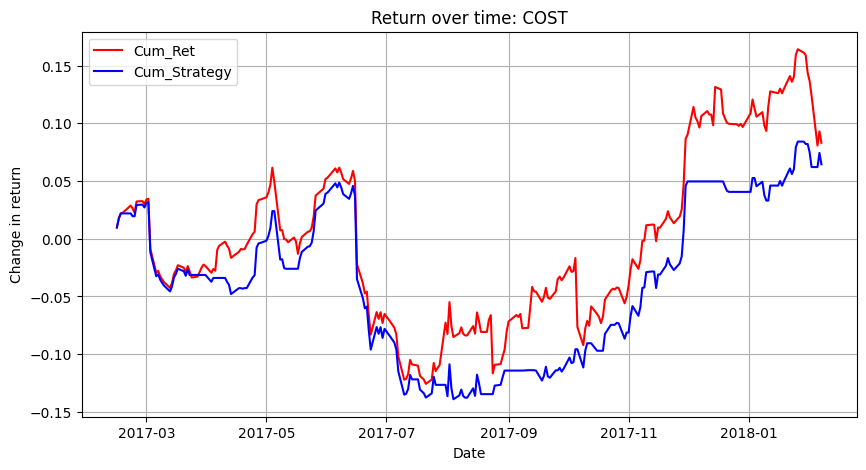

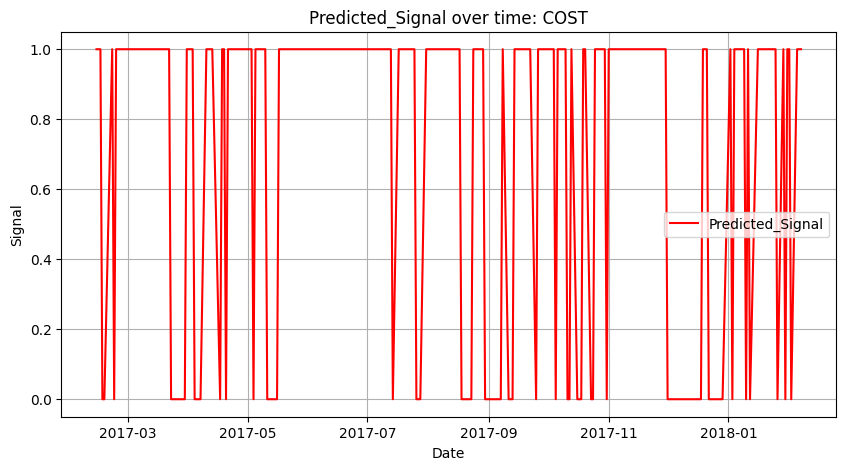

Modeling  PEP
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01       -0.38    0.5800            3.17
2013-03-04       -0.82    1.0800            3.57
2013-03-05       -0.06    0.5800            4.43
2013-03-06        0.20    0.4700            5.40
2013-03-07       -0.38    0.5000            4.52
...                ...       ...             ...
2018-02-01       -0.38    1.7300            3.42
2018-02-02        1.24    1.8800            2.92
2018-02-05        4.11    5.2499            0.81
2018-02-06       -1.12    3.8000           -4.72
2018-02-07        0.47    3.0200           -5.49

[1245 rows x 3 columns]
Test accuracy: 0.5140562248995983
Train accuracy: 0.5863453815261044
              open    high     low   close   volume Ticks  Close14-Close1  \
date                                                                        
2017-02-13  106.50  106.69  105.88  106.52  3464318   PEP            1.39   
2017-02-14  106.17  107.

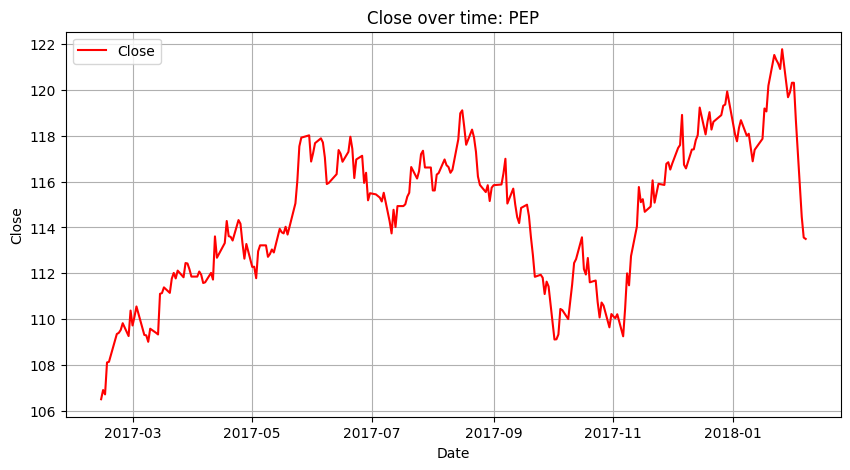

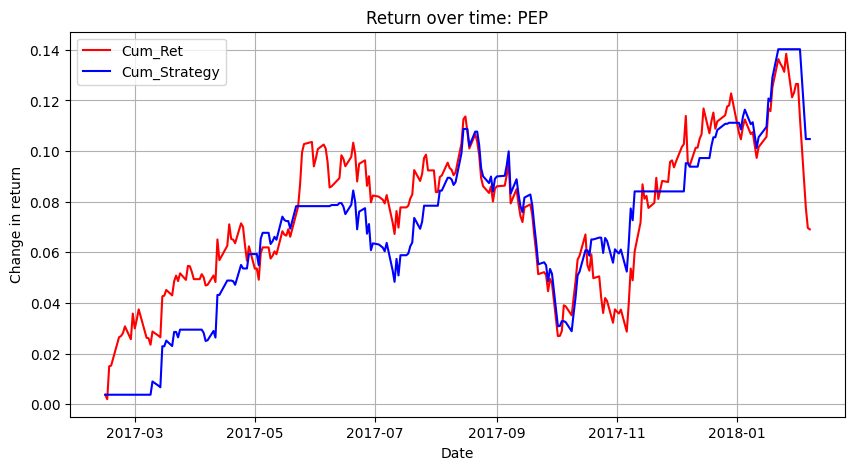

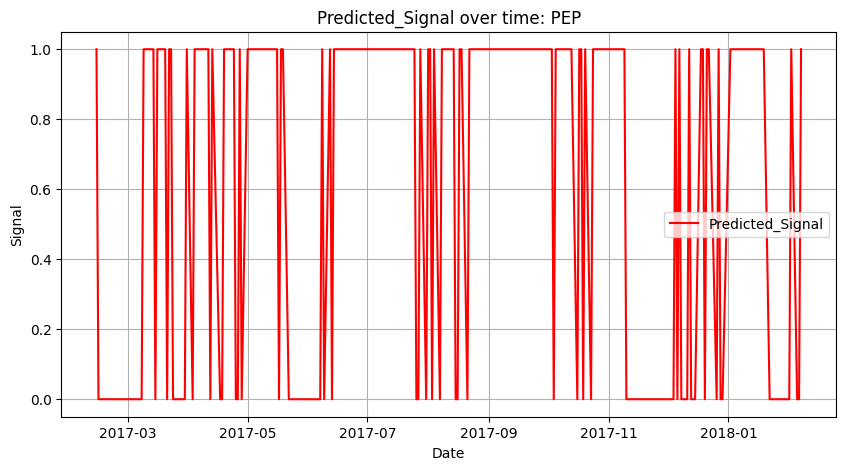

Modeling  CAT
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01        0.18    1.8300           -4.48
2013-03-04        0.86    1.5600           -5.24
2013-03-05        0.28    1.2862           -7.47
2013-03-06        1.33    1.6400           -6.17
2013-03-07        0.25    1.1300           -6.43
...                ...       ...             ...
2018-02-01       -1.00    3.5600           -6.42
2018-02-02        3.28    4.2700           -8.06
2018-02-05        3.85   16.0800          -11.82
2018-02-06       -8.34    9.7499          -17.42
2018-02-07        1.02    3.8100          -12.42

[1245 rows x 3 columns]
Test accuracy: 0.42570281124497994
Train accuracy: 0.5321285140562249
             open    high    low  close   volume Ticks  Close14-Close1  \
date                                                                     
2017-02-13  97.69  99.045  97.16  98.50  6995085   CAT            0.07   
2017-02-14  98.29  98.740  97.26

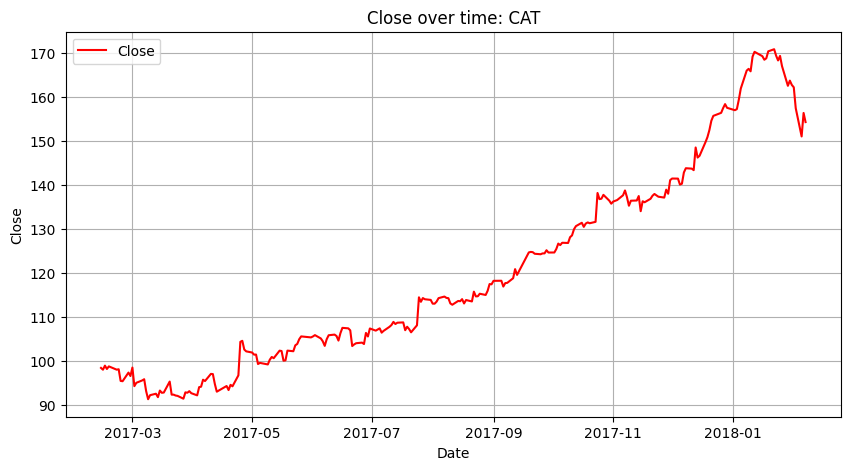

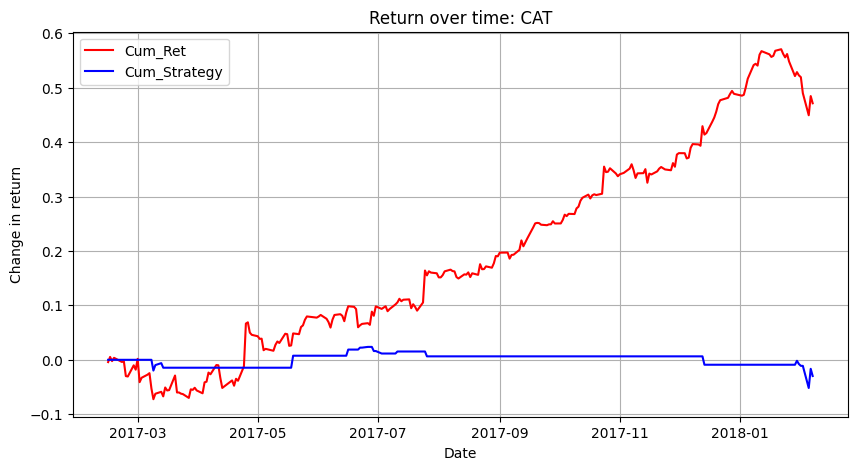

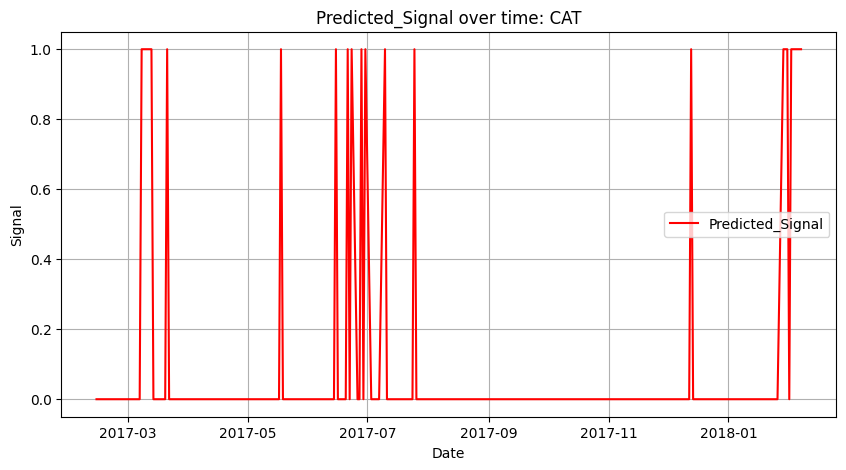

Modeling  WM
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01        0.28    0.5300            1.02
2013-03-04       -0.28    0.5300            0.59
2013-03-05       -0.18    0.3445            0.74
2013-03-06        0.37    0.4800            0.86
2013-03-07        0.11    0.4700            0.09
...                ...       ...             ...
2018-02-01        0.62    1.2200            0.25
2018-02-02        0.73    1.5500           -0.42
2018-02-05        4.35    4.7200           -1.63
2018-02-06       -0.89    4.0990           -6.78
2018-02-07        0.15    1.8400           -6.16

[1245 rows x 3 columns]
Test accuracy: 0.5823293172690763
Train accuracy: 0.5371485943775101
             open   high    low  close   volume Ticks  Close14-Close1  \
date                                                                    
2017-02-13  70.59  70.99  70.51  70.84  1548833    WM            0.98   
2017-02-14  70.79  71.05  70.72  70.8

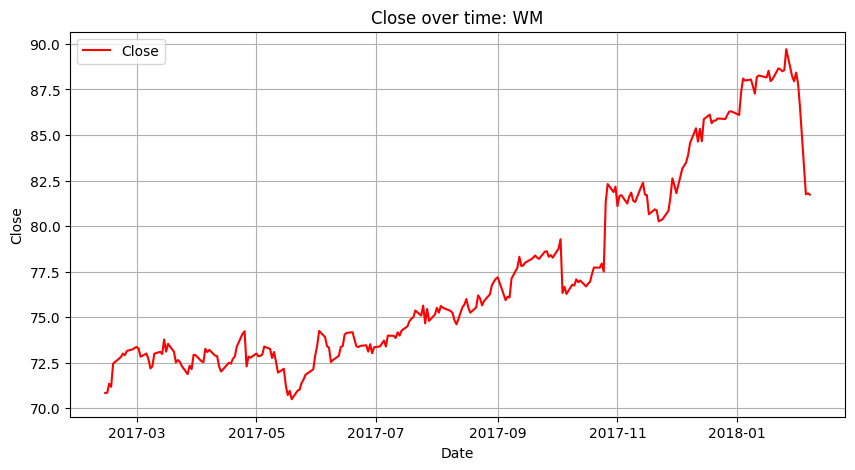

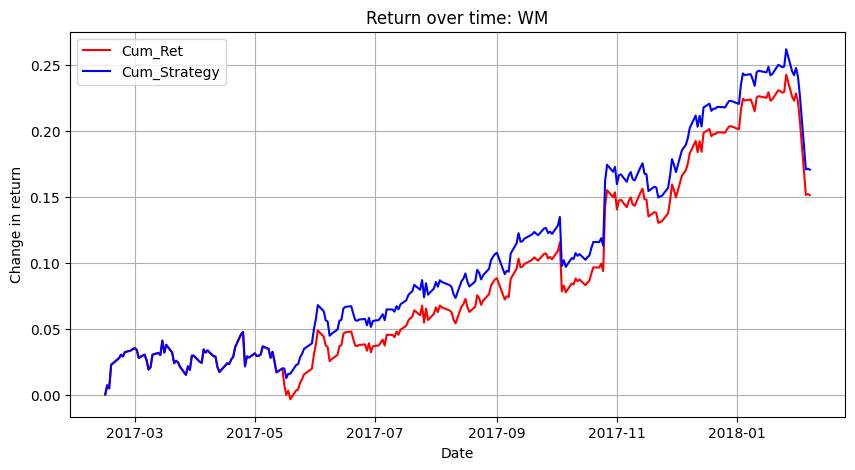

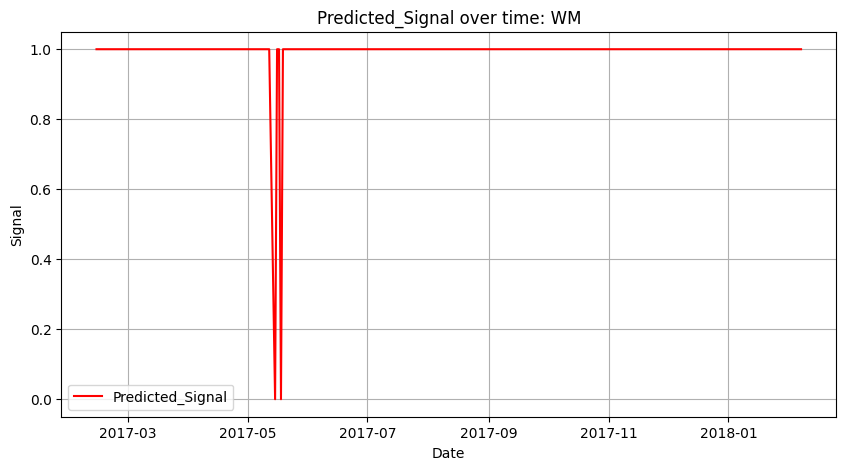

Modeling  ITW
            Open-Close  High-Low  Close14-Close1
date                                            
2013-03-01       -0.44    1.5700           -1.22
2013-03-04       -0.20    1.0200           -1.20
2013-03-05       -0.30    0.7500           -1.48
2013-03-06       -0.05    0.7200           -1.25
2013-03-07        0.67    0.8300           -1.09
...                ...       ...             ...
2018-02-01       -0.48    2.9199            4.67
2018-02-02        1.53    3.4000            2.56
2018-02-05        8.41   10.8700            1.16
2018-02-06       -5.93    8.7390           -9.90
2018-02-07        0.21    4.5300           -6.18

[1245 rows x 3 columns]
Test accuracy: 0.5742971887550201
Train accuracy: 0.5431726907630522
              open     high     low   close   volume Ticks  Close14-Close1  \
date                                                                         
2017-02-13  128.34  129.640  128.34  129.37   897696   ITW            0.94   
2017-02-14  129.30  1

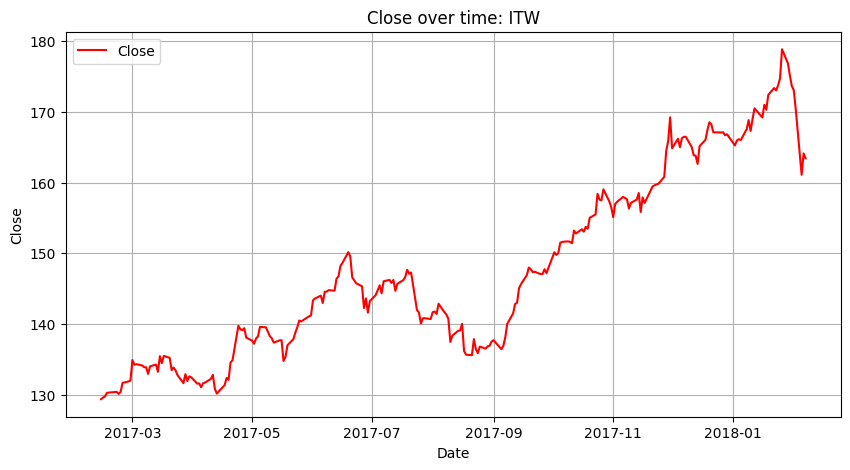

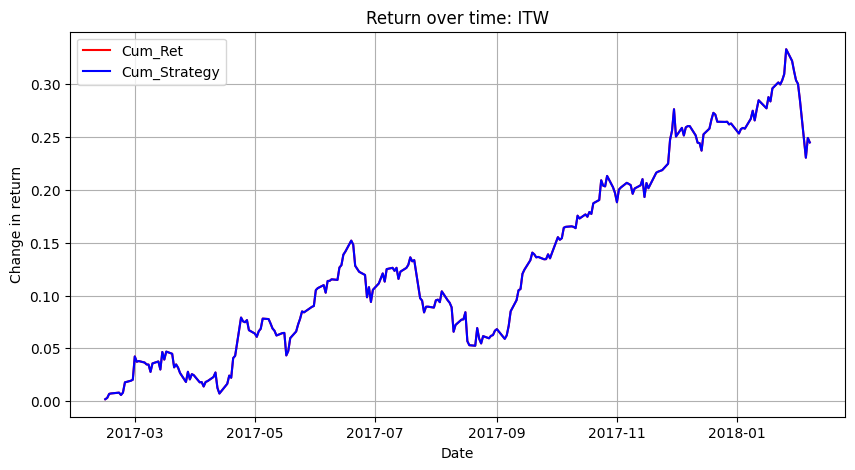

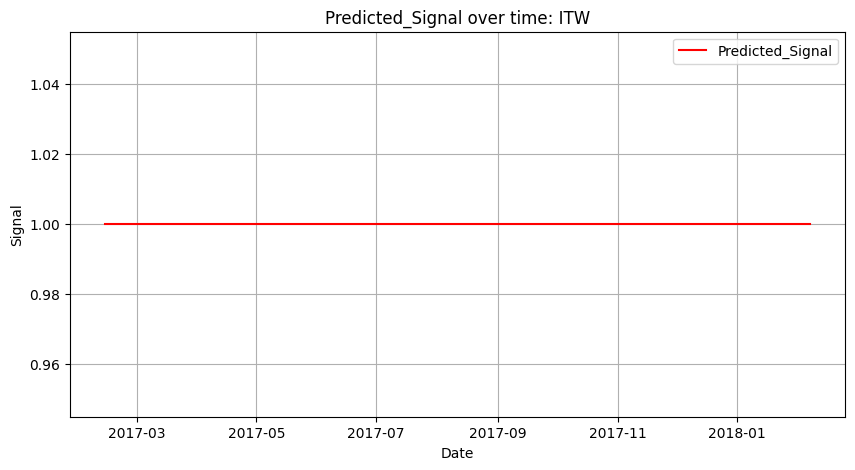

In [24]:
###############
# Section three - Change in Close feature
###############

# Try this by looping through multiple stock symbols

################
# Here we a a festure for change in close value over the last 14 days
# This feature does not seem to help much
################


# Either pick a few stocks to try
tick_names = ['AMZN', 'AAPL', 'MSFT', 'WMT', 'V', 'MA', 'COST', 'PEP', 'CAT', 'WM', 'ITW']

# OR do it for all stocks
#tick_names = unique_values

# Train a model for each stock
for name in tick_names:
    print("Modeling ", name)
    stock = df.loc[df['Ticks'] == name]
    stock.index = pd.to_datetime(stock['date']) 

    # Try comparing ranges of close values, over a 14 day range
    stock['Close14-Close1'] = stock['close'].shift(1) - stock['close'].shift(14)
    
    stock = stock.drop(['date'], axis='columns') 
    stock['Open-Close'] = stock['open'] - stock['close']
    stock['High-Low'] = stock['high'] - stock['low']

    # Due to the 14 day feature above, I drop the nan rows (first 14 days)
    stock.dropna(inplace=True)
      
    # Store all predictor variables in a variable X 
    X = stock[['Open-Close', 'High-Low', 'Close14-Close1']] 
    print(X)
    y = np.where(stock['close'].shift(-1) > stock['close'], 1, 0) 
    split_percentage = 0.8
    split = int(split_percentage*len(stock)) 
      
    # Train data set 
    X_train = X[:split] 
    y_train = y[:split] 
      
    # Test data set 
    X_test = X[split:] 
    y_test = y[split:]

    svm = SVC()
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)

    accuracy = accuracy_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)

    # Only show the returns of the test period:

    stock_future = stock[split:]

    stock_future['Predicted_Signal'] = cls.predict(X_test)
    stock_future['Return'] = stock_future['close'].pct_change()
    stock_future['Strategy_Return'] = stock_future.Return * stock_future.Predicted_Signal.shift(1)
    stock_future['Cum_Ret'] = stock_future['Return'].cumsum() 
    stock_future['Cum_Strategy'] = stock_future['Strategy_Return'].cumsum() 

    print(stock_future.head())

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['close'],color='red', label="Close") 
    plt.title('Close over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Close')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Cum_Ret'],color='red', label="Cum_Ret") 
    plt.plot(stock_future['Cum_Strategy'],color='blue', label="Cum_Strategy")
    plt.title('Return over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Change in return')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Predicted_Signal'],color='red', label="Predicted_Signal") 
    plt.title('Predicted_Signal over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Signal')
    plt.legend()
    plt.grid(True)
    plt.show()


    # # Plot the decision boundary surface, warning his takes a LONG time to run
    # fig, ax = plt.subplots()

    # title = ('Decsion boundary of rbf SVM for Open-Close and High-Low features: ' + name)
    # # Get Y
    # y = y_train
    
    # # Set-up grid for plotting.
    # X0, X1 = X_train['Open-Close'].to_numpy(), X_train['High-Low'].to_numpy()
    # xx, yy = make_meshgrid(X0, X1)
    
    # plot_contours(ax, cls, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    # ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    # ax.set_ylabel('High-Low')
    # ax.set_xlabel('Open-Close')
    # ax.set_xticks(())
    # ax.set_yticks(())
    # ax.set_title(title)
    # ax.legend()
    # plt.show()



Modeling  AMZN
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20        3.79     7.929 -1025326.0
2013-02-21       -0.82     6.230   125459.0
2013-02-22        1.20     5.500   698736.0
2013-02-25        7.07     9.044 -2169594.0
2013-02-26        1.53     6.310  -430671.0
...                ...       ...        ...
2018-02-01       55.00    74.740  1255387.0
2018-02-02       47.44    84.000  2306351.0
2018-02-05       12.62   138.260  6372710.0
2018-02-06      -81.38    92.200  6637675.0
2018-02-07       32.22    45.840  5364921.0

[1252 rows x 3 columns]
Test accuracy: 0.5896414342629482
Train accuracy: 0.5414585414585414
              open      high       low   close   volume Ticks  Vol7-Vol1  \
date                                                                       
2017-02-09  821.60  825.0000  819.7100  821.36  2484948  AMZN  -279211.0   
2017-02-10  823.82  828.0000  822.8500  827.46  2429609  AMZN -1365233.0   
2017-02-13  831

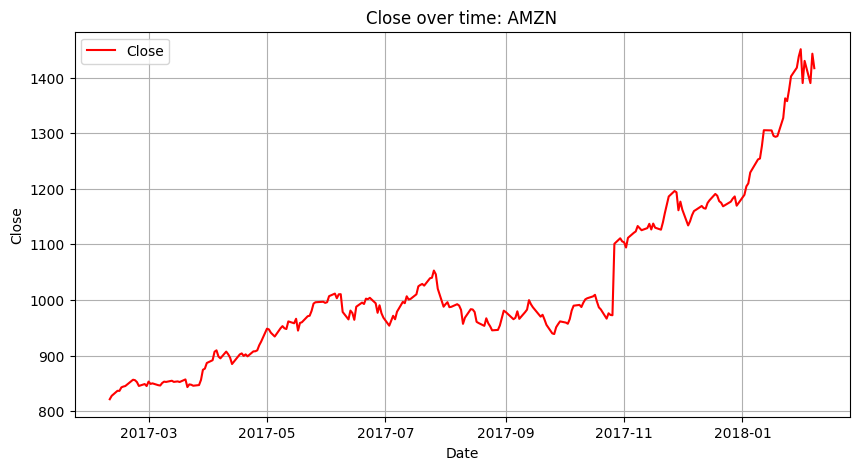

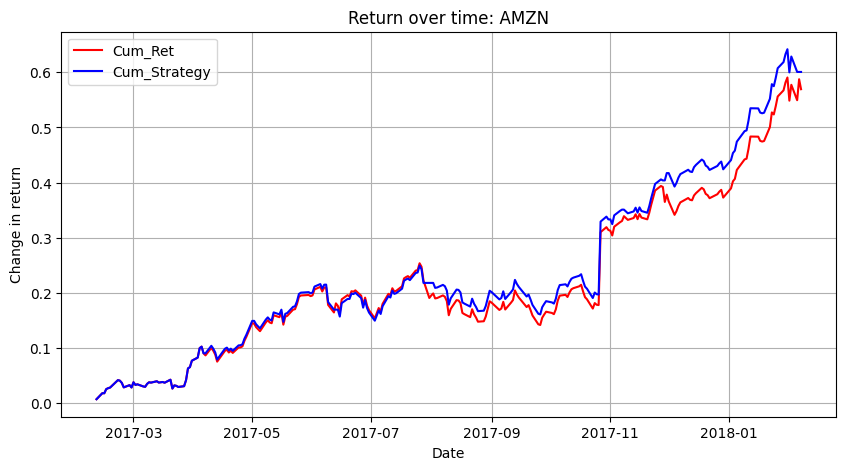

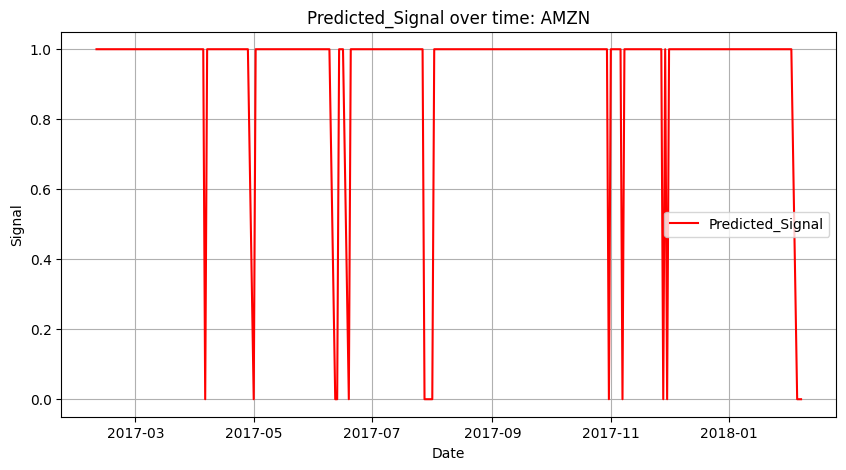

Modeling  AAPL
            Open-Close  High-Low   Vol7-Vol1
date                                        
2013-02-20      1.2628    1.2700 -49314370.0
2013-02-21     -0.0086    0.9072 -10138058.0
2013-02-22     -0.2229    0.7143 -40232542.0
2013-02-25      1.5785    1.7929 -36138172.0
2013-02-26     -0.7357    1.9828   4090443.0
...                ...       ...         ...
2018-02-01     -0.6150    1.8600   -210216.0
2018-02-02      5.5000    6.7000  -3874303.0
2018-02-05      2.6100    7.8800  45064821.0
2018-02-06     -8.2000    9.7200  33595511.0
2018-02-07      3.5450    4.3315  17603432.0

[1252 rows x 3 columns]
Test accuracy: 0.5298804780876494
Train accuracy: 0.5344655344655345
              open     high     low   close    volume Ticks   Vol7-Vol1  \
date                                                                      
2017-02-09  131.65  132.445  131.12  132.42  28349859  AAPL -26196921.0   
2017-02-10  132.46  132.940  132.05  132.12  20065458  AAPL -83635181.0   
2017-0

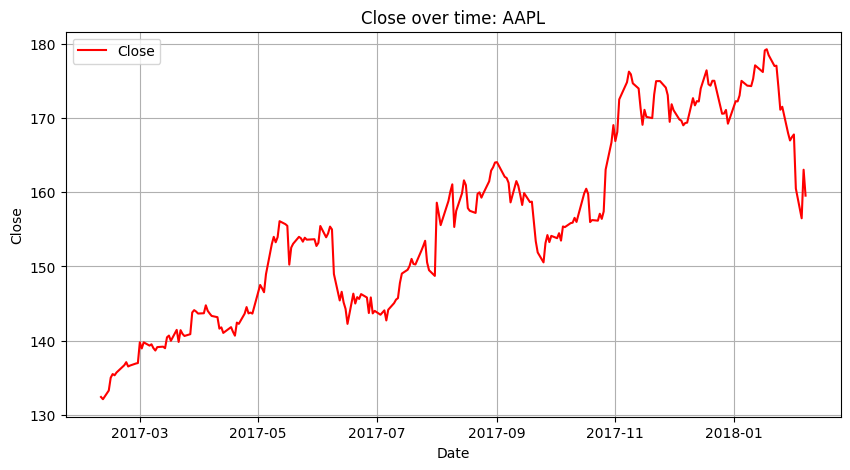

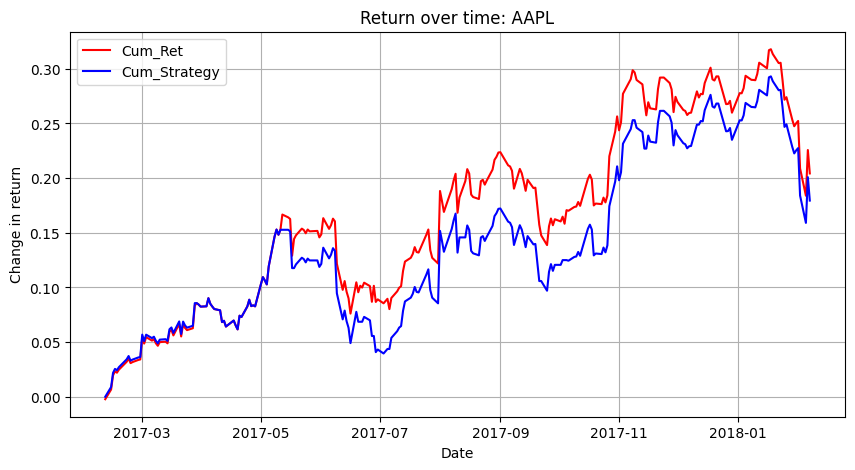

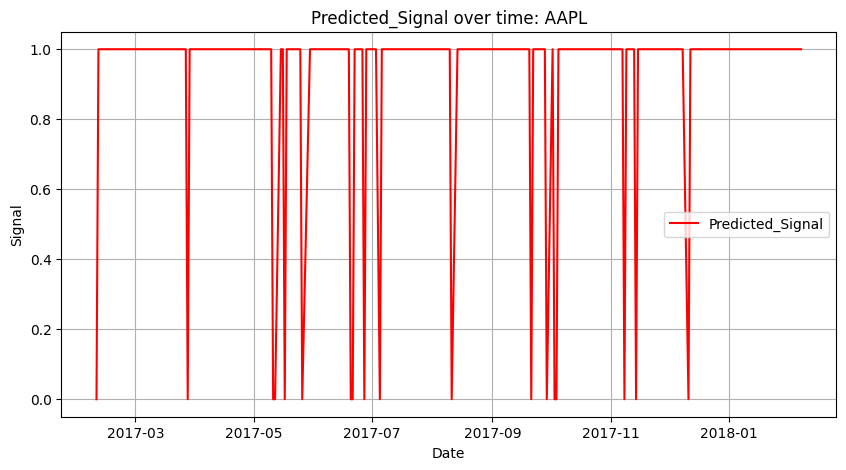

Modeling  MSFT
            Open-Close  High-Low   Vol7-Vol1
date                                        
2013-02-20        0.26    0.3700   5486310.0
2013-02-21        0.25    0.5100  11861863.0
2013-02-22       -0.08    0.2800  13087509.0
2013-02-25        0.60    0.6800 -10289804.0
2013-02-26        0.01    0.2600  15348074.0
...                ...       ...         ...
2018-02-01        0.53    2.4887  25343497.0
2018-02-02        1.86    2.4700  13950399.0
2018-02-05        2.56    5.2400  21484515.0
2018-02-06       -4.44    6.2250  21859298.0
2018-02-07        0.88    2.5700  36428624.0

[1252 rows x 3 columns]
Test accuracy: 0.4900398406374502
Train accuracy: 0.5434565434565435
             open    high     low  close    volume Ticks   Vol7-Vol1  \
date                                                                   
2017-02-09  63.52  64.435  63.320  64.06  22644443  MSFT  -7174191.0   
2017-02-10  64.25  64.300  63.975  64.00  18170729  MSFT -17027085.0   
2017-02-13  64.24 

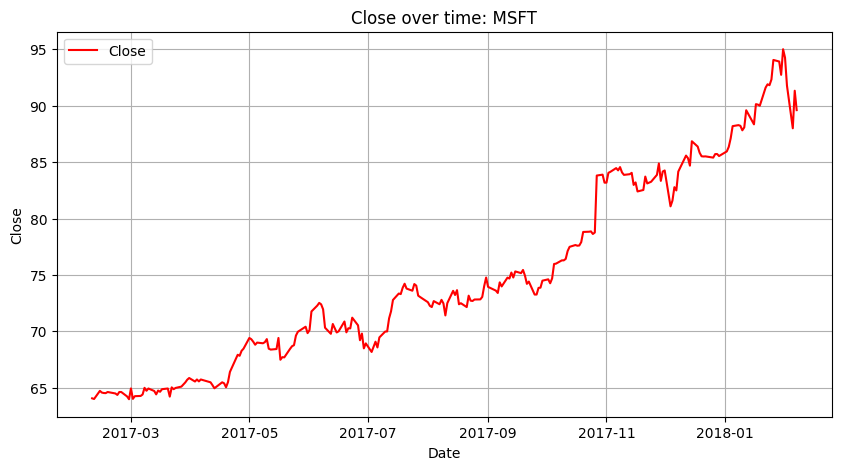

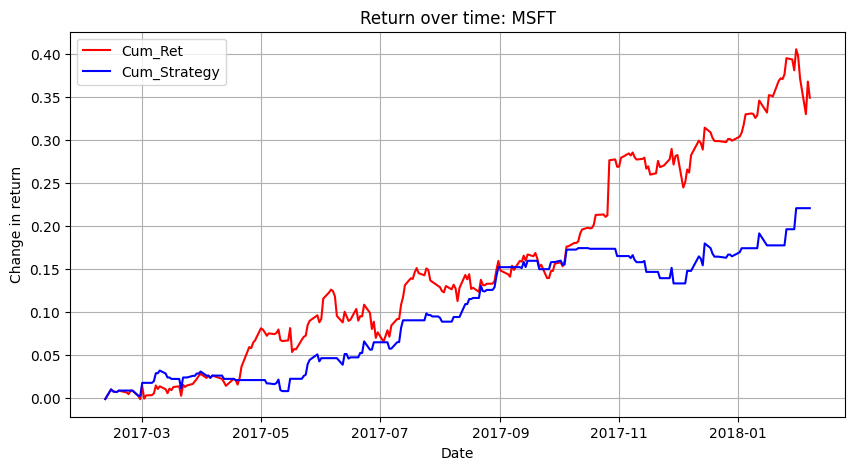

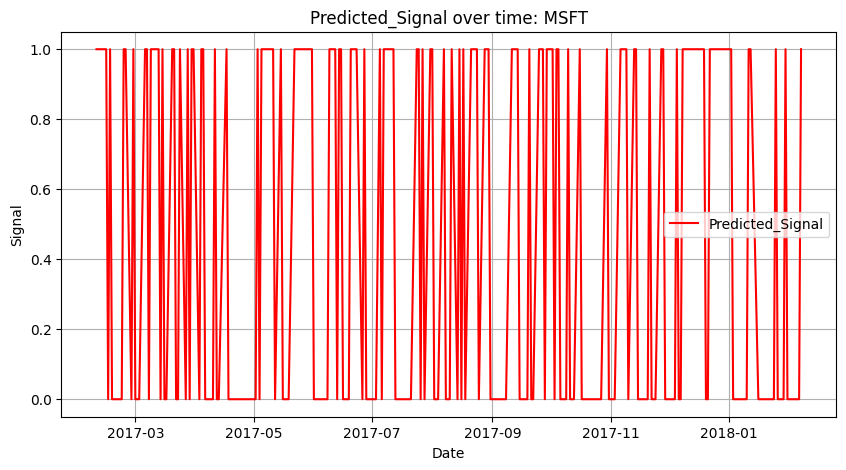

Modeling  WMT
            Open-Close  High-Low   Vol7-Vol1
date                                        
2013-02-20       -0.49      1.55   8776499.0
2013-02-21       -0.26      1.75   5771186.0
2013-02-22       -0.18      0.65  15664073.0
2013-02-25        0.06      0.90   5199253.0
2013-02-26       -0.42      0.78   4998638.0
...                ...       ...         ...
2018-02-01        0.44      1.38   1525022.0
2018-02-02        0.67      2.32   -436272.0
2018-02-05        3.31      7.52   3395932.0
2018-02-06       -3.26      3.83   5775289.0
2018-02-07       -2.35      4.58   8058593.0

[1252 rows x 3 columns]
Test accuracy: 0.5737051792828686
Train accuracy: 0.5234765234765235
             open   high    low  close    volume Ticks  Vol7-Vol1  Open-Close  \
date                                                                            
2017-02-09  67.80  69.14  67.75  69.08  11080479   WMT -1660125.0       -1.28   
2017-02-10  68.25  68.60  67.76  68.02  12445633   WMT  2030507.

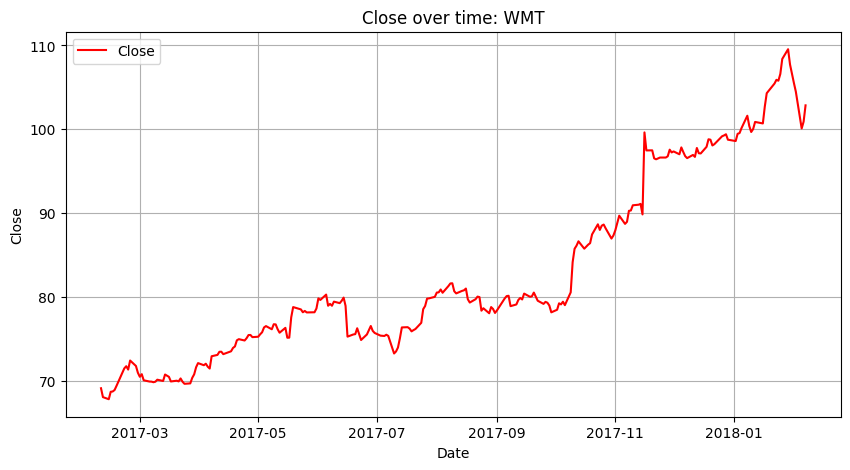

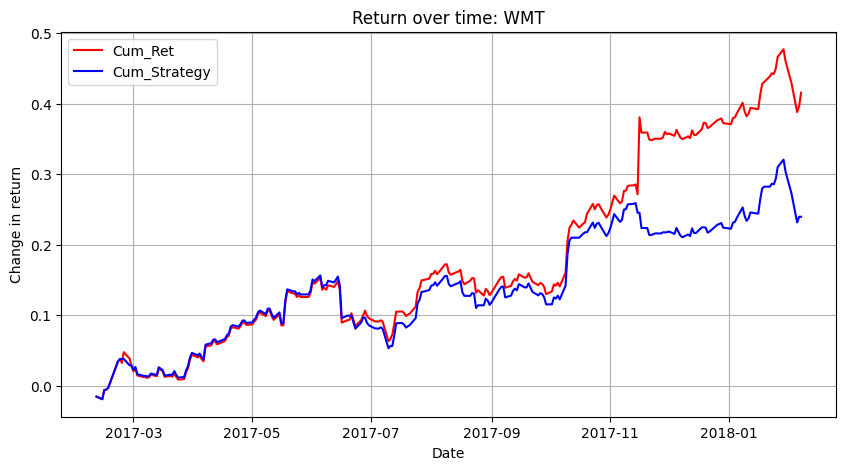

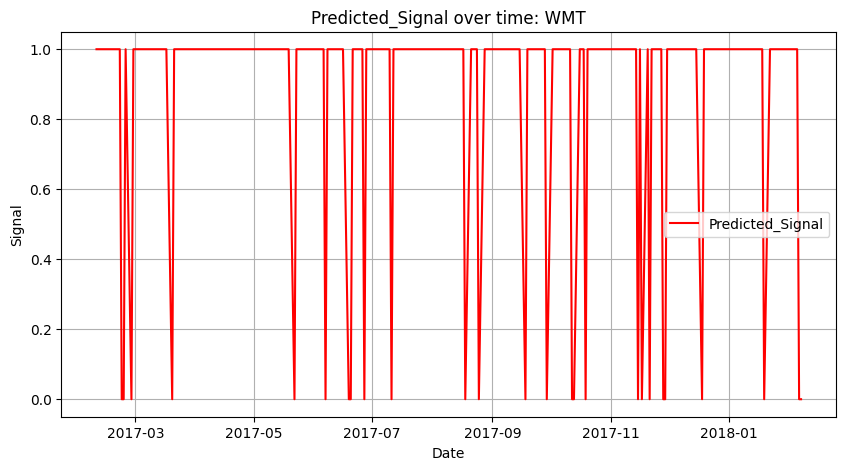

Modeling  V
            Open-Close  High-Low   Vol7-Vol1
date                                        
2013-02-20      0.4250    0.6050    295880.0
2013-02-21     -0.5800    0.8750   4656856.0
2013-02-22     -0.2825    0.7225   4415268.0
2013-02-25      0.8275    1.1150  -2178516.0
2013-02-26     -0.4550    0.6450  -1583164.0
...                ...       ...         ...
2018-02-01     -0.9800    2.1600   1654864.0
2018-02-02      2.8100    3.0200   4744433.0
2018-02-05      2.4300    6.1200   6771307.0
2018-02-06     -4.7700    7.0500  11018965.0
2018-02-07      0.4400    3.2500  12795452.0

[1252 rows x 3 columns]
Test accuracy: 0.5976095617529881
Train accuracy: 0.5324675324675324
             open   high    low  close    volume Ticks   Vol7-Vol1  \
date                                                                 
2017-02-09  85.37  85.77  84.88  85.58   6554731     V    108288.0   
2017-02-10  85.80  86.14  85.23  85.90  10431983     V   -979640.0   
2017-02-13  86.20  86.70  86.

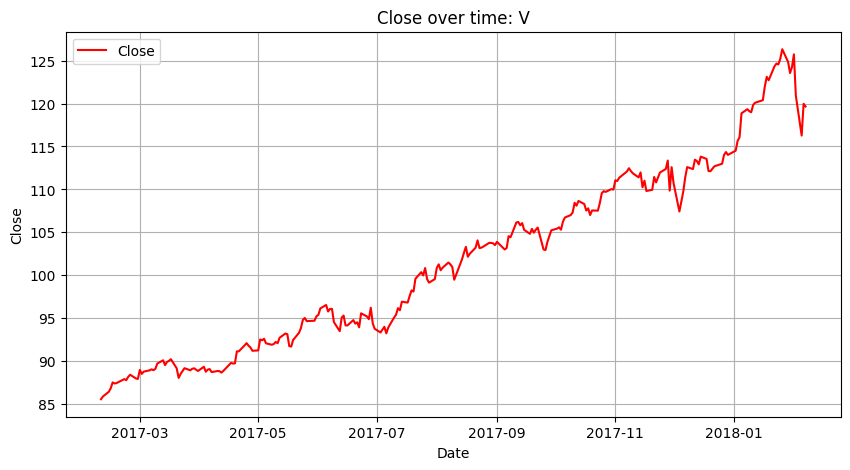

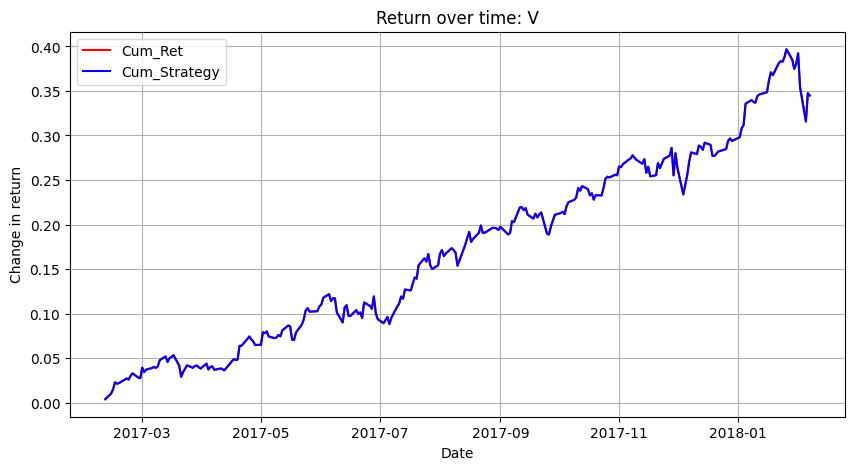

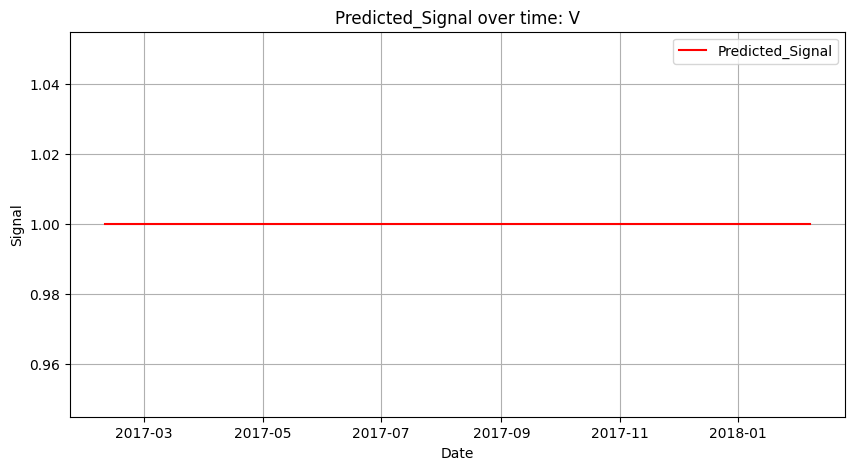

Modeling  MA
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20       0.909     1.130  -979450.0
2013-02-21      -0.559     1.037  -238970.0
2013-02-22      -0.092     0.714  3435200.0
2013-02-25       1.444     1.510  2491830.0
2013-02-26       0.384     0.841  2014870.0
...                ...       ...        ...
2018-02-01      -0.420     5.715  2779992.0
2018-02-02       1.350     6.690  2936034.0
2018-02-05       2.780     7.950  4467542.0
2018-02-06      -8.780    12.560  5004331.0
2018-02-07       0.270     5.160  4177107.0

[1252 rows x 3 columns]
Test accuracy: 0.5936254980079682
Train accuracy: 0.5574425574425574
              open    high     low   close   volume Ticks  Vol7-Vol1  \
date                                                                   
2017-02-09  106.73  107.54  106.50  107.30  2679439    MA -3476589.0   
2017-02-10  107.55  107.64  107.20  107.27  2078832    MA -3470337.0   
2017-02-13  107.70  108.33  107.5

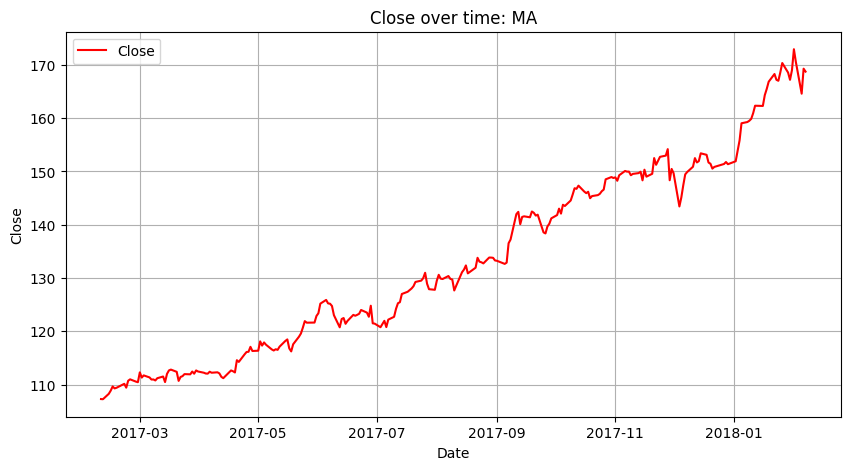

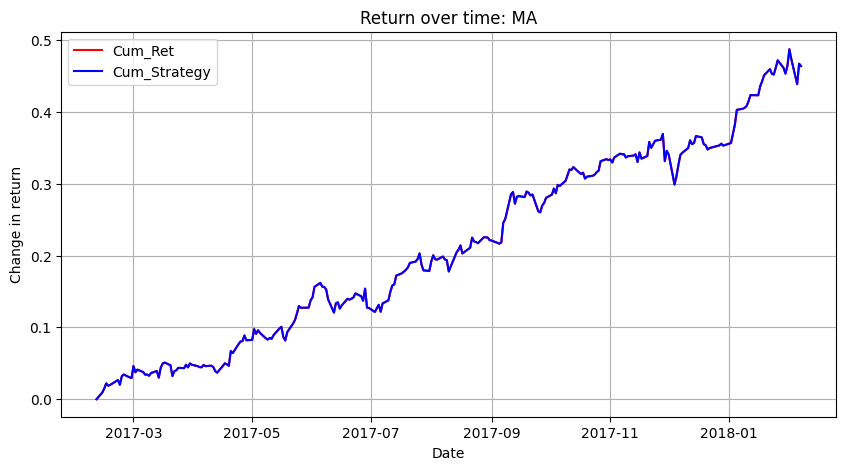

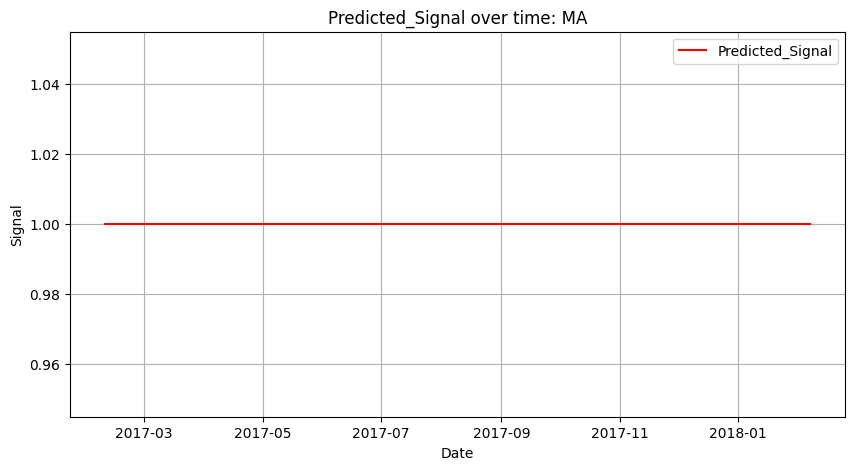

Modeling  COST
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20        1.10     1.580   167885.0
2013-02-21        0.48     1.160   457637.0
2013-02-22       -0.09     1.070  1527239.0
2013-02-25        1.55     2.070   351759.0
2013-02-26        0.65     1.457  -567169.0
...                ...       ...        ...
2018-02-01       -0.06     2.960   365855.0
2018-02-02        0.26     2.800  -702661.0
2018-02-05        7.89     9.575 -1172128.0
2018-02-06       -6.10     9.040   650981.0
2018-02-07        1.41     3.120  2036828.0

[1252 rows x 3 columns]
Test accuracy: 0.5577689243027888
Train accuracy: 0.5224775224775224
              open     high       low   close   volume Ticks  Vol7-Vol1  \
date                                                                      
2017-02-09  168.45  171.415  168.1700  170.96  2606898  COST   293326.0   
2017-02-10  171.65  172.270  170.2700  172.00  2070000  COST   387216.0   
2017-02-13  172.49 

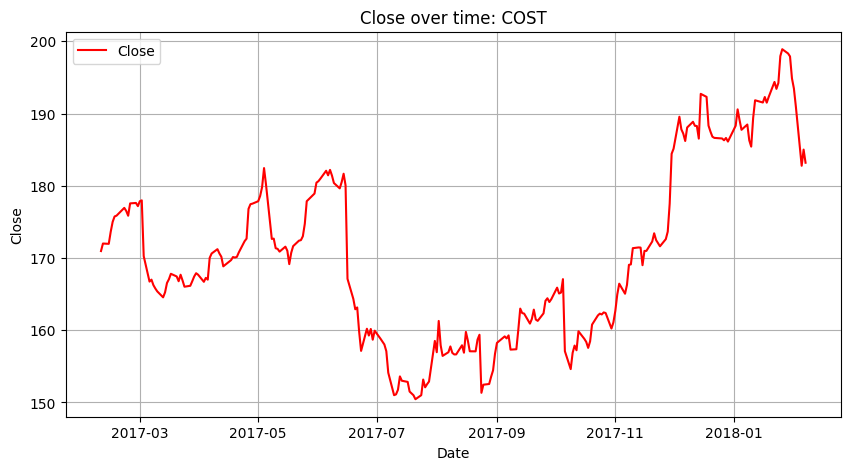

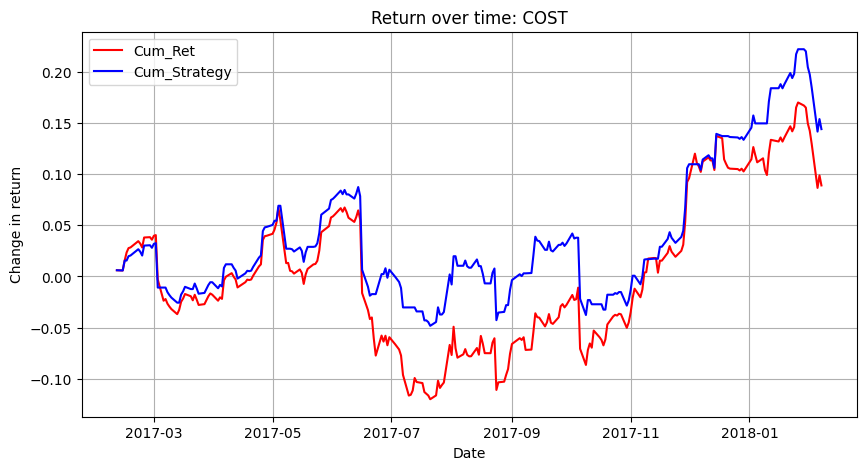

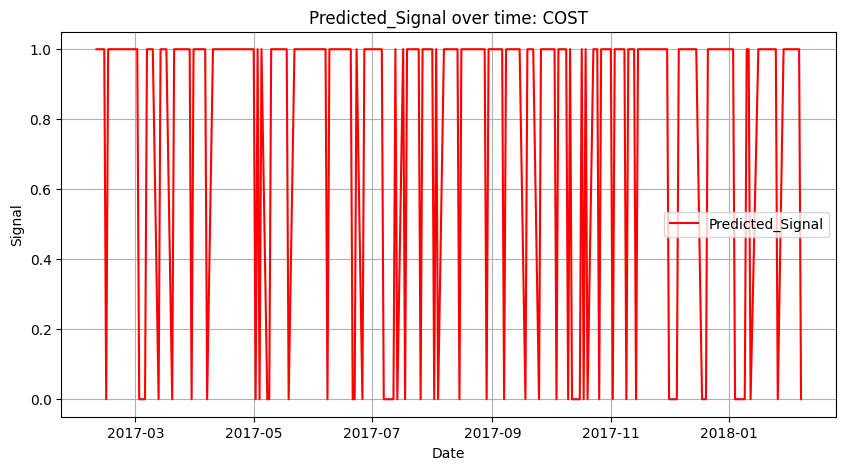

Modeling  PEP
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20       -0.13    0.5700  7104299.0
2013-02-21       -0.09    0.7200  3894106.0
2013-02-22       -0.15    0.4400  -752695.0
2013-02-25        0.49    1.2400 -7058957.0
2013-02-26       -0.22    0.7701  -557538.0
...                ...       ...        ...
2018-02-01       -0.38    1.7300   481186.0
2018-02-02        1.24    1.8800    40411.0
2018-02-05        4.11    5.2499   635890.0
2018-02-06       -1.12    3.8000  1353786.0
2018-02-07        0.47    3.0200  2788342.0

[1252 rows x 3 columns]
Test accuracy: 0.5139442231075697
Train accuracy: 0.5244755244755245
              open     high       low   close   volume Ticks  Vol7-Vol1  \
date                                                                      
2017-02-09  105.42  106.490  105.0200  105.97  4012387   PEP  -439558.0   
2017-02-10  105.83  106.345  105.5868  106.10  2475506   PEP   496809.0   
2017-02-13  106.50  

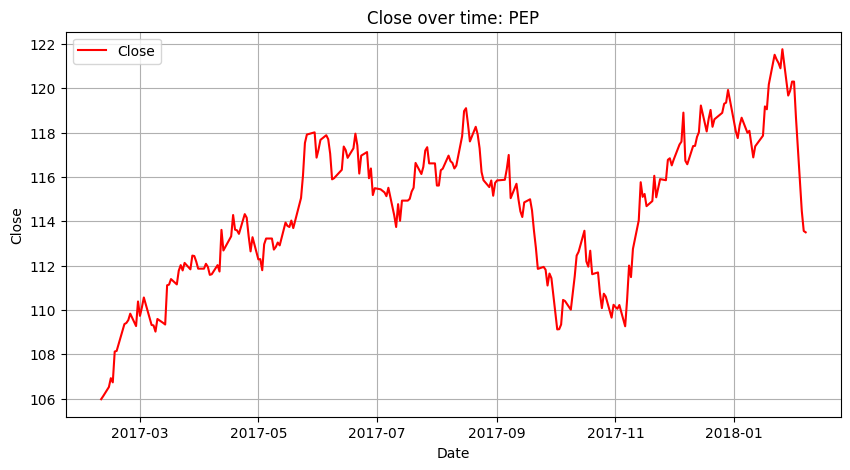

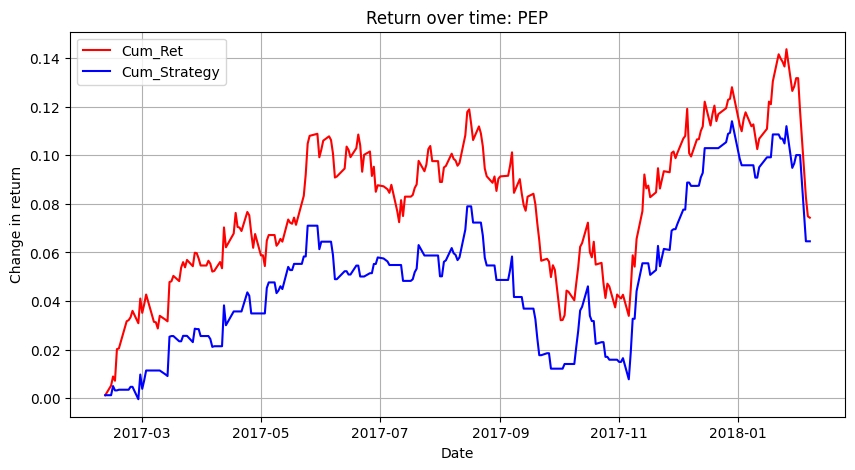

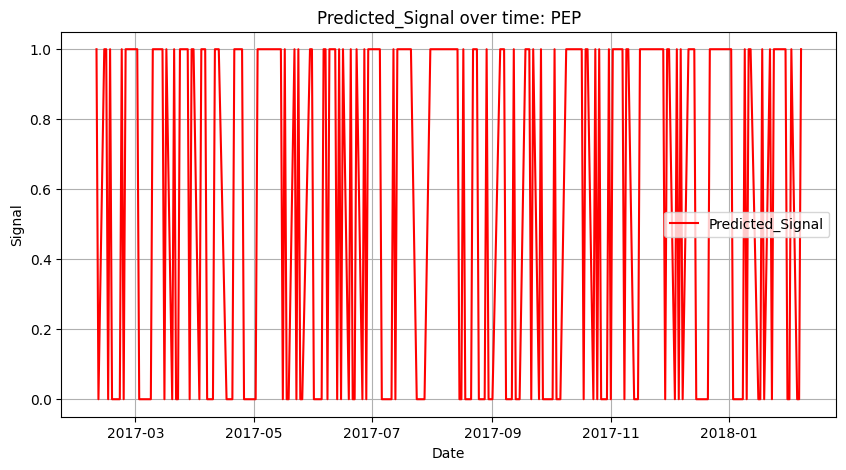

Modeling  CAT
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20        1.78    2.0500   434631.0
2013-02-21        1.23    2.2200  5831895.0
2013-02-22        0.45    1.4400  3045897.0
2013-02-25        2.65    3.1400  2133327.0
2013-02-26       -0.36    1.7000  3953988.0
...                ...       ...        ...
2018-02-01       -1.00    3.5600  1977536.0
2018-02-02        3.28    4.2700 -3917357.0
2018-02-05        3.85   16.0800 -9334304.0
2018-02-06       -8.34    9.7499  2345290.0
2018-02-07        1.02    3.8100  4411845.0

[1252 rows x 3 columns]
Test accuracy: 0.44223107569721115
Train accuracy: 0.5304695304695305
             open    high    low  close   volume Ticks  Vol7-Vol1  Open-Close  \
date                                                                            
2017-02-09  93.06  94.180  92.69  93.96  3994308   CAT -1641149.0       -0.90   
2017-02-10  94.87  96.620  94.50  96.31  5600224   CAT   411809.0       -1.4

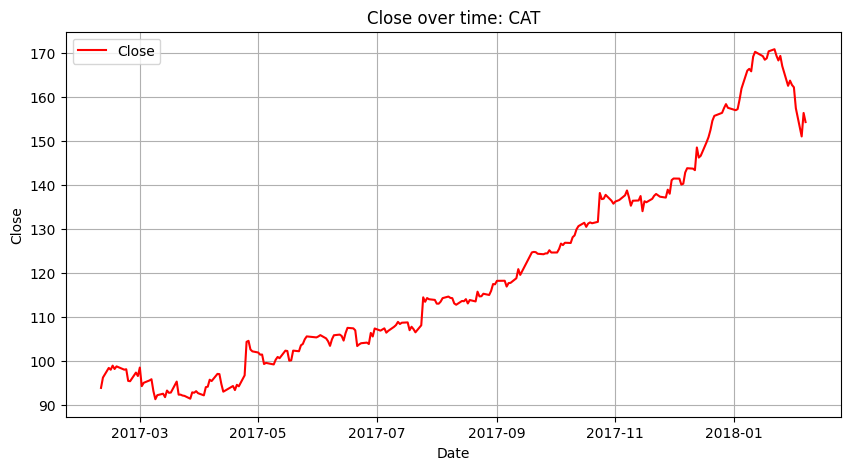

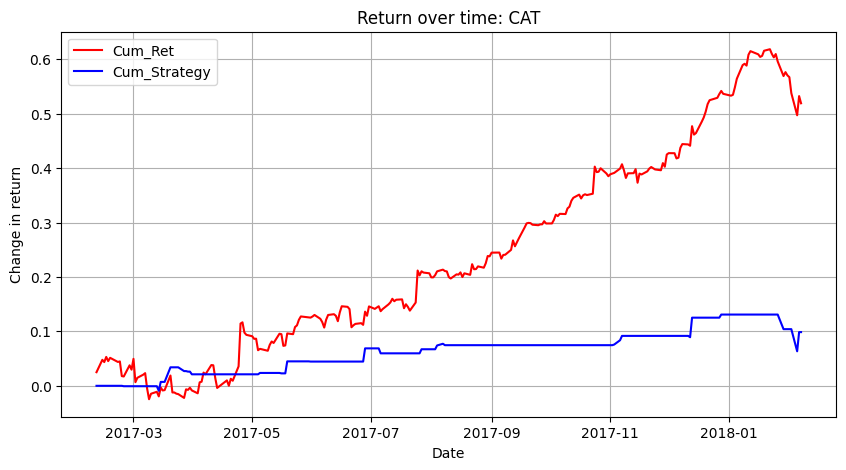

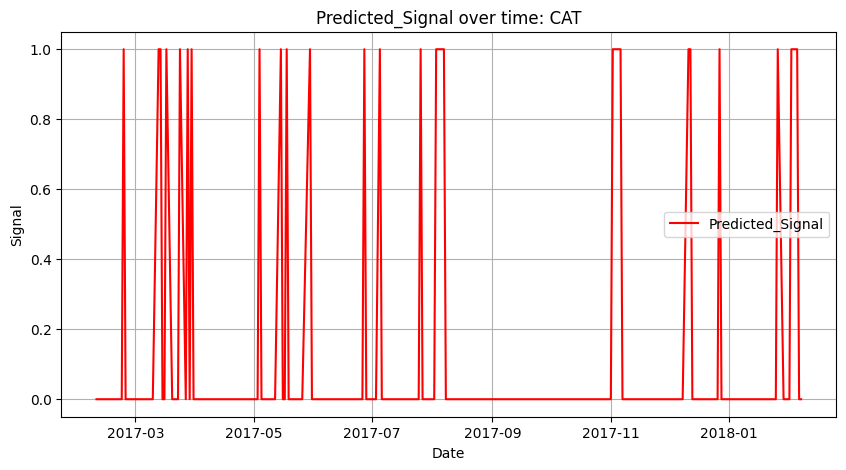

Modeling  WM
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20        0.00     0.220 -1067578.0
2013-02-21        0.06     0.350   369978.0
2013-02-22       -0.11     0.271   549700.0
2013-02-25        0.36     0.400 -1193826.0
2013-02-26       -0.12     0.320 -2558166.0
...                ...       ...        ...
2018-02-01        0.62     1.220   424690.0
2018-02-02        0.73     1.550   592954.0
2018-02-05        4.35     4.720   678739.0
2018-02-06       -0.89     4.099  2249621.0
2018-02-07        0.15     1.840  4372526.0

[1252 rows x 3 columns]
Test accuracy: 0.5776892430278885
Train accuracy: 0.5374625374625375
             open    high    low  close   volume Ticks  Vol7-Vol1  Open-Close  \
date                                                                            
2017-02-09  69.89  70.305  69.74  70.25  1512116    WM   230440.0       -0.36   
2017-02-10  70.16  70.830  70.04  70.54  1617277    WM  -206854.0       -0.38 

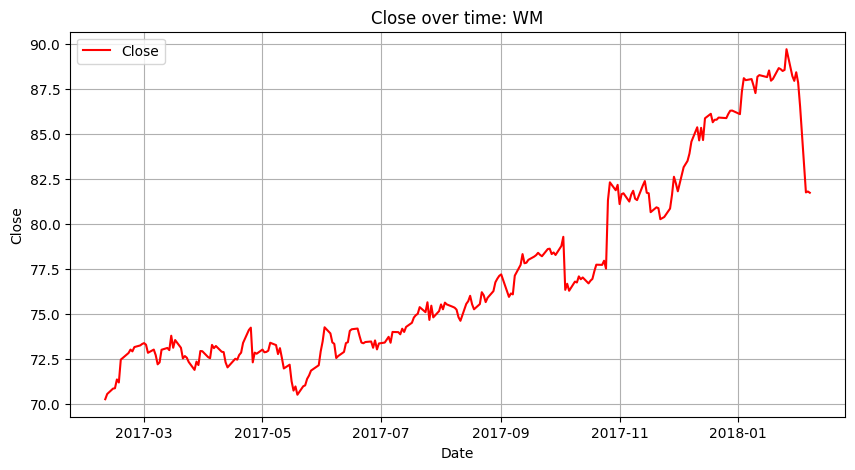

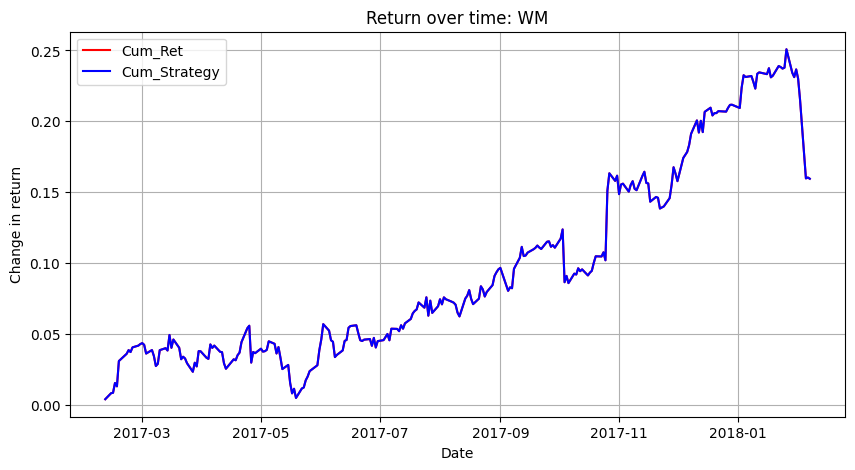

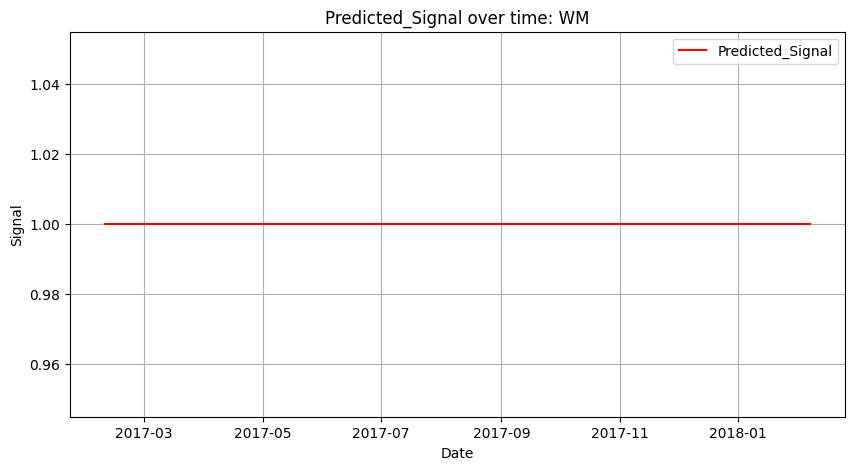

Modeling  ITW
            Open-Close  High-Low  Vol7-Vol1
date                                       
2013-02-20        0.90    1.0800  1354234.0
2013-02-21        1.19    1.4600   338787.0
2013-02-22        0.40    0.9289  1317530.0
2013-02-25        2.00    2.1400  1341157.0
2013-02-26       -0.09    0.6200  1092552.0
...                ...       ...        ...
2018-02-01       -0.48    2.9199    32003.0
2018-02-02        1.53    3.4000 -1030963.0
2018-02-05        8.41   10.8700   -16657.0
2018-02-06       -5.93    8.7390   217076.0
2018-02-07        0.21    4.5300   970622.0

[1252 rows x 3 columns]
Test accuracy: 0.5816733067729084
Train accuracy: 0.5444555444555444
              open    high     low   close   volume Ticks  Vol7-Vol1  \
date                                                                   
2017-02-09  127.30  128.26  127.15  127.26  1164117   ITW  -904924.0   
2017-02-10  127.64  128.10  127.18  128.00   725736   ITW  -207315.0   
2017-02-13  128.34  129.64  128.

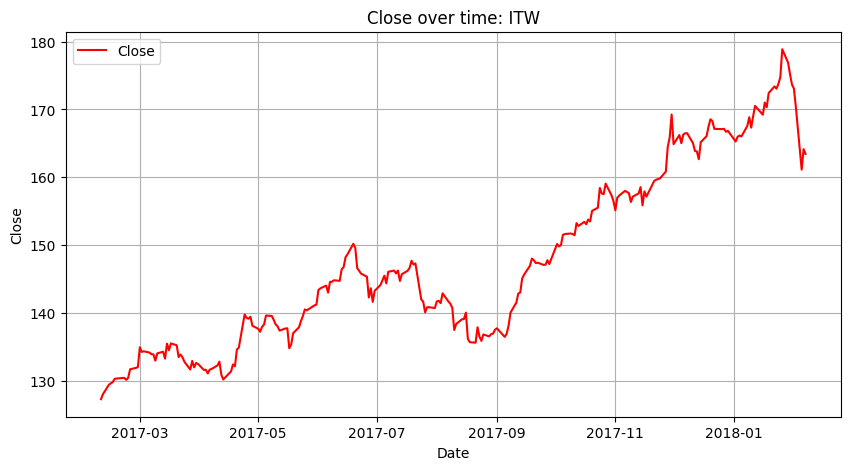

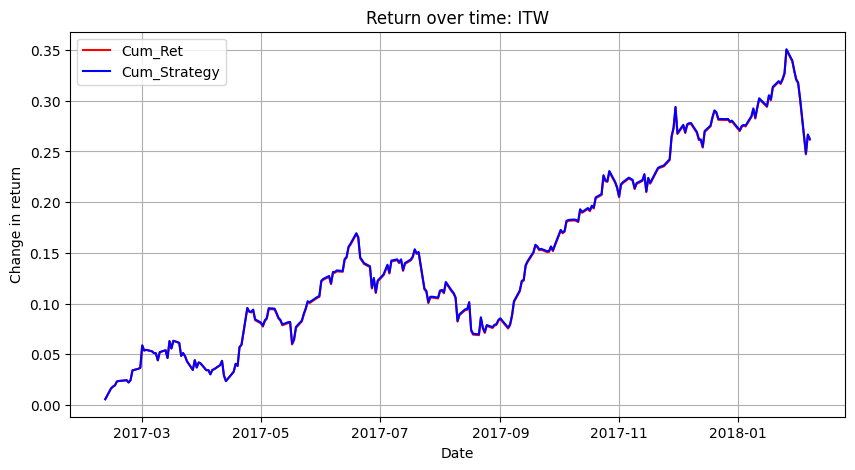

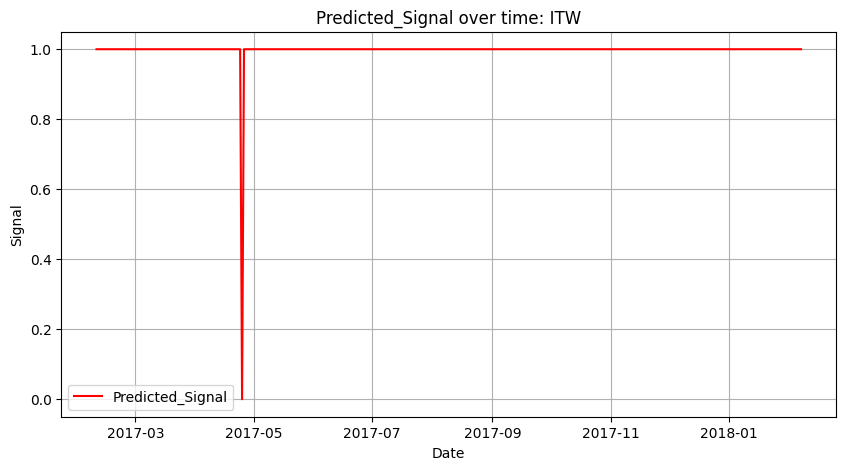

In [8]:
###############
# Section three - Change in Volume feature
###############

# Try this by looping through multiple stock symbols

################
# Here we a a festure for change in close value over the last 14 days
# This feature does not seem to help much
################


# Either pick a few stocks to try
tick_names = ['AMZN', 'AAPL', 'MSFT', 'WMT', 'V', 'MA', 'COST', 'PEP', 'CAT', 'WM', 'ITW']

# OR do it for all stocks
#tick_names = unique_values

# Train a model for each stock
for name in tick_names:
    print("Modeling ", name)
    stock = df.loc[df['Ticks'] == name]
    stock.index = pd.to_datetime(stock['date']) 

    # Try comparing ranges of volume values over a 14 day range
    stock['Vol7-Vol1'] = stock['volume'].shift(1) - stock['volume'].shift(7)
    
    stock = stock.drop(['date'], axis='columns') 
    stock['Open-Close'] = stock['open'] - stock['close']
    stock['High-Low'] = stock['high'] - stock['low']

    # Due to the 14 day feature above, I drop the nan rows (first 14 days)
    stock.dropna(inplace=True)
      
    # Store all predictor variables in a variable X 
    X = stock[['Open-Close', 'High-Low', 'Vol7-Vol1']] 
    print(X)
    y = np.where(stock['close'].shift(-1) > stock['close'], 1, 0) 
    split_percentage = 0.8
    split = int(split_percentage*len(stock)) 
      
    # Train data set 
    X_train = X[:split] 
    y_train = y[:split] 
      
    # Test data set 
    X_test = X[split:] 
    y_test = y[split:]

    svm = SVC()
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)

    accuracy = accuracy_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)

    # Only show the returns of the test period:

    stock_future = stock[split:]

    stock_future['Predicted_Signal'] = cls.predict(X_test)
    stock_future['Return'] = stock_future['close'].pct_change()
    stock_future['Strategy_Return'] = stock_future.Return * stock_future.Predicted_Signal.shift(1)
    stock_future['Cum_Ret'] = stock_future['Return'].cumsum() 
    stock_future['Cum_Strategy'] = stock_future['Strategy_Return'].cumsum() 

    print(stock_future.head())

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['close'],color='red', label="Close") 
    plt.title('Close over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Close')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Cum_Ret'],color='red', label="Cum_Ret") 
    plt.plot(stock_future['Cum_Strategy'],color='blue', label="Cum_Strategy")
    plt.title('Return over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Change in return')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Predicted_Signal'],color='red', label="Predicted_Signal") 
    plt.title('Predicted_Signal over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Signal')
    plt.legend()
    plt.grid(True)
    plt.show()


    # # Plot the decision boundary surface, warning his takes a LONG time to run
    # fig, ax = plt.subplots()

    # title = ('Decsion boundary of rbf SVM for Open-Close and High-Low features: ' + name)
    # # Get Y
    # y = y_train
    
    # # Set-up grid for plotting.
    # X0, X1 = X_train['Open-Close'].to_numpy(), X_train['High-Low'].to_numpy()
    # xx, yy = make_meshgrid(X0, X1)
    
    # plot_contours(ax, cls, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    # ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    # ax.set_ylabel('High-Low')
    # ax.set_xlabel('Open-Close')
    # ax.set_xticks(())
    # ax.set_yticks(())
    # ax.set_title(title)
    # ax.legend()
    # plt.show()



Modeling  AMZN
            Open-Close  High-Low
date                            
2013-02-08       -0.55     4.695
2013-02-11        5.99     6.650
2013-02-12        0.49     3.160
2013-02-13       -7.94     9.660
2013-02-14       -1.87     5.250
...                ...       ...
2018-02-01       55.00    74.740
2018-02-02       47.44    84.000
2018-02-05       12.62   138.260
2018-02-06      -81.38    92.200
2018-02-07       32.22    45.840

[1259 rows x 2 columns]
Test accuracy: 0.5714285714285714
Train accuracy: 0.535253227408143
              open      high       low   close   volume Ticks  Open-Close  \
date                                                                        
2017-02-08  812.69  821.4790  812.5000  819.71  2857985  AMZN       -7.02   
2017-02-09  821.60  825.0000  819.7100  821.36  2484948  AMZN        0.24   
2017-02-10  823.82  828.0000  822.8500  827.46  2429609  AMZN       -3.64   
2017-02-13  831.62  842.9999  828.5500  836.53  4172618  AMZN       -4.91   
2

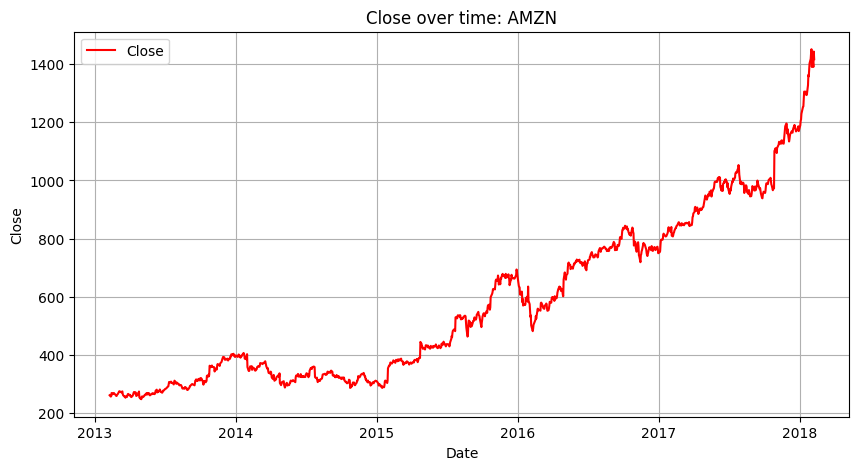

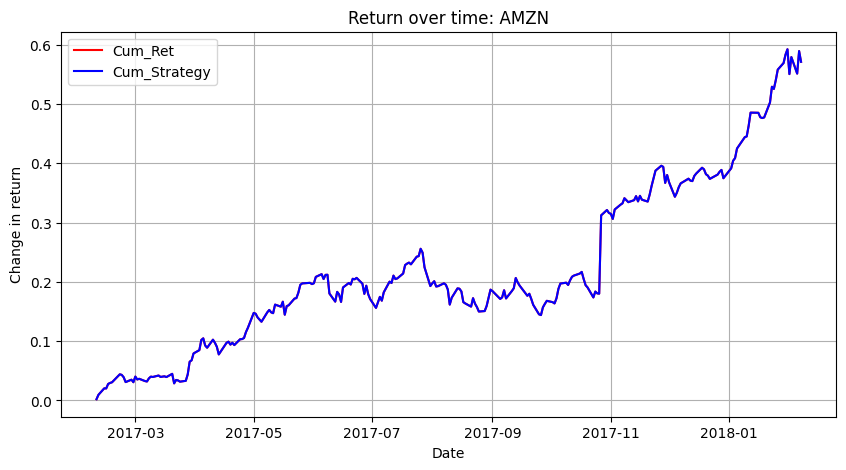

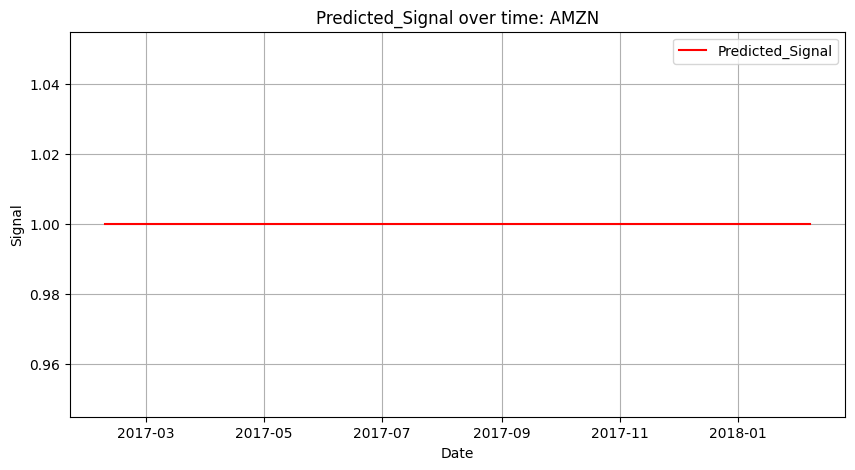

Modeling  AAPL
            Open-Close  High-Low
date                            
2013-02-08     -0.1400    1.5086
2013-02-11     -0.4900    1.6700
2013-02-12      1.6586    2.0909
2013-02-13      0.0286    1.4886
2013-02-14     -0.2957    1.0886
...                ...       ...
2018-02-01     -0.6150    1.8600
2018-02-02      5.5000    6.7000
2018-02-05      2.6100    7.8800
2018-02-06     -8.2000    9.7200
2018-02-07      3.5450    4.3315

[1259 rows x 2 columns]
Test accuracy: 0.5
Train accuracy: 0.5362462760675273
              open     high     low   close    volume Ticks  Open-Close  \
date                                                                      
2017-02-08  131.35  132.220  131.22  132.04  23004072  AAPL       -0.69   
2017-02-09  131.65  132.445  131.12  132.42  28349859  AAPL       -0.77   
2017-02-10  132.46  132.940  132.05  132.12  20065458  AAPL        0.34   
2017-02-13  133.08  133.820  132.75  133.29  23035421  AAPL       -0.21   
2017-02-14  133.47  135.090

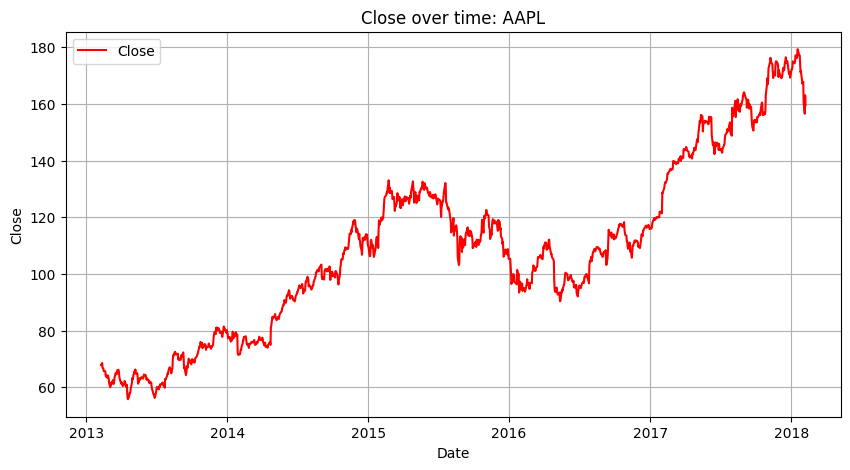

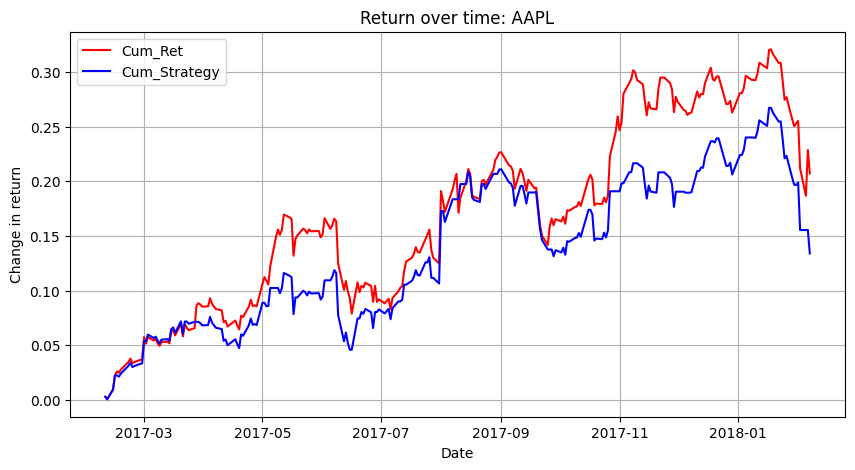

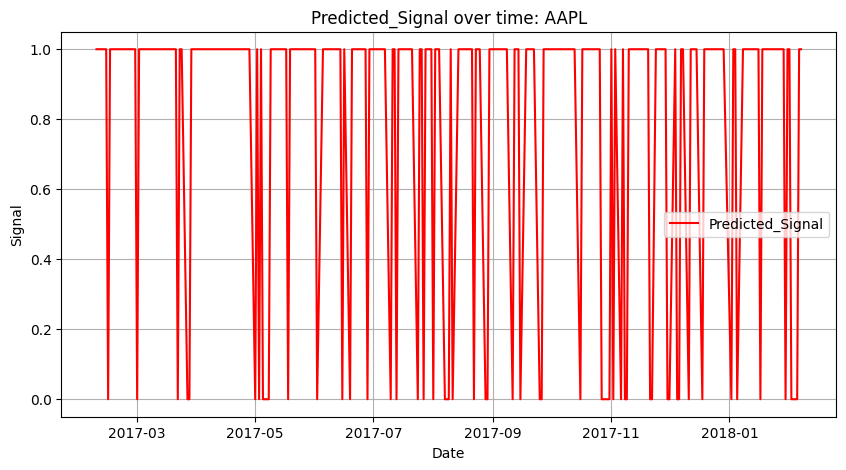

Modeling  MSFT
            Open-Close  High-Low
date                            
2013-02-08       -0.20    0.4000
2013-02-11       -0.21    0.4200
2013-02-12        0.00    0.2500
2013-02-13       -0.10    0.2300
2013-02-14       -0.12    0.1900
...                ...       ...
2018-02-01        0.53    2.4887
2018-02-02        1.86    2.4700
2018-02-05        2.56    5.2400
2018-02-06       -4.44    6.2250
2018-02-07        0.88    2.5700

[1259 rows x 2 columns]
Test accuracy: 0.5555555555555556
Train accuracy: 0.5441906653426017
             open    high     low  close    volume Ticks  Open-Close  \
date                                                                   
2017-02-08  63.57  63.810  63.220  63.34  18096358  MSFT        0.23   
2017-02-09  63.52  64.435  63.320  64.06  22644443  MSFT       -0.54   
2017-02-10  64.25  64.300  63.975  64.00  18170729  MSFT        0.25   
2017-02-13  64.24  64.860  64.130  64.72  22920101  MSFT       -0.48   
2017-02-14  64.41  64.720  64.

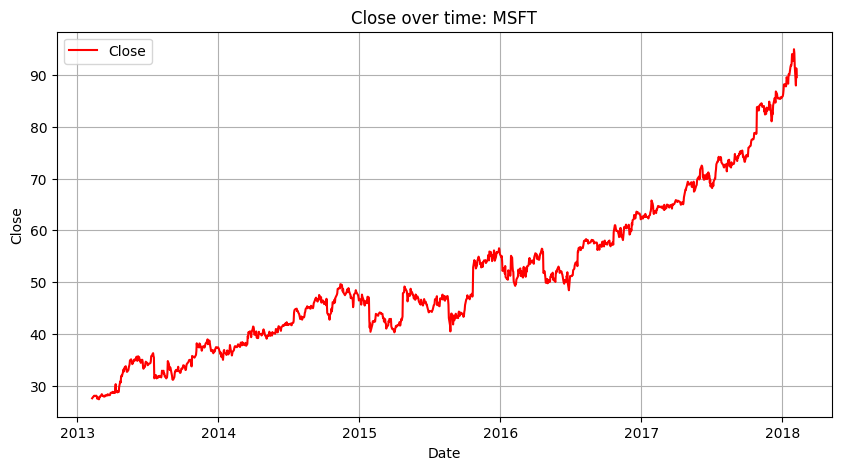

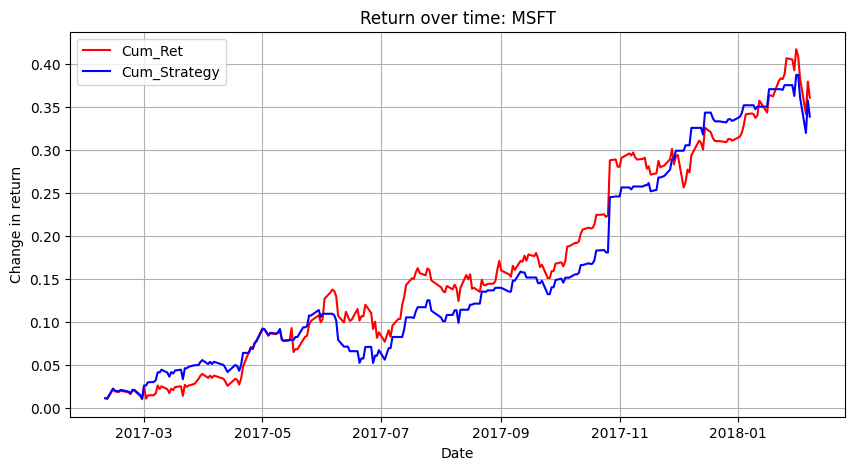

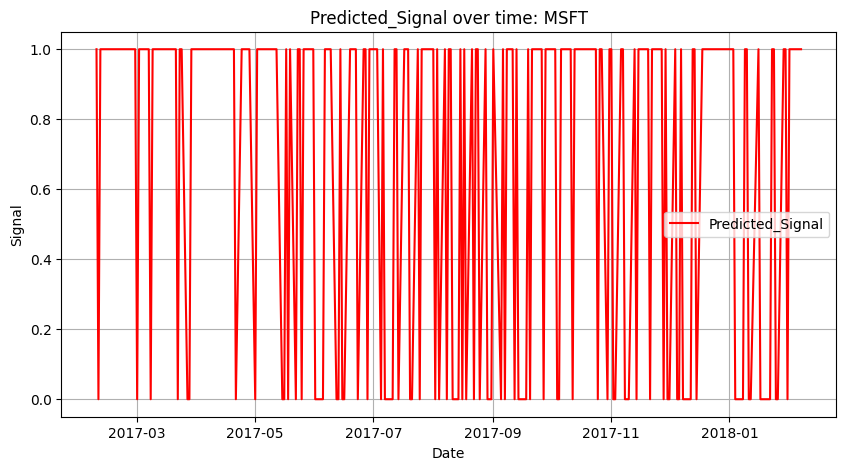

Modeling  WMT
            Open-Close  High-Low
date                            
2013-02-08       -0.28     0.570
2013-02-11       -0.15     0.980
2013-02-12        0.09     0.560
2013-02-13       -0.10     0.490
2013-02-14        0.28     0.475
...                ...       ...
2018-02-01        0.44     1.380
2018-02-02        0.67     2.320
2018-02-05        3.31     7.520
2018-02-06       -3.26     3.830
2018-02-07       -2.35     4.580

[1259 rows x 2 columns]
Test accuracy: 0.4880952380952381
Train accuracy: 0.5431976166832175
             open   high    low  close    volume Ticks  Open-Close  High-Low  \
date                                                                           
2017-02-08  66.89  67.82  66.89  67.81   7660755   WMT       -0.92      0.93   
2017-02-09  67.80  69.14  67.75  69.08  11080479   WMT       -1.28      1.39   
2017-02-10  68.25  68.60  67.76  68.02  12445633   WMT        0.23      0.84   
2017-02-13  68.32  68.65  67.56  67.77   8374307   WMT        0

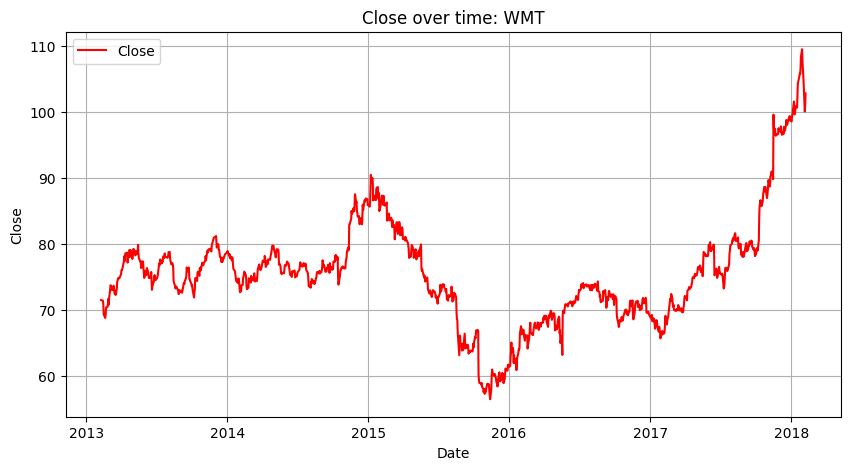

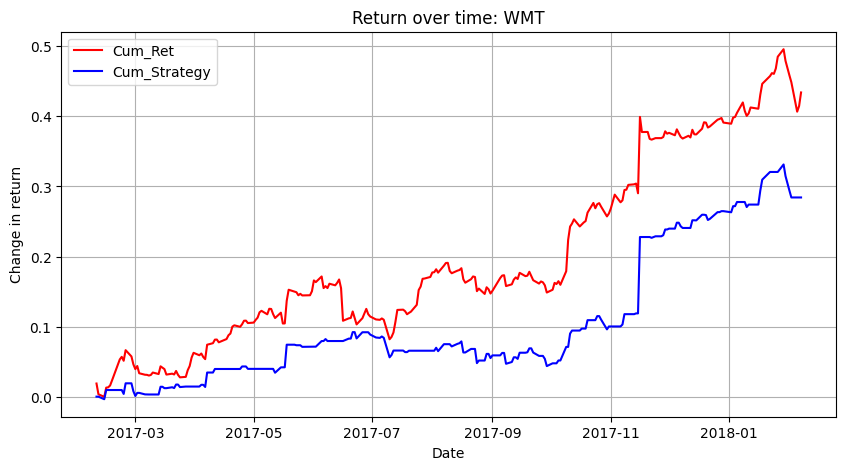

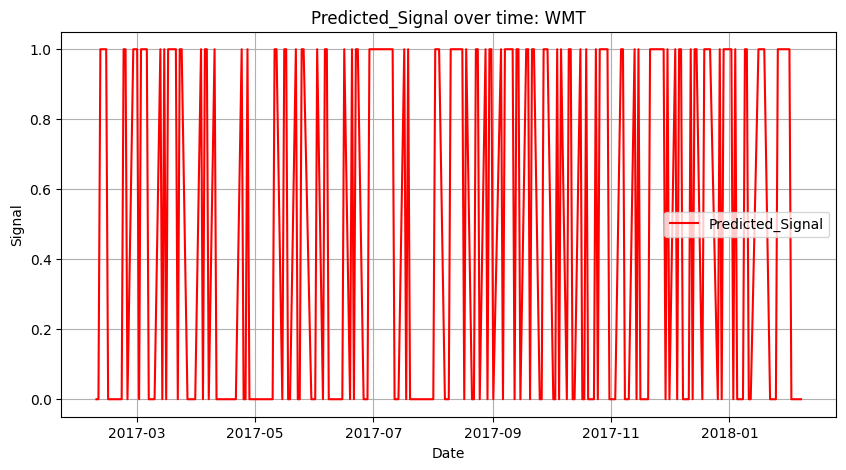

Modeling  V
            Open-Close  High-Low
date                            
2013-02-08     -0.1000    0.4600
2013-02-11      0.3125    0.5575
2013-02-12      0.0100    0.3200
2013-02-13      0.4200    0.8125
2013-02-14     -0.3450    0.5875
...                ...       ...
2018-02-01     -0.9800    2.1600
2018-02-02      2.8100    3.0200
2018-02-05      2.4300    6.1200
2018-02-06     -4.7700    7.0500
2018-02-07      0.4400    3.2500

[1259 rows x 2 columns]
Test accuracy: 0.5873015873015873
Train accuracy: 0.548162859980139
             open   high    low  close    volume Ticks  Open-Close  High-Low  \
date                                                                           
2017-02-08  85.80  85.84  85.08  85.09   7587713     V        0.71      0.76   
2017-02-09  85.37  85.77  84.88  85.58   6554731     V       -0.21      0.89   
2017-02-10  85.80  86.14  85.23  85.90  10431983     V       -0.10      0.91   
2017-02-13  86.20  86.70  86.00  86.44   6046310     V       -0.24

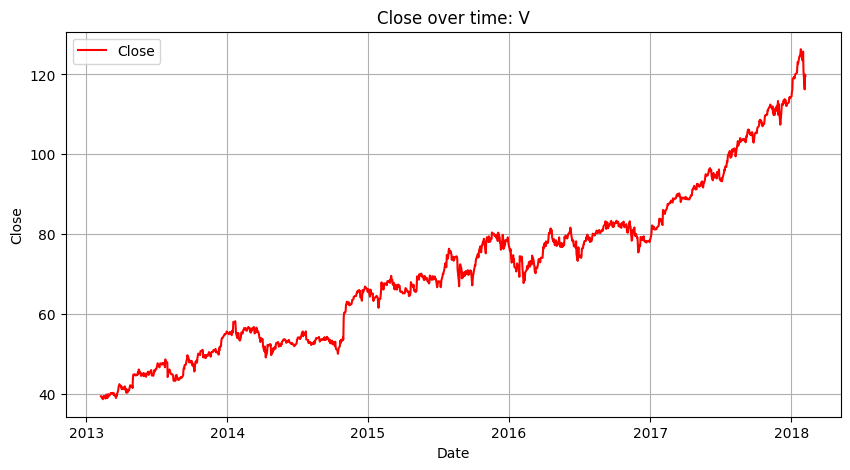

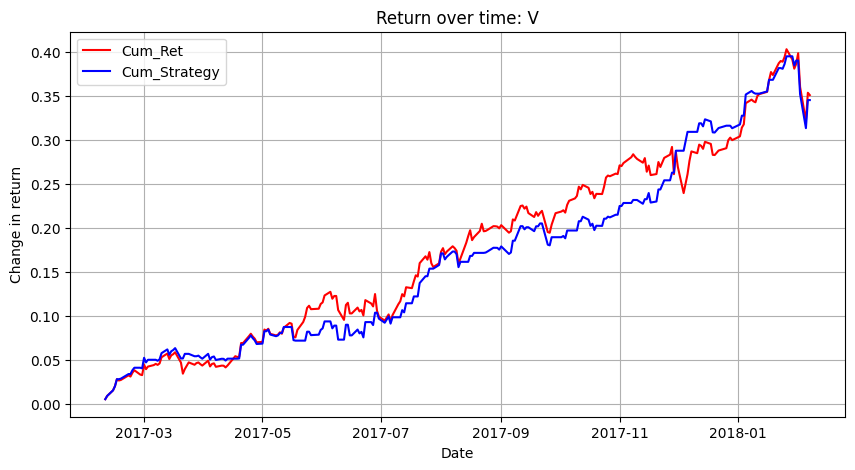

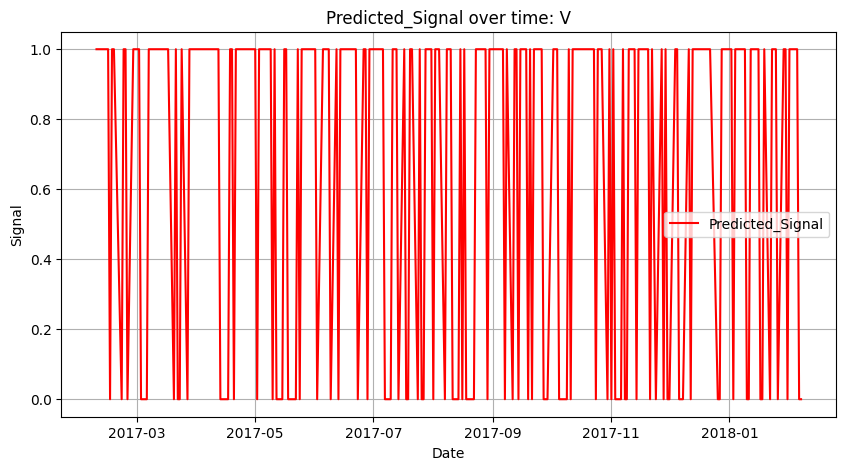

Modeling  MA
            Open-Close  High-Low
date                            
2013-02-08      -0.601    0.6160
2013-02-11       0.477    0.6925
2013-02-12       0.122    0.3620
2013-02-13       0.204    0.5720
2013-02-14      -0.601    0.7110
...                ...       ...
2018-02-01      -0.420    5.7150
2018-02-02       1.350    6.6900
2018-02-05       2.780    7.9500
2018-02-06      -8.780   12.5600
2018-02-07       0.270    5.1600

[1259 rows x 2 columns]
Test accuracy: 0.5912698412698413
Train accuracy: 0.5600794438927508
              open    high     low   close   volume Ticks  Open-Close  \
date                                                                    
2017-02-08  106.55  106.90  105.80  106.72  2993641    MA       -0.17   
2017-02-09  106.73  107.54  106.50  107.30  2679439    MA       -0.57   
2017-02-10  107.55  107.64  107.20  107.27  2078832    MA        0.28   
2017-02-13  107.70  108.33  107.54  108.28  2337277    MA       -0.58   
2017-02-14  108.01  109.21

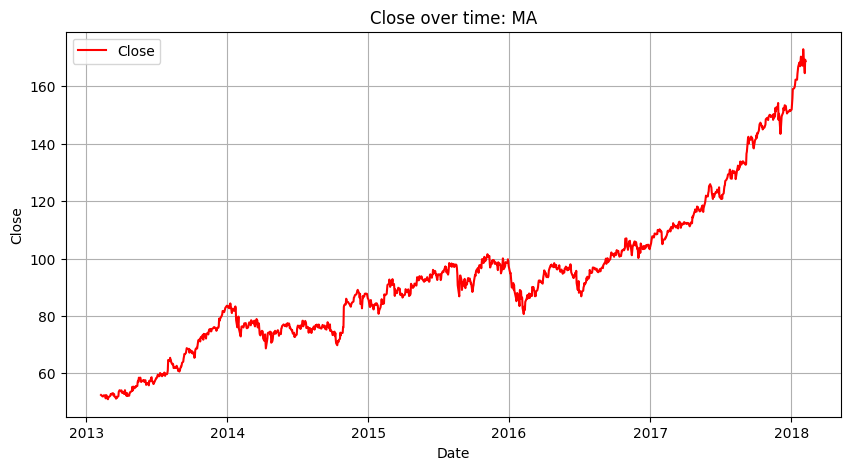

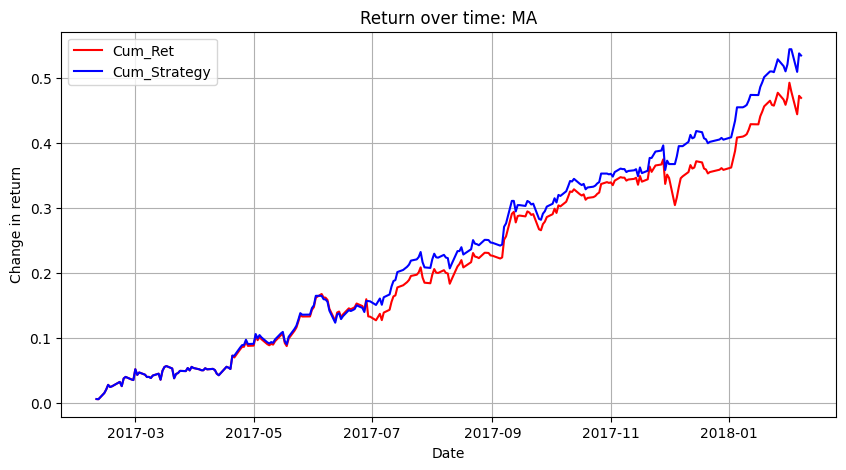

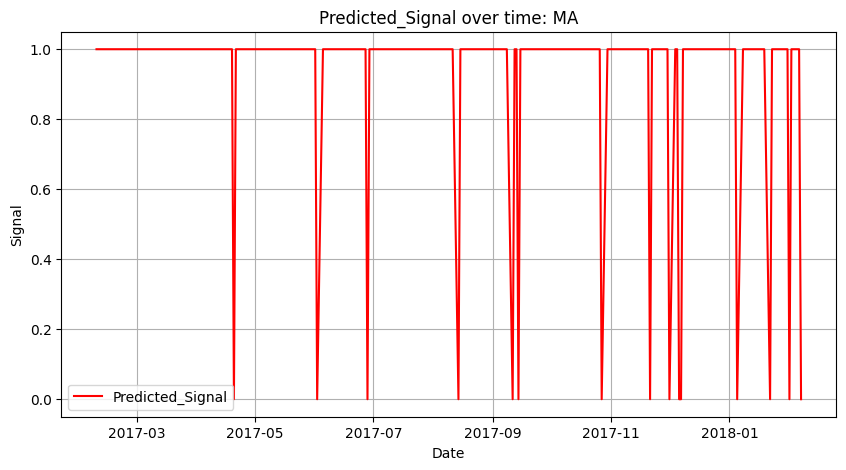

Modeling  COST
            Open-Close  High-Low
date                            
2013-02-08       -0.41     1.150
2013-02-11        0.88     1.180
2013-02-12        0.45     0.700
2013-02-13        0.35     1.420
2013-02-14       -0.98     1.048
...                ...       ...
2018-02-01       -0.06     2.960
2018-02-02        0.26     2.800
2018-02-05        7.89     9.575
2018-02-06       -6.10     9.040
2018-02-07        1.41     3.120

[1259 rows x 2 columns]
Test accuracy: 0.4722222222222222
Train accuracy: 0.5302879841112215
              open     high     low   close   volume Ticks  Open-Close  \
date                                                                     
2017-02-08  167.50  168.570  167.50  168.42  2089921  COST       -0.92   
2017-02-09  168.45  171.415  168.17  170.96  2606898  COST       -2.51   
2017-02-10  171.65  172.270  170.27  172.00  2070000  COST       -0.35   
2017-02-13  172.49  172.490  170.78  171.96  2272213  COST        0.53   
2017-02-14  171.66

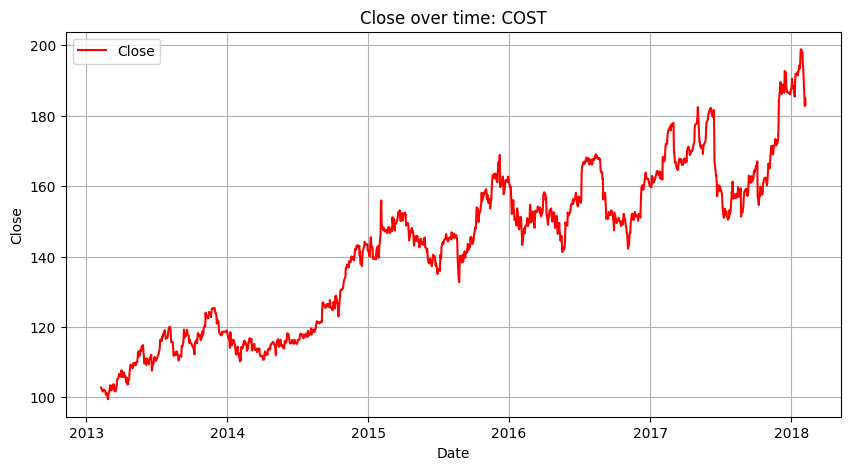

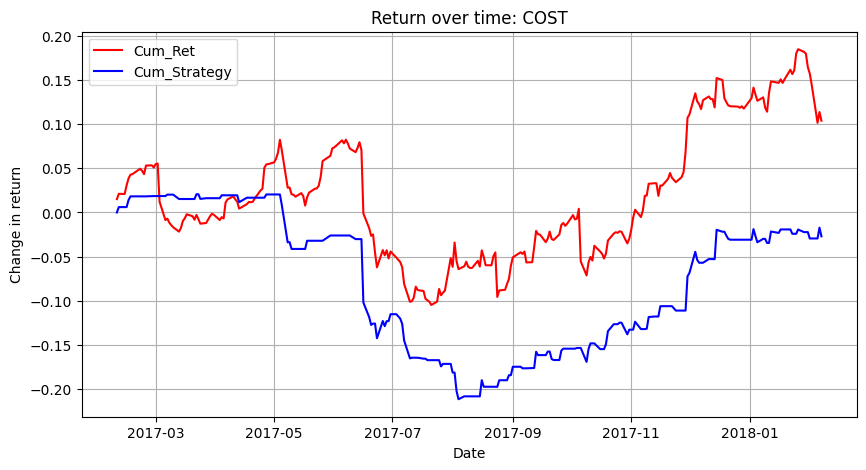

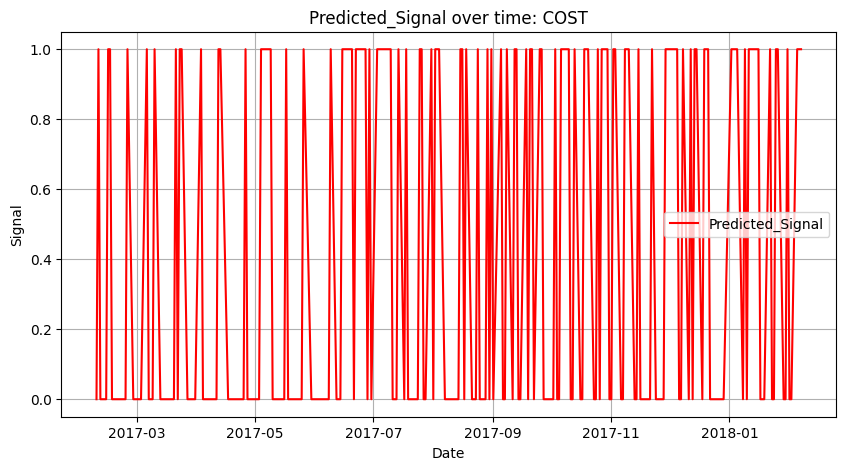

Modeling  PEP
            Open-Close  High-Low
date                            
2013-02-08        0.16    0.4000
2013-02-11        0.14    0.4400
2013-02-12        0.25    0.3900
2013-02-13        0.74    1.3900
2013-02-14       -0.16    1.7000
...                ...       ...
2018-02-01       -0.38    1.7300
2018-02-02        1.24    1.8800
2018-02-05        4.11    5.2499
2018-02-06       -1.12    3.8000
2018-02-07        0.47    3.0200

[1259 rows x 2 columns]
Test accuracy: 0.5357142857142857
Train accuracy: 0.5422045680238332
              open     high       low   close   volume Ticks  Open-Close  \
date                                                                       
2017-02-08  105.50  106.230  105.2500  105.69  3407089   PEP       -0.19   
2017-02-09  105.42  106.490  105.0200  105.97  4012387   PEP       -0.55   
2017-02-10  105.83  106.345  105.5868  106.10  2475506   PEP       -0.27   
2017-02-13  106.50  106.690  105.8800  106.52  3464318   PEP       -0.02   
2017-02

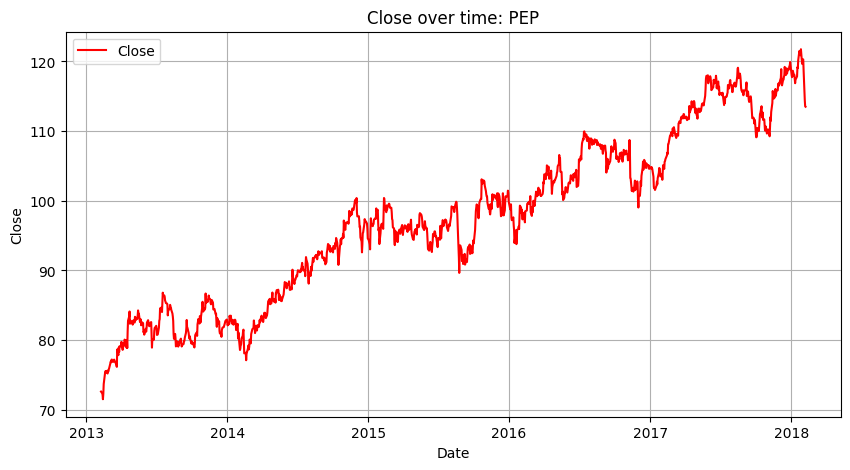

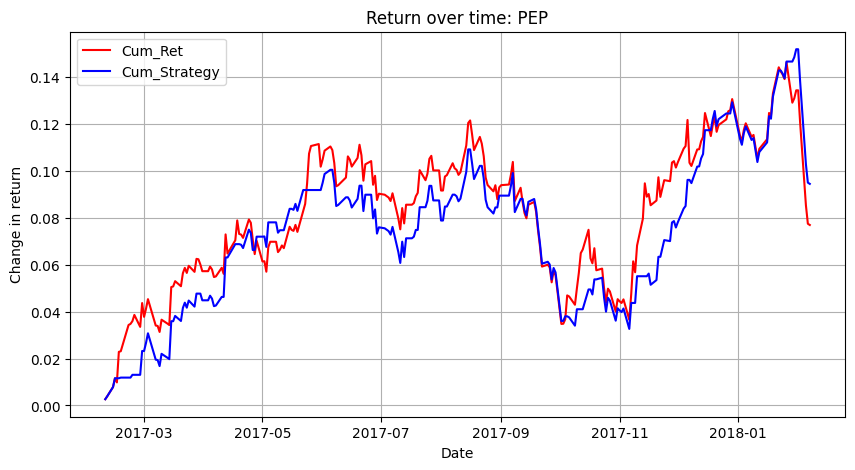

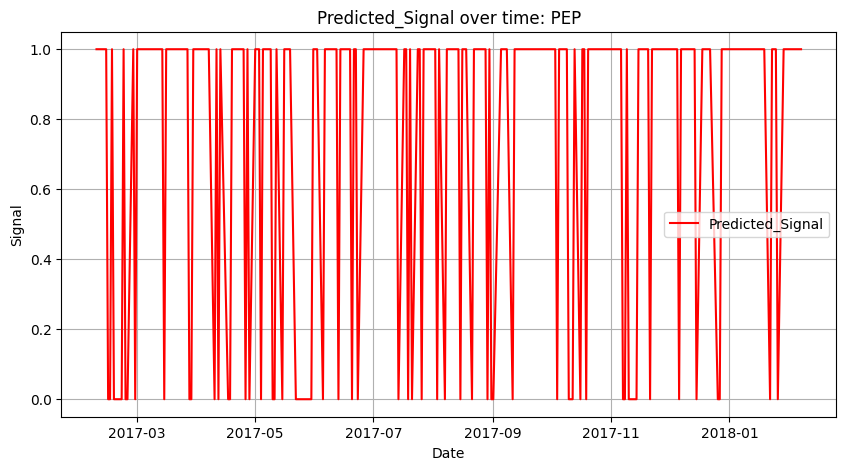

Modeling  CAT
            Open-Close  High-Low
date                            
2013-02-08       -0.75    1.4000
2013-02-11        0.36    0.6900
2013-02-12       -0.55    0.7400
2013-02-13        0.71    1.4800
2013-02-14       -0.01    1.0000
...                ...       ...
2018-02-01       -1.00    3.5600
2018-02-02        3.28    4.2700
2018-02-05        3.85   16.0800
2018-02-06       -8.34    9.7499
2018-02-07        1.02    3.8100

[1259 rows x 2 columns]
Test accuracy: 0.4444444444444444
Train accuracy: 0.5322740814299901
             open    high    low  close   volume Ticks  Open-Close  High-Low  \
date                                                                           
2017-02-08  93.00  93.000  92.11  92.91  4083514   CAT        0.09     0.890   
2017-02-09  93.06  94.180  92.69  93.96  3994308   CAT       -0.90     1.490   
2017-02-10  94.87  96.620  94.50  96.31  5600224   CAT       -1.44     2.120   
2017-02-13  97.69  99.045  97.16  98.50  6995085   CAT       -0

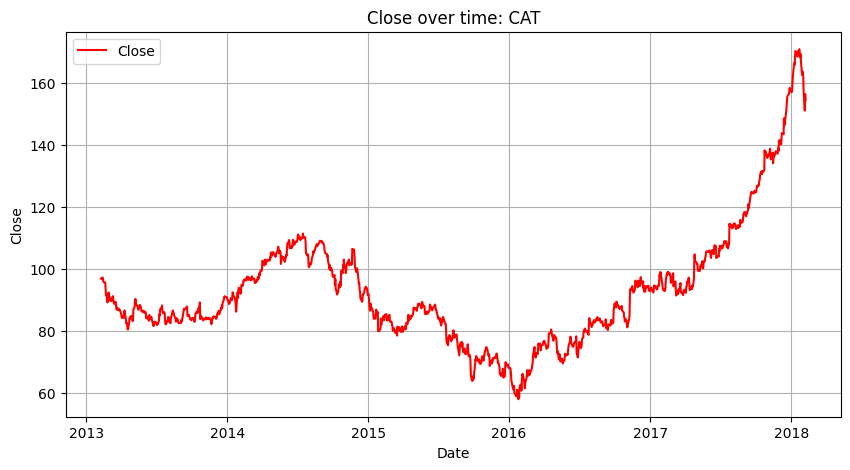

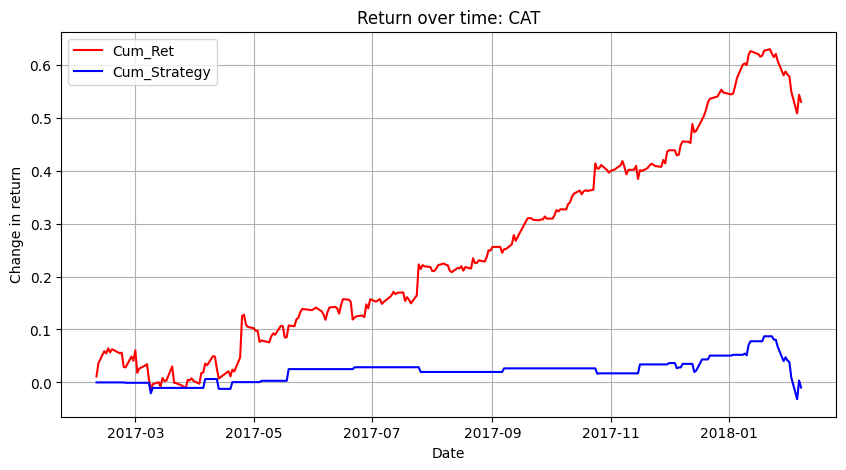

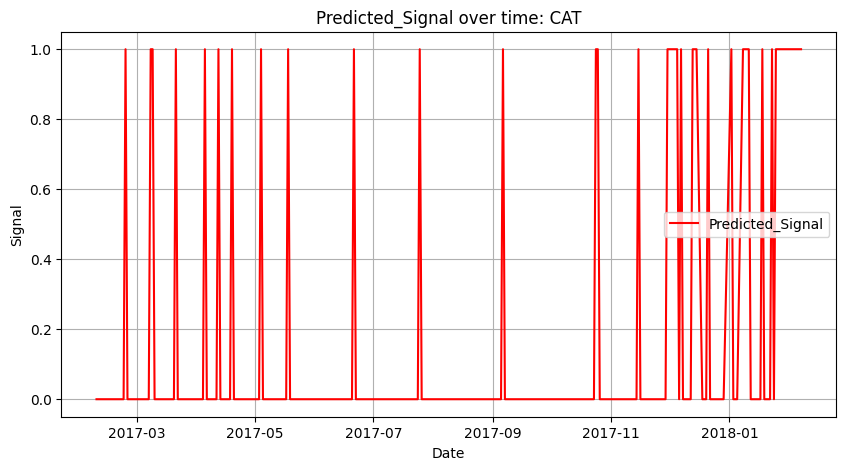

Modeling  WM
            Open-Close  High-Low
date                            
2013-02-08       -0.09    0.5255
2013-02-11        0.00    0.2000
2013-02-12       -0.16    0.2900
2013-02-13       -0.12    0.3772
2013-02-14       -1.15    1.9400
...                ...       ...
2018-02-01        0.62    1.2200
2018-02-02        0.73    1.5500
2018-02-05        4.35    4.7200
2018-02-06       -0.89    4.0990
2018-02-07        0.15    1.8400

[1259 rows x 2 columns]
Test accuracy: 0.5634920634920635
Train accuracy: 0.548162859980139
             open    high    low  close   volume Ticks  Open-Close  High-Low  \
date                                                                           
2017-02-08  69.85  70.130  69.75  70.01  1604552    WM       -0.16     0.380   
2017-02-09  69.89  70.305  69.74  70.25  1512116    WM       -0.36     0.565   
2017-02-10  70.16  70.830  70.04  70.54  1617277    WM       -0.38     0.790   
2017-02-13  70.59  70.990  70.51  70.84  1548833    WM       -0.2

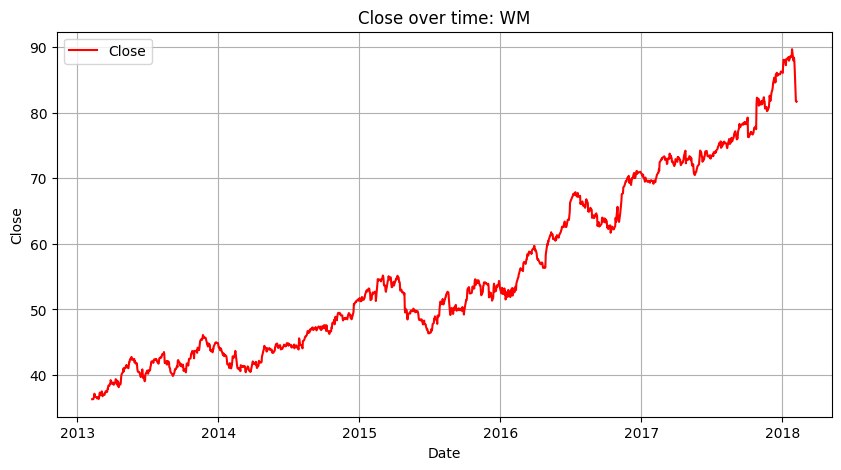

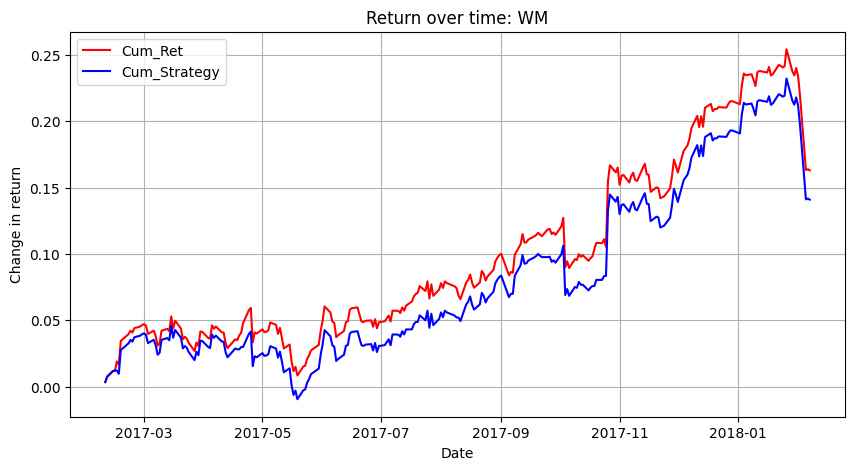

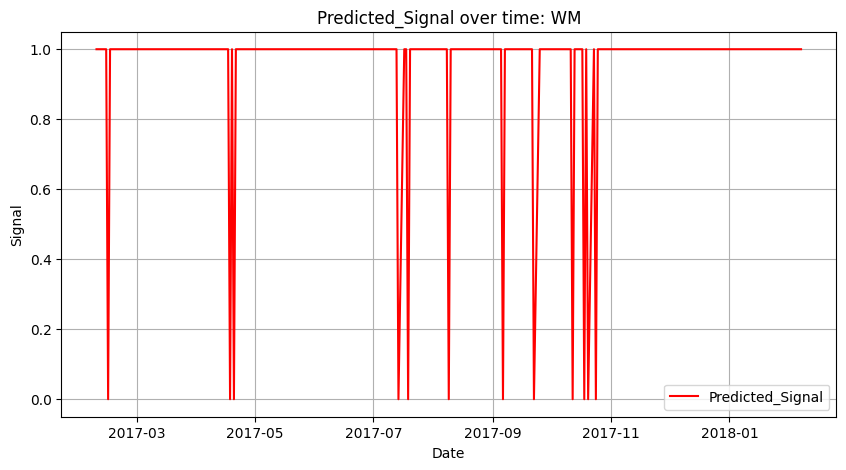

Modeling  ITW
            Open-Close  High-Low
date                            
2013-02-08       -0.82    0.9400
2013-02-11       -0.10    0.4500
2013-02-12       -0.15    0.4600
2013-02-13       -0.34    0.6460
2013-02-14       -0.15    0.4699
...                ...       ...
2018-02-01       -0.48    2.9199
2018-02-02        1.53    3.4000
2018-02-05        8.41   10.8700
2018-02-06       -5.93    8.7390
2018-02-07        0.21    4.5300

[1259 rows x 2 columns]
Test accuracy: 0.5833333333333334
Train accuracy: 0.551142005958292
              open    high     low   close   volume Ticks  Open-Close  \
date                                                                    
2017-02-08  126.92  127.39  126.52  127.12   759251   ITW       -0.20   
2017-02-09  127.30  128.26  127.15  127.26  1164117   ITW        0.04   
2017-02-10  127.64  128.10  127.18  128.00   725736   ITW       -0.36   
2017-02-13  128.34  129.64  128.34  129.37   897696   ITW       -1.03   
2017-02-14  129.30  129.71

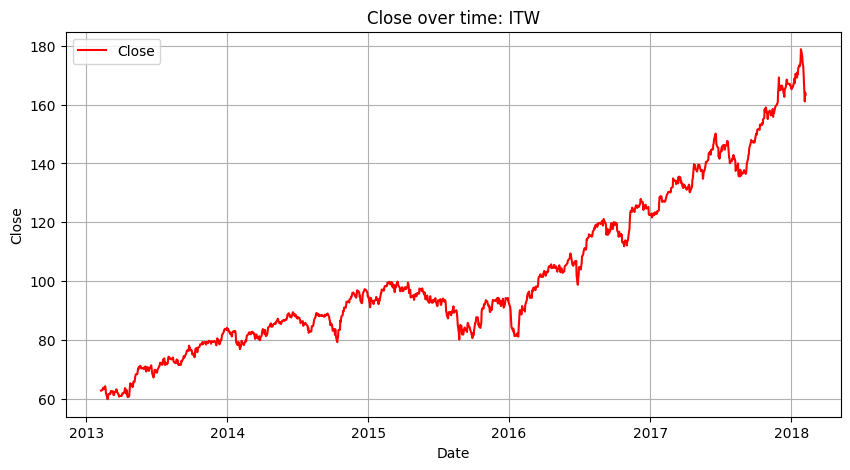

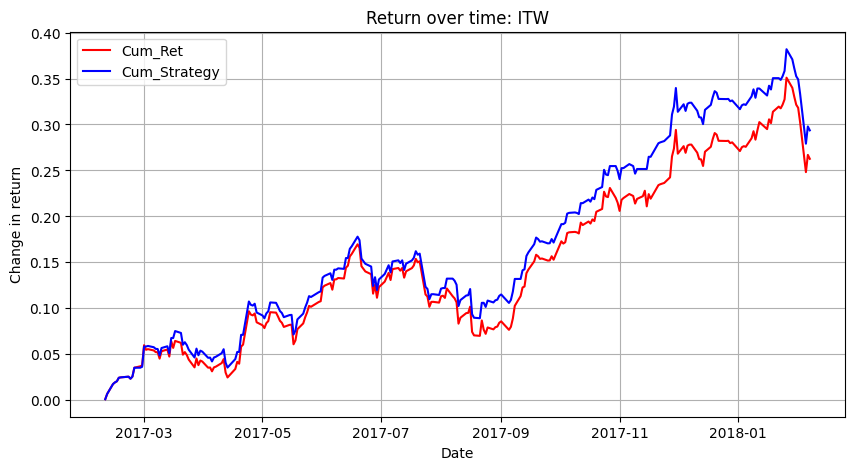

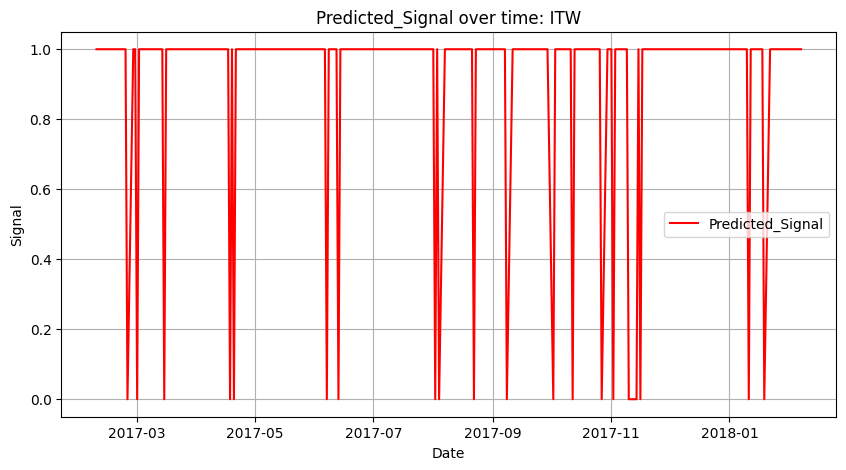

In [9]:
###############
# Section three
###############

# Try this by looping through multiple stock symbols

# Either pick a few stocks to try
tick_names = ['AMZN', 'AAPL', 'MSFT', 'WMT', 'V', 'MA', 'COST', 'PEP', 'CAT', 'WM', 'ITW']

# OR do it for all stocks
#tick_names = unique_values

# Train a model for each stock
for name in tick_names:
    print("Modeling ", name)
    stock = df.loc[df['Ticks'] == name]
    stock.index = pd.to_datetime(stock['date']) 

    stock = stock.drop(['date'], axis='columns') 
    stock['Open-Close'] = stock['open'] - stock['close']
    stock['High-Low'] = stock['high'] - stock['low']
      
    # Store all predictor variables in a variable X 
    X = stock[['Open-Close', 'High-Low']] 

    X_cleaned = X[~np.isnan(X).any(axis=1)]
    print(X)
    y = np.where(stock['close'].shift(-1) > stock['close'], 1, 0) 
    split_percentage = 0.8
    split = int(split_percentage*len(stock)) 
      
    # Train data set 
    X_train = X[:split] 
    y_train = y[:split] 
      
    # Test data set 
    X_test = X[split:] 
    y_test = y[split:]

    svm = SVC()
    cls = svm.fit(X_train, y_train)
    
    y_pred = cls.predict(X_test)
    y_pred_train = cls.predict(X_train)

    accuracy = accuracy_score(y_test, y_pred)
    print("Test accuracy:", accuracy)
    
    accuracy = accuracy_score(y_train, y_pred_train)
    print("Train accuracy:", accuracy)

    # Only show the returns of the test period:

    stock_future = stock[split:]

    stock_future['Predicted_Signal'] = cls.predict(X_test)
    stock_future['Return'] = stock_future['close'].pct_change()
    stock_future['Strategy_Return'] = stock_future.Return * stock_future.Predicted_Signal.shift(1)
    stock_future['Cum_Ret'] = stock_future['Return'].cumsum() 
    stock_future['Cum_Strategy'] = stock_future['Strategy_Return'].cumsum() 

    print(stock_future.head())

    plt.figure(figsize=(10, 5))
    plt.plot(stock['close'],color='red', label="Close") 
    plt.title('Close over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Close')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Cum_Ret'],color='red', label="Cum_Ret") 
    plt.plot(stock_future['Cum_Strategy'],color='blue', label="Cum_Strategy")
    plt.title('Return over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Change in return')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(stock_future['Predicted_Signal'],color='red', label="Predicted_Signal") 
    plt.title('Predicted_Signal over time: ' + name, )
    plt.xlabel('Date')
    plt.ylabel('Signal')
    plt.legend()
    plt.grid(True)
    plt.show()



Fold 1:
Modeling  AMZN
Test accuracy: 0.4880382775119617
Test precision: 0.49444444444444446
Test recall: 0.8476190476190476
Test f1: 0.624561403508772
Train accuracy: 0.5467289719626168


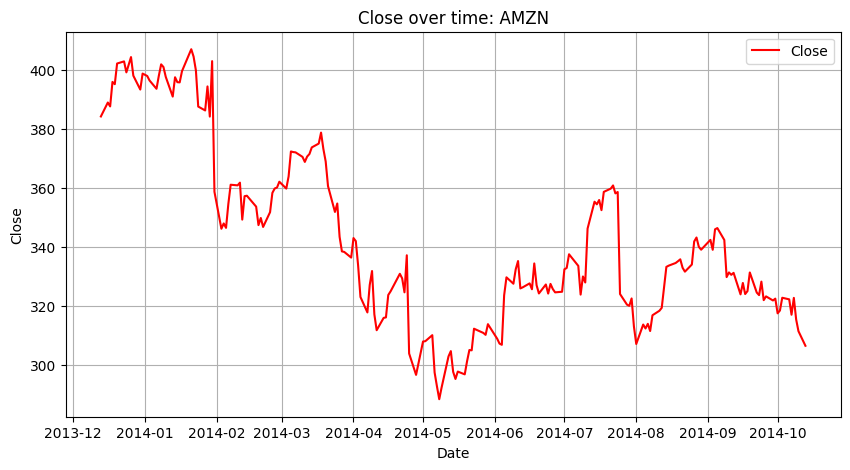

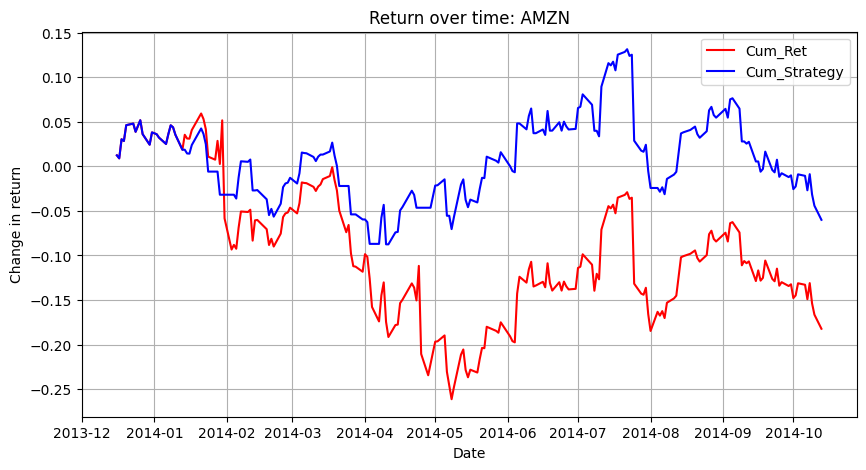

Fold 2:
Modeling  AMZN
Test accuracy: 0.5215311004784688
Test precision: 0.5279503105590062
Test recall: 0.7798165137614679
Test f1: 0.6296296296296297
Train accuracy: 0.5626477541371159


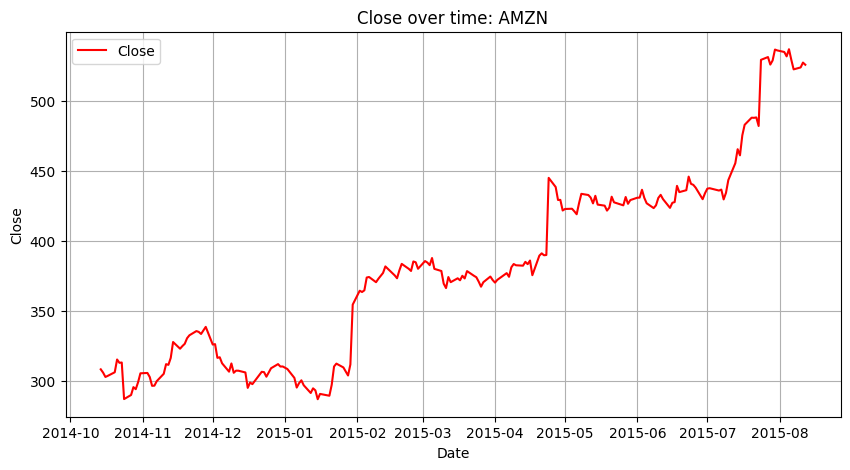

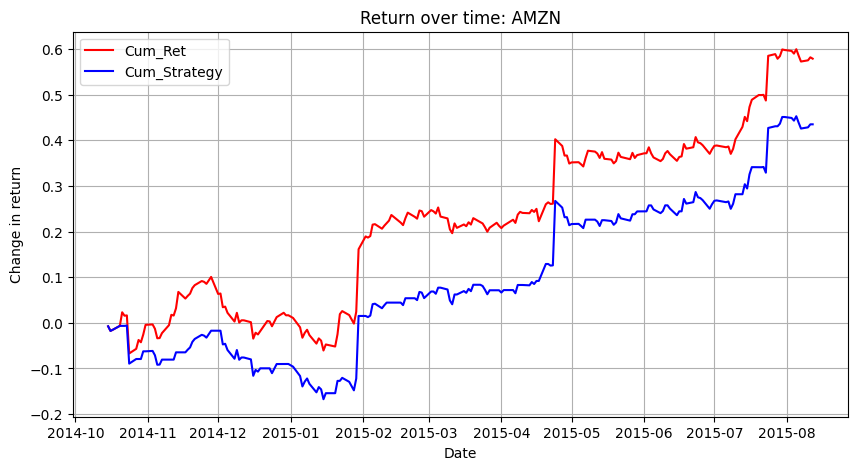

Fold 3:
Modeling  AMZN
Test accuracy: 0.5263157894736842
Test precision: 0.5714285714285714
Test recall: 0.4642857142857143
Test f1: 0.5123152709359606
Train accuracy: 0.5506329113924051


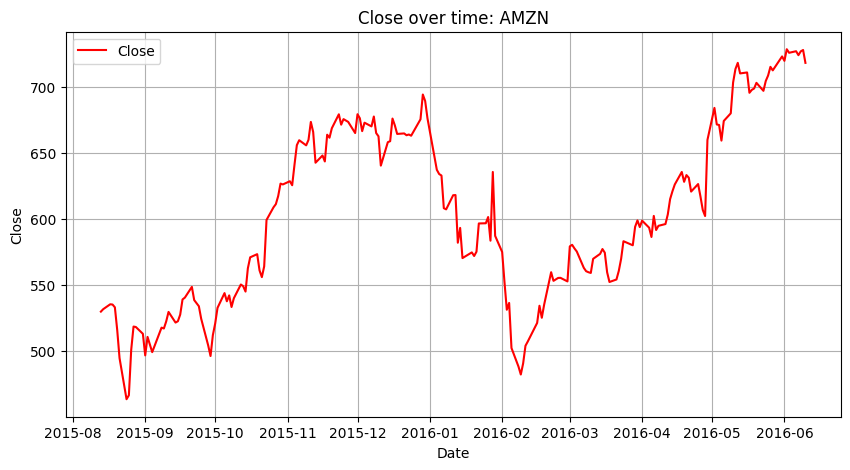

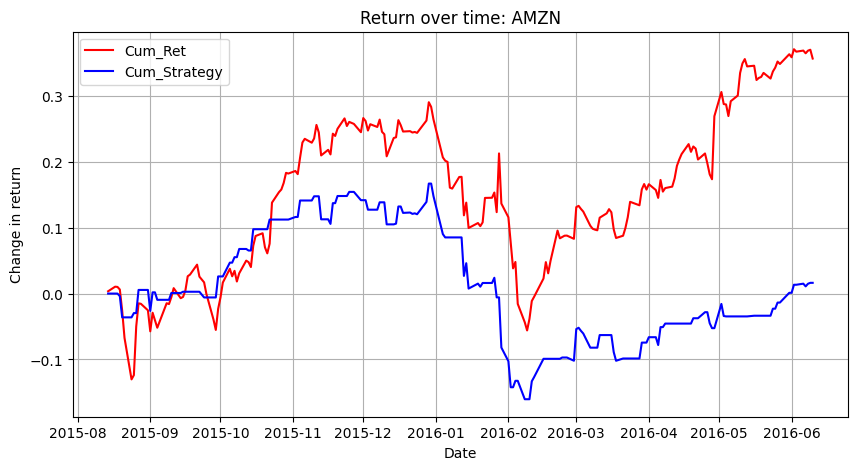

Fold 4:
Modeling  AMZN
Test accuracy: 0.507177033492823
Test precision: 0.5691056910569106
Test recall: 0.5833333333333334
Test f1: 0.5761316872427984
Train accuracy: 0.5505350772889417


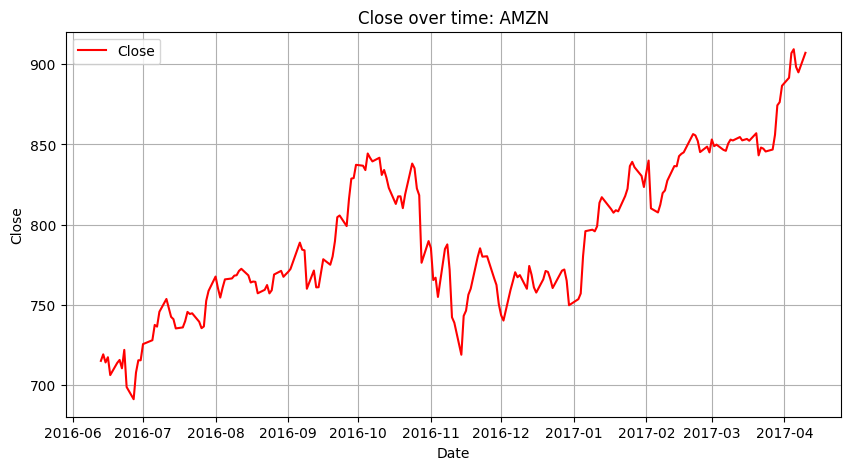

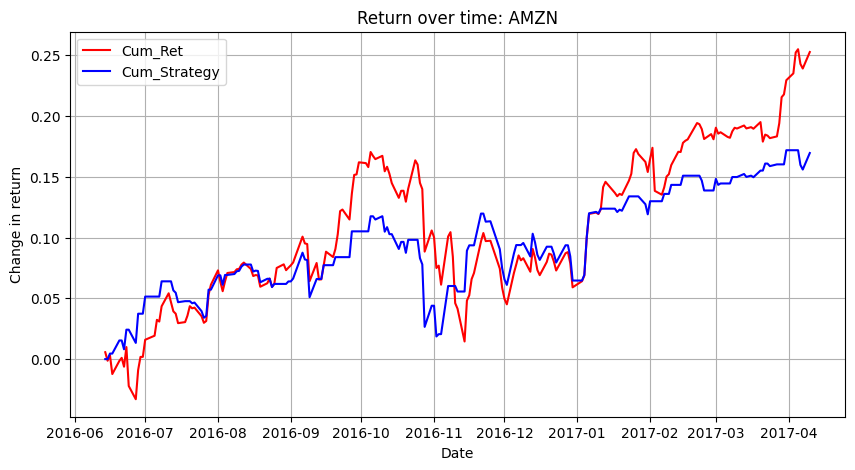

Fold 5:
Modeling  AMZN
Test accuracy: 0.5645933014354066
Test precision: 0.5645933014354066
Test recall: 1.0
Test f1: 0.7217125382262997
Train accuracy: 0.5380952380952381


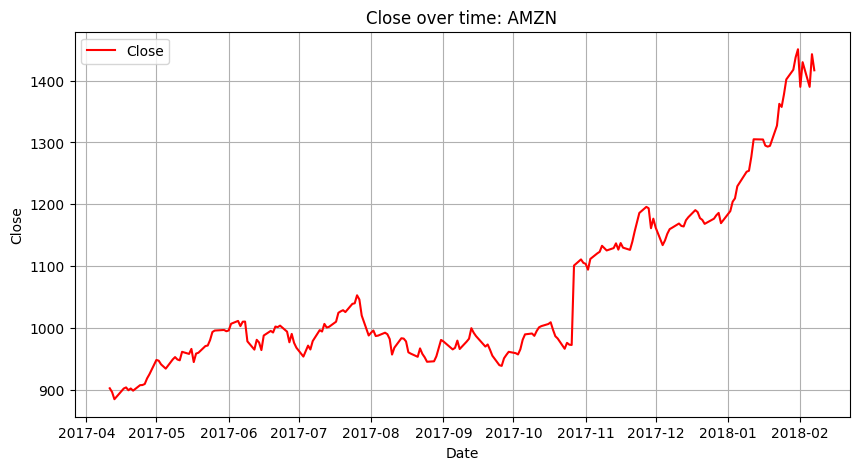

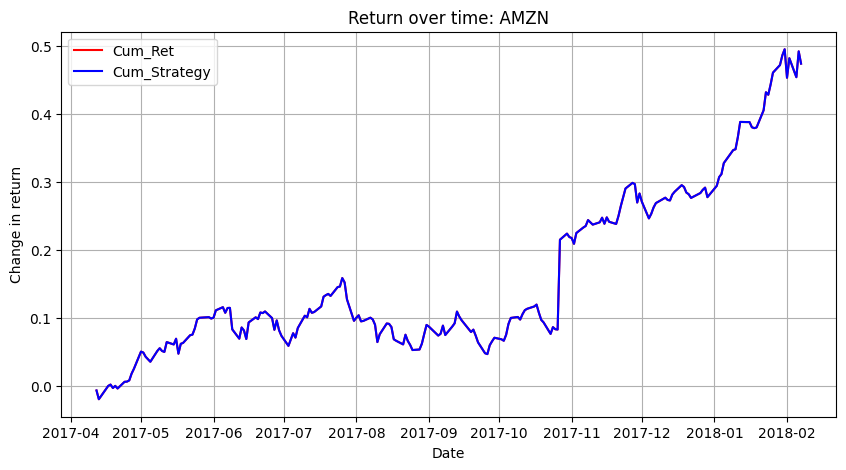

Fold 1:
Modeling  AAPL
Test accuracy: 0.507177033492823
Test precision: 0.5487804878048781
Test recall: 0.40540540540540543
Test f1: 0.46632124352331605
Train accuracy: 0.5747663551401869


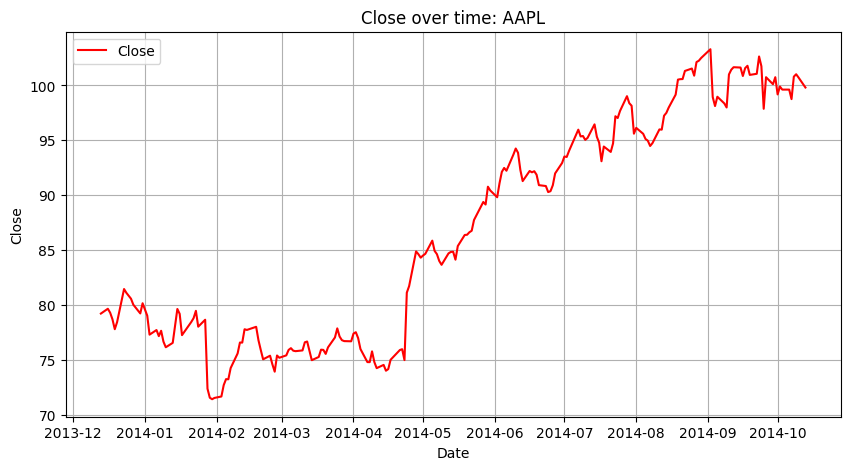

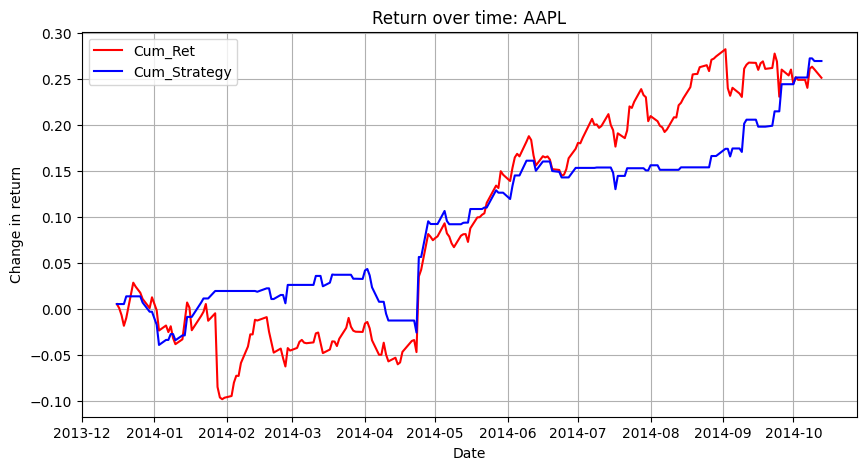

Fold 2:
Modeling  AAPL
Test accuracy: 0.47368421052631576
Test precision: 0.48066298342541436
Test recall: 0.8446601941747572
Test f1: 0.6126760563380281
Train accuracy: 0.5366430260047281


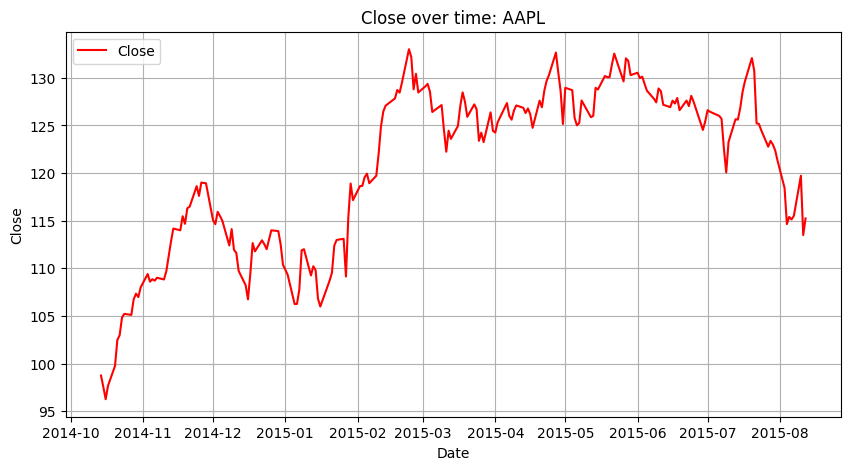

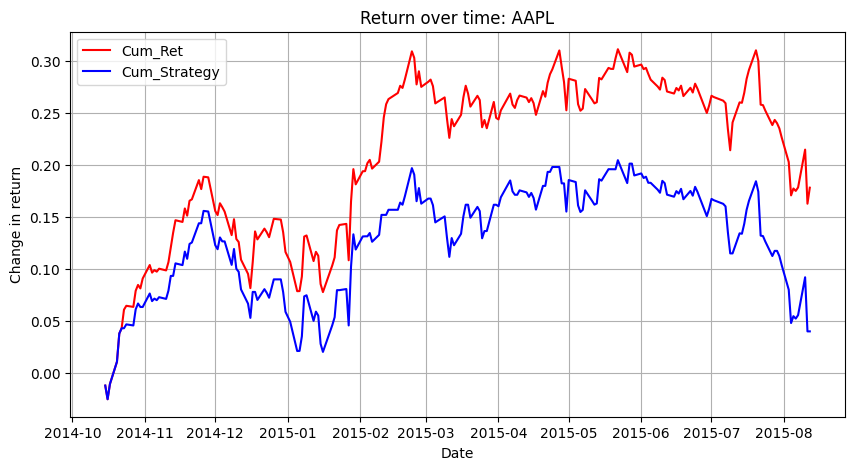

Fold 3:
Modeling  AAPL
Test accuracy: 0.5167464114832536
Test precision: 0.5027932960893855
Test recall: 0.8823529411764706
Test f1: 0.6405693950177936
Train accuracy: 0.5395569620253164


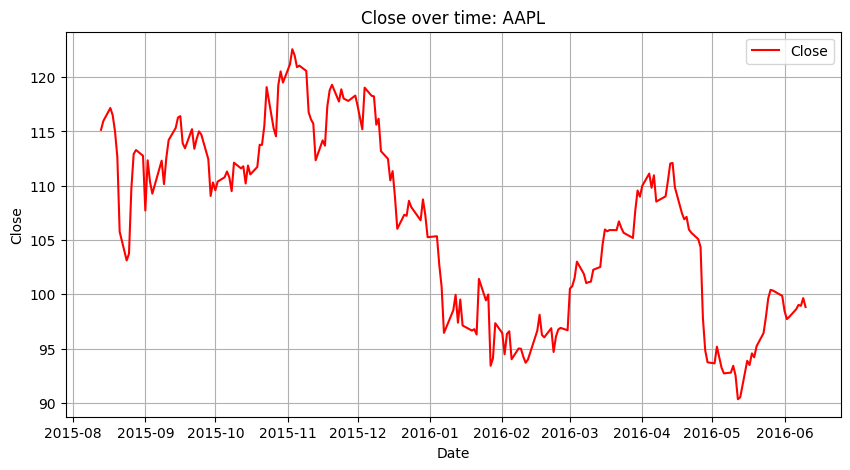

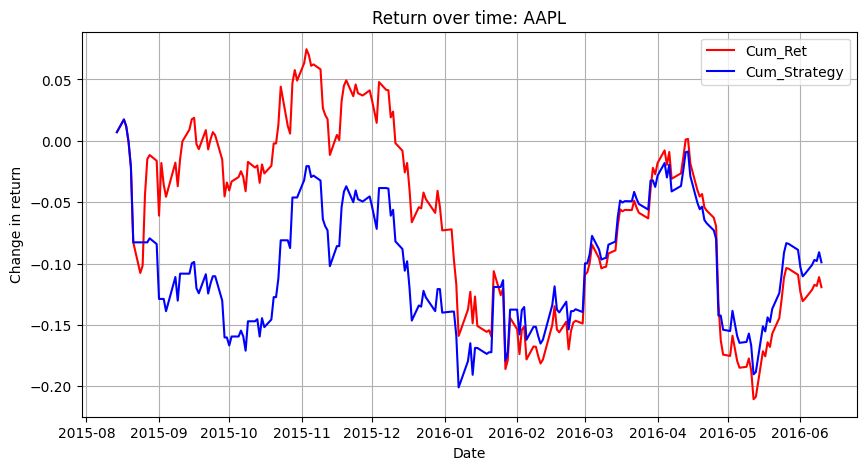

Fold 4:
Modeling  AAPL
Test accuracy: 0.5789473684210527
Test precision: 0.574468085106383
Test recall: 0.9310344827586207
Test f1: 0.7105263157894737
Train accuracy: 0.535077288941736


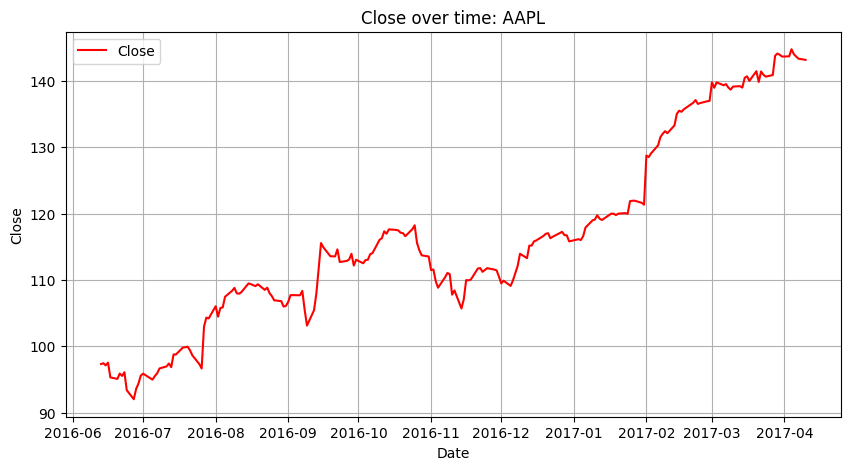

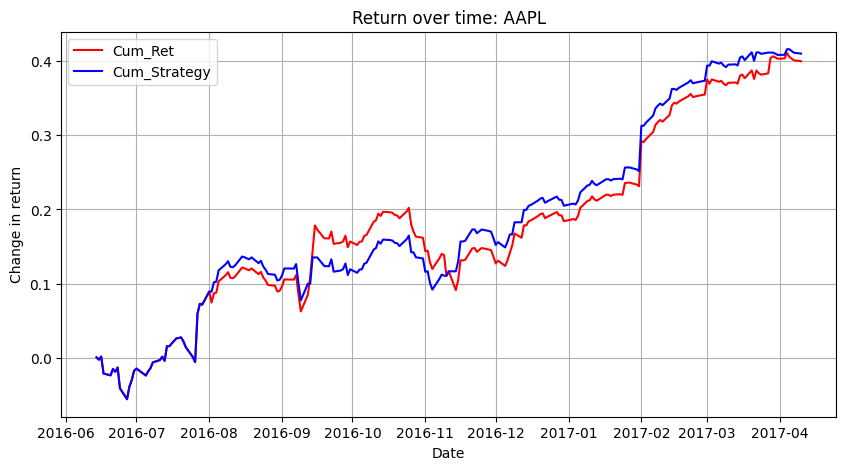

Fold 5:
Modeling  AAPL
Test accuracy: 0.4880382775119617
Test precision: 0.5031847133757962
Test recall: 0.7314814814814815
Test f1: 0.5962264150943396
Train accuracy: 0.539047619047619


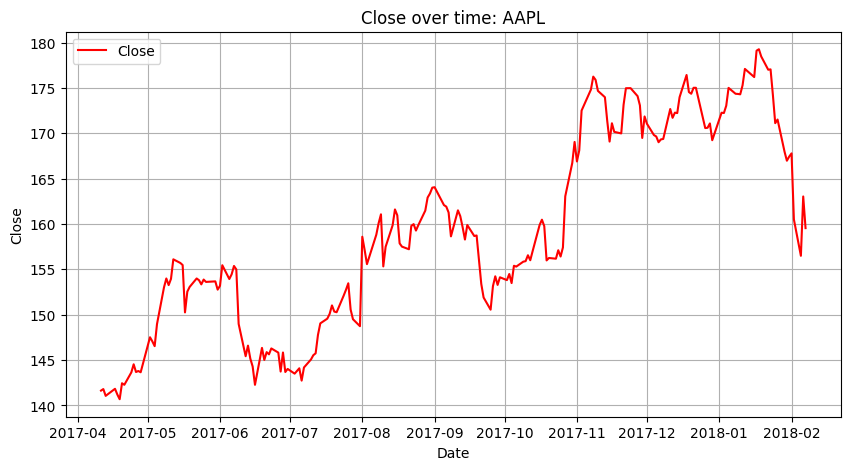

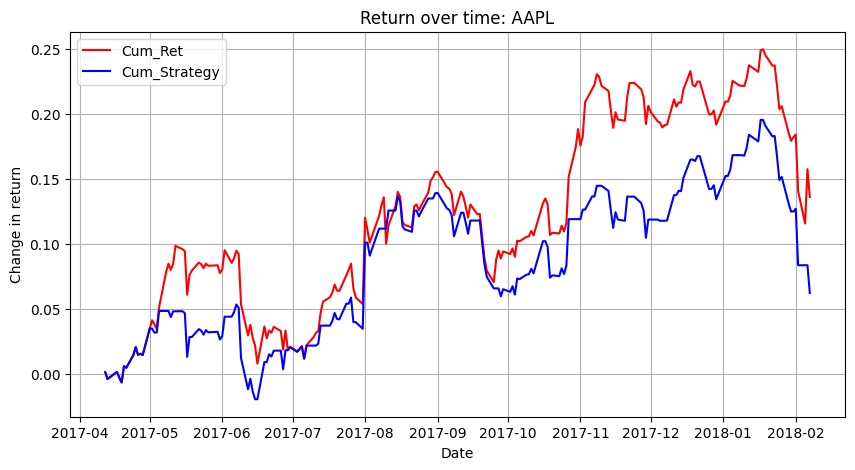

Fold 1:
Modeling  MSFT
Test accuracy: 0.5119617224880383
Test precision: 0.5153374233128835
Test recall: 0.7850467289719626
Test f1: 0.6222222222222222
Train accuracy: 0.5981308411214953


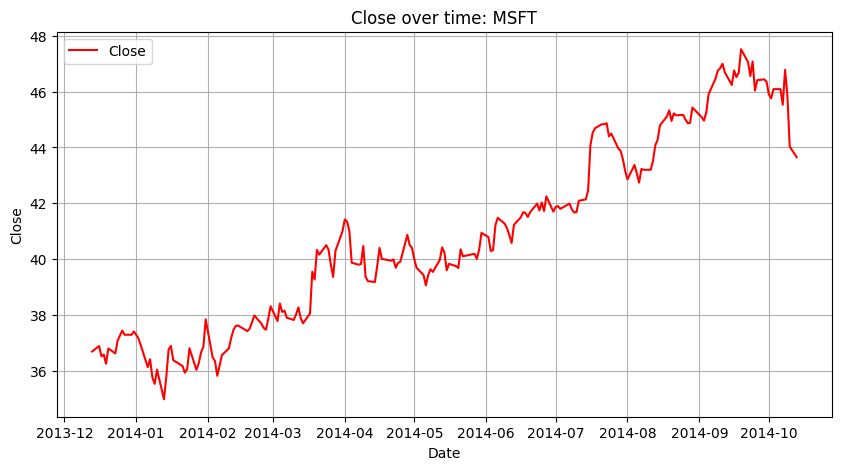

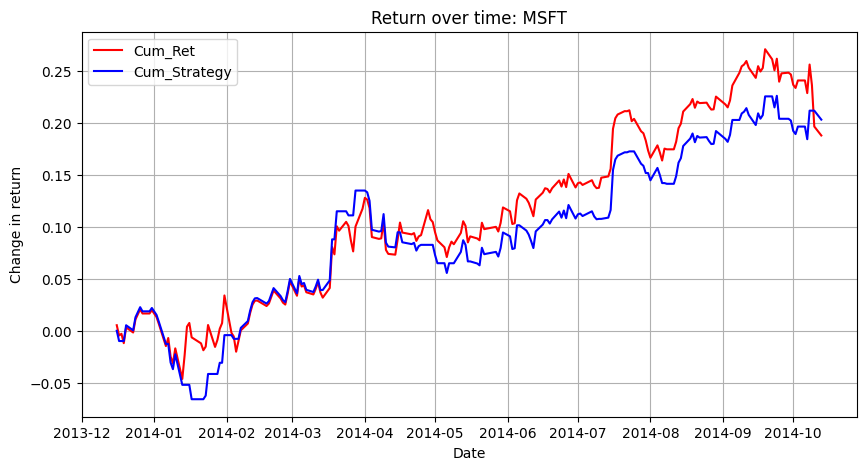

Fold 2:
Modeling  MSFT
Test accuracy: 0.4784688995215311
Test precision: 0.4485294117647059
Test recall: 0.6421052631578947
Test f1: 0.5281385281385281
Train accuracy: 0.5721040189125296


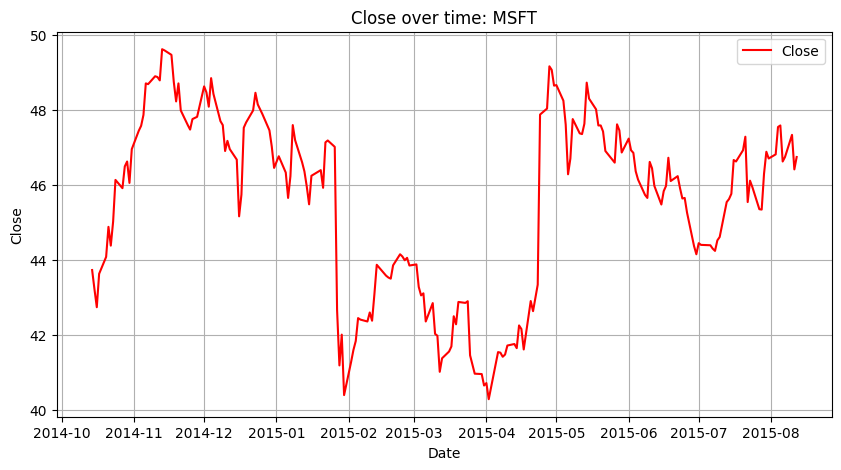

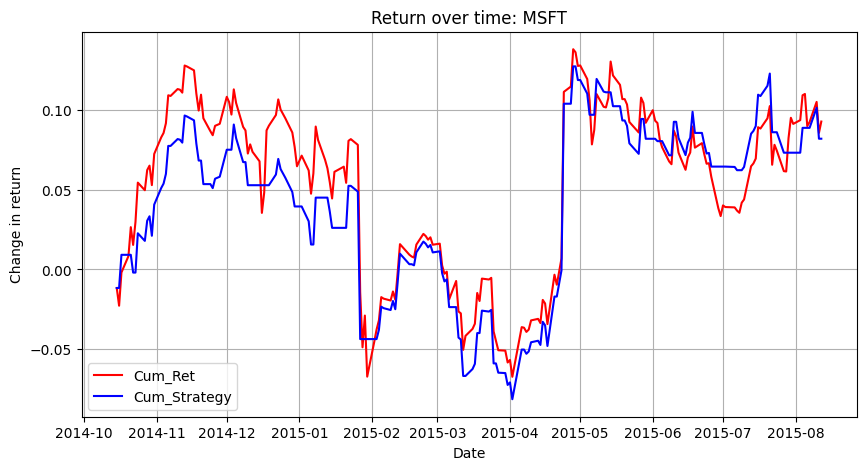

Fold 3:
Modeling  MSFT
Test accuracy: 0.44976076555023925
Test precision: 0.46153846153846156
Test recall: 0.3302752293577982
Test f1: 0.3850267379679144
Train accuracy: 0.5427215189873418


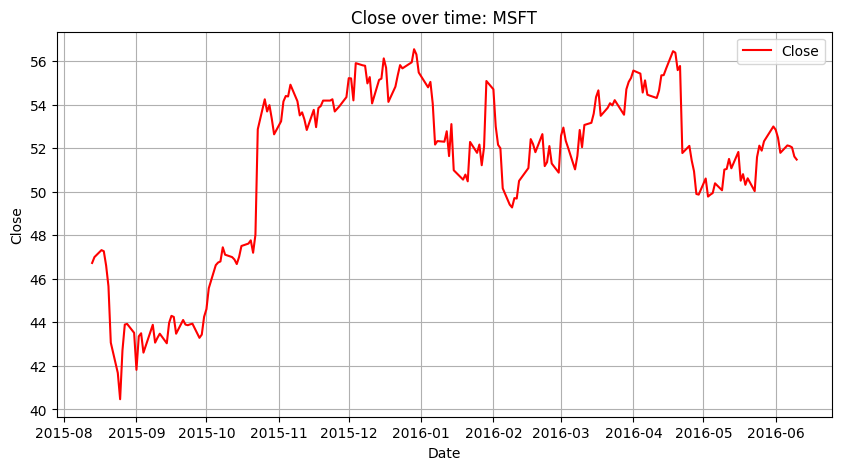

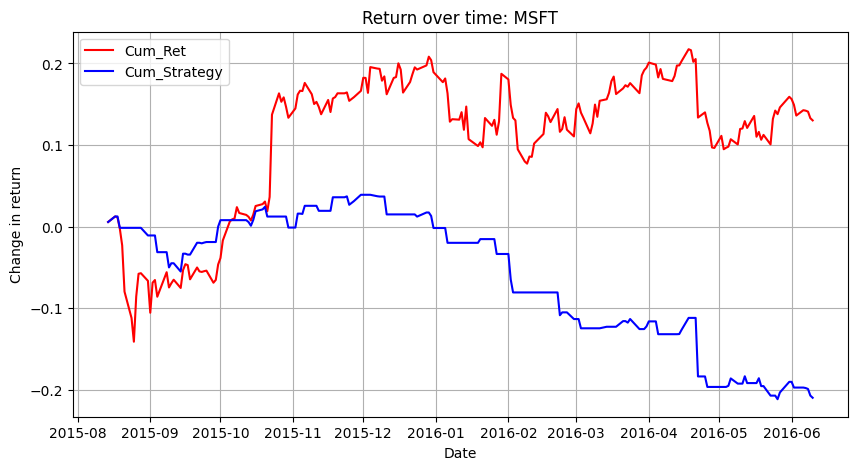

Fold 4:
Modeling  MSFT
Test accuracy: 0.5502392344497608
Test precision: 0.5472972972972973
Test recall: 0.75
Test f1: 0.6328125
Train accuracy: 0.5576694411414982


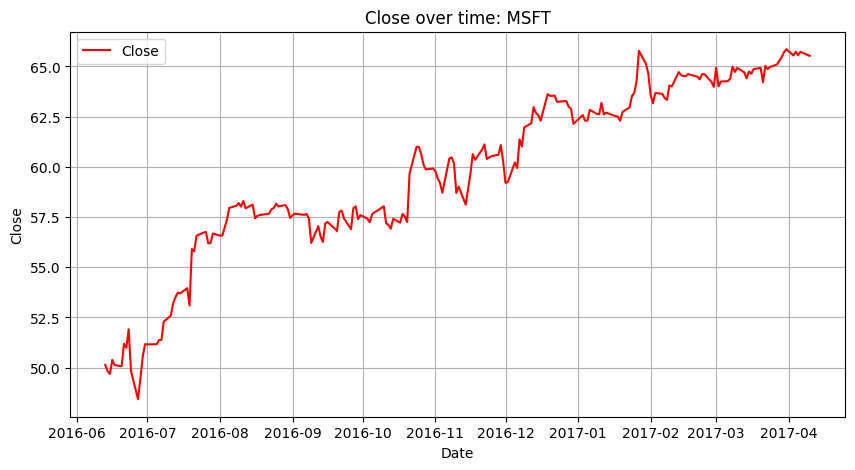

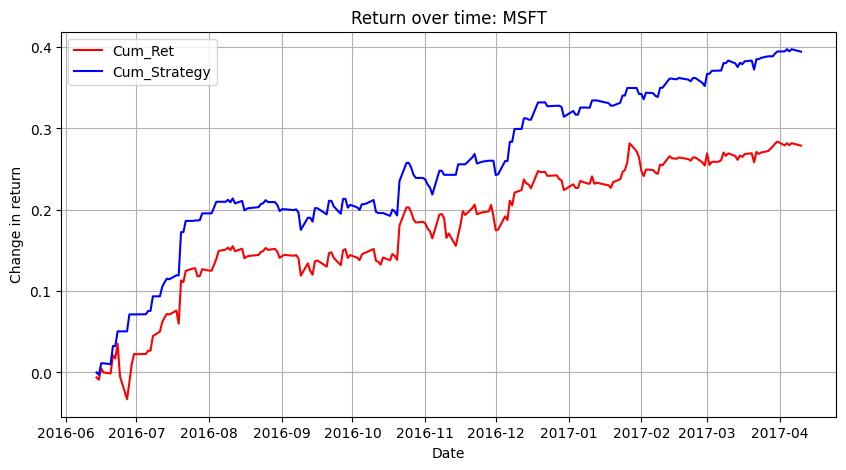

Fold 5:
Modeling  MSFT
Test accuracy: 0.5550239234449761
Test precision: 0.5923076923076923
Test recall: 0.6581196581196581
Test f1: 0.6234817813765182
Train accuracy: 0.5419047619047619


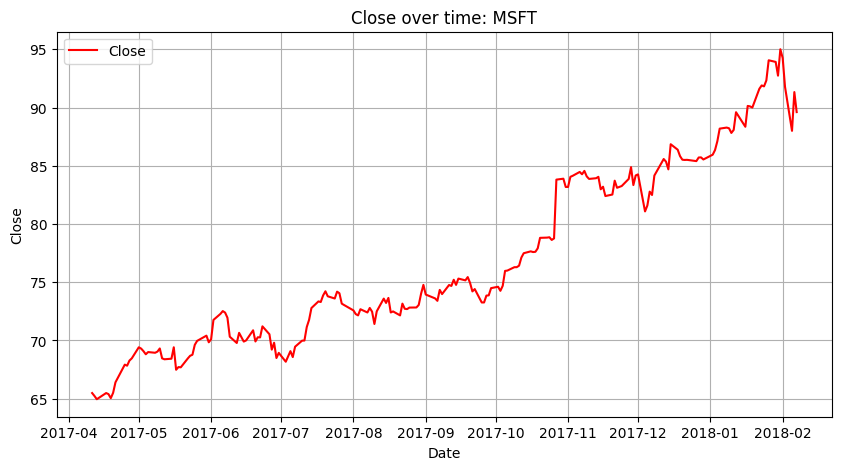

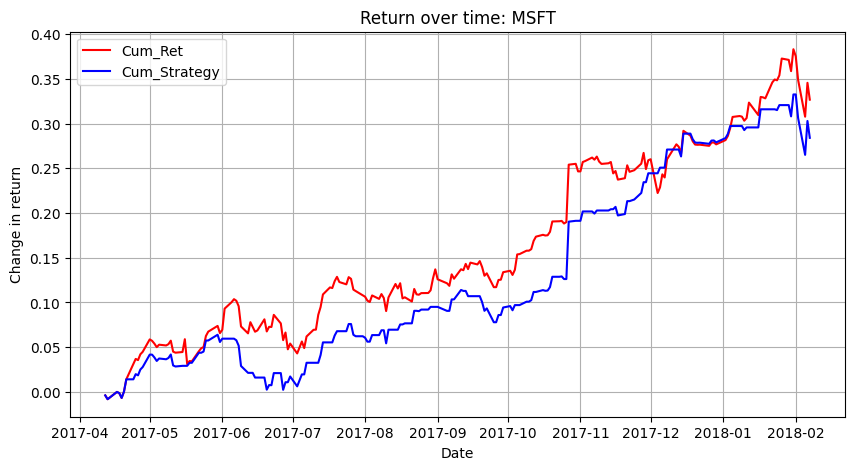

Fold 1:
Modeling  WMT
Test accuracy: 0.4688995215311005
Test precision: 0.4619883040935672
Test recall: 0.8061224489795918
Test f1: 0.587360594795539
Train accuracy: 0.5233644859813084


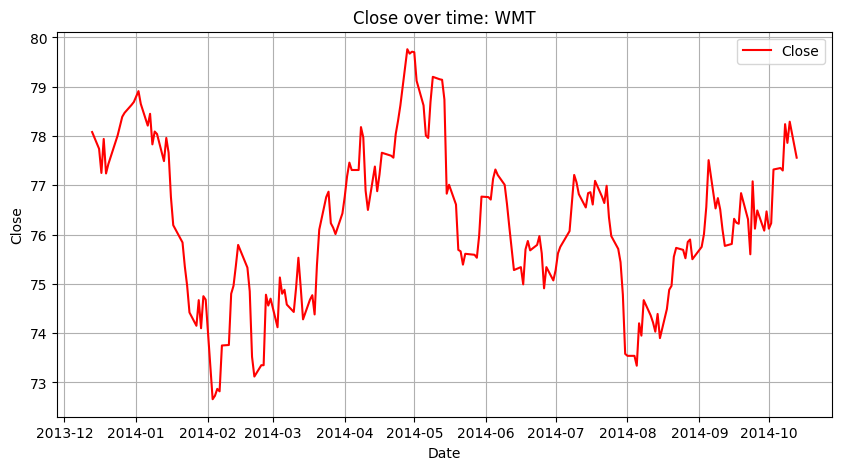

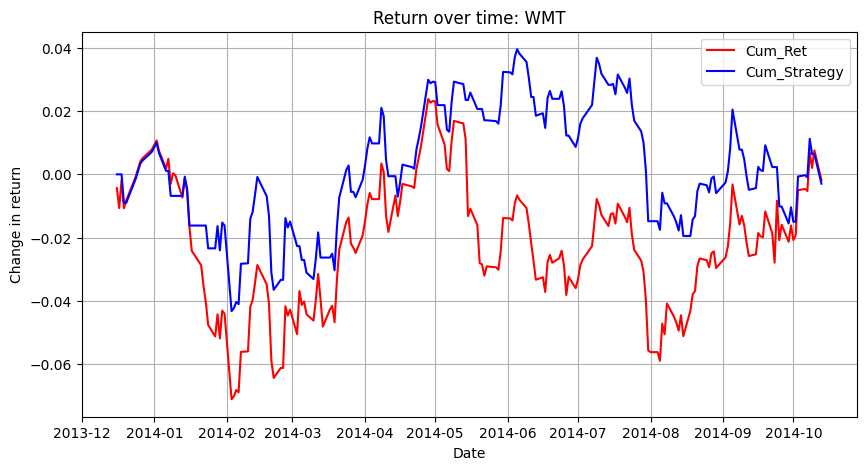

Fold 2:
Modeling  WMT
Test accuracy: 0.4880382775119617
Test precision: 0.5087719298245614
Test recall: 0.26851851851851855
Test f1: 0.3515151515151515
Train accuracy: 0.541371158392435


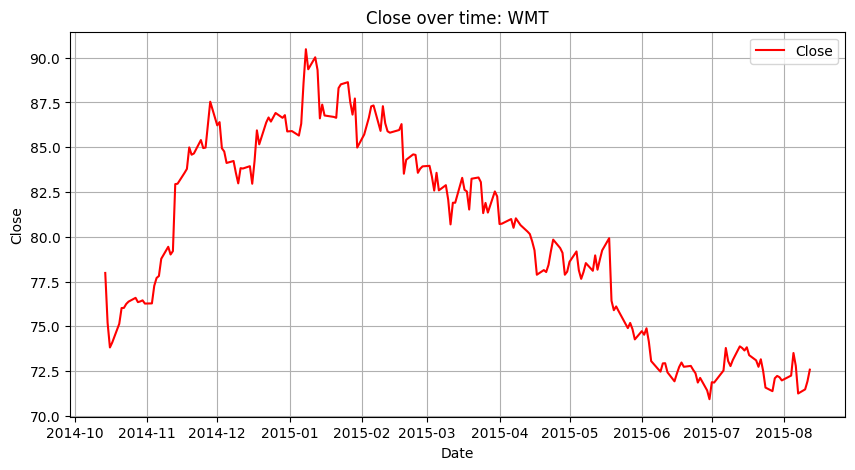

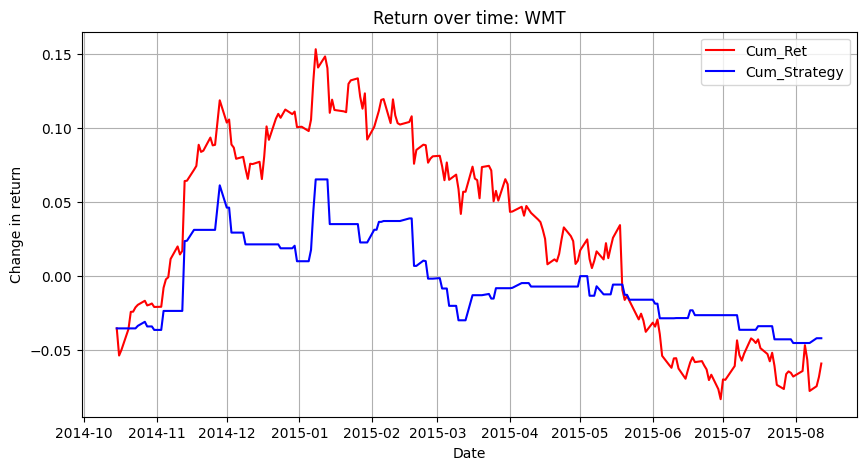

Fold 3:
Modeling  WMT
Test accuracy: 0.5358851674641149
Test precision: 0.5540540540540541
Test recall: 0.3904761904761905
Test f1: 0.4581005586592179
Train accuracy: 0.5348101265822784


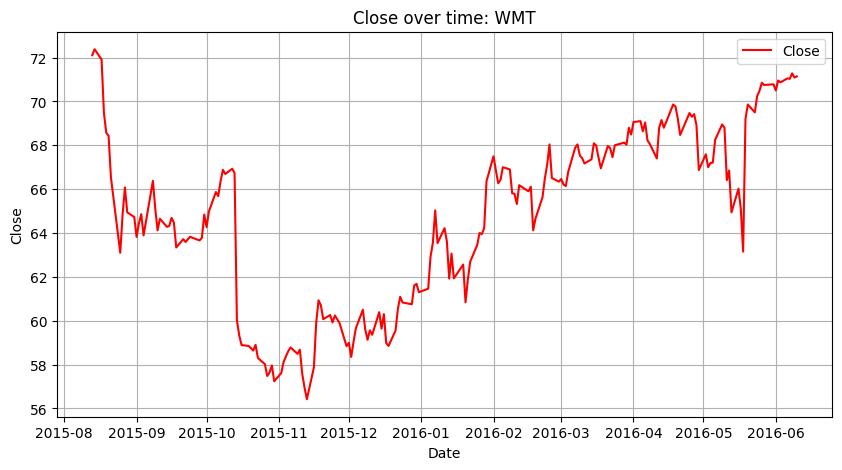

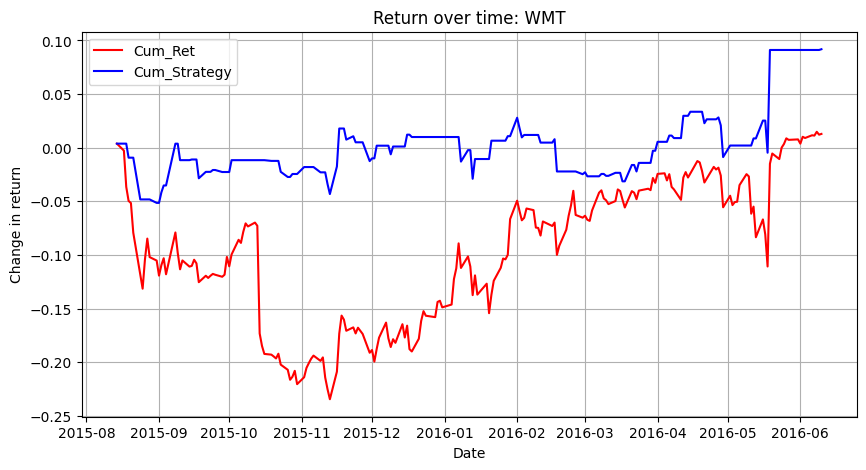

Fold 4:
Modeling  WMT
Test accuracy: 0.5502392344497608
Test precision: 0.5822784810126582
Test recall: 0.42990654205607476
Test f1: 0.4946236559139785
Train accuracy: 0.5422116527942925


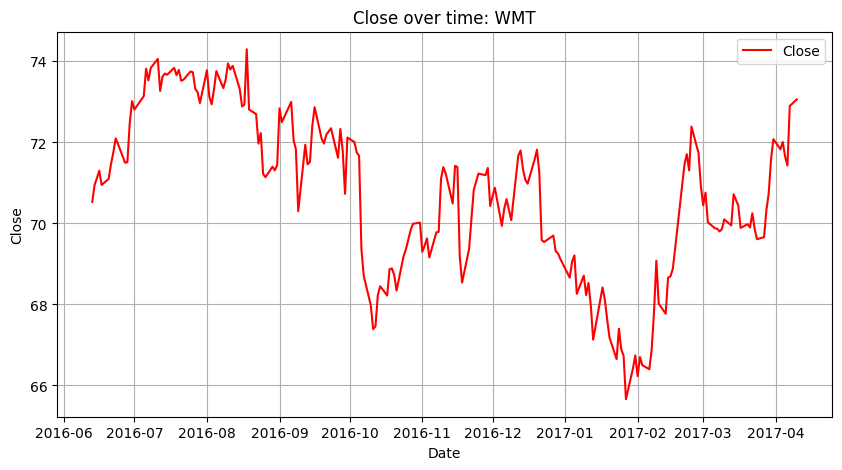

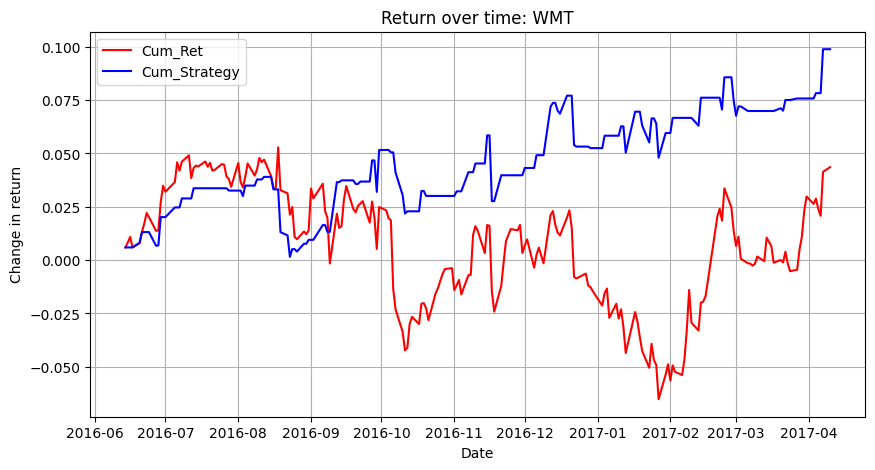

Fold 5:
Modeling  WMT
Test accuracy: 0.5311004784688995
Test precision: 0.6056338028169014
Test recall: 0.671875
Test f1: 0.6370370370370371
Train accuracy: 0.540952380952381


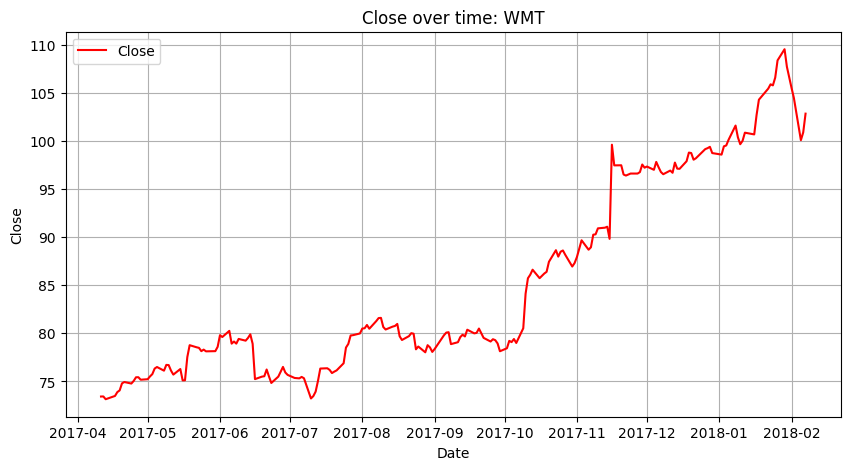

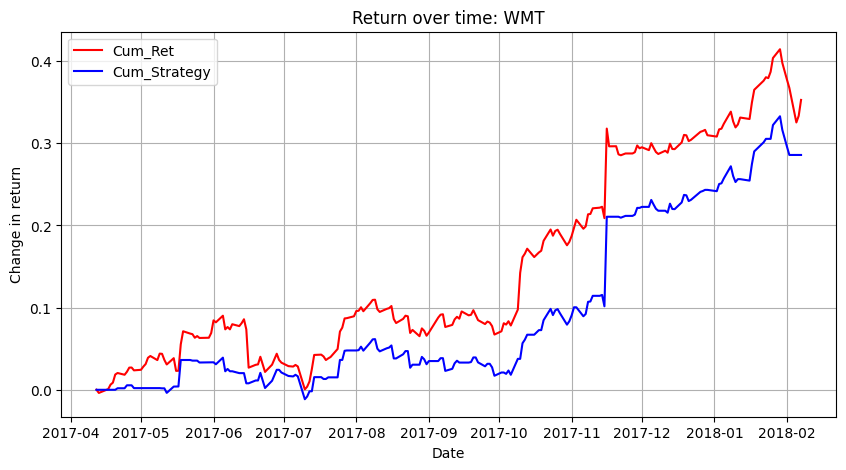

Fold 1:
Modeling  V
Test accuracy: 0.5167464114832536
Test precision: 0.5167464114832536
Test recall: 1.0
Test f1: 0.6813880126182965
Train accuracy: 0.5373831775700935


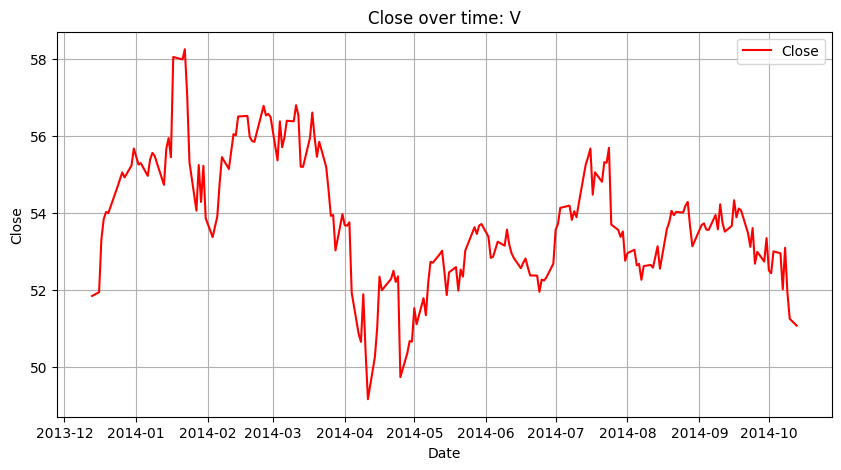

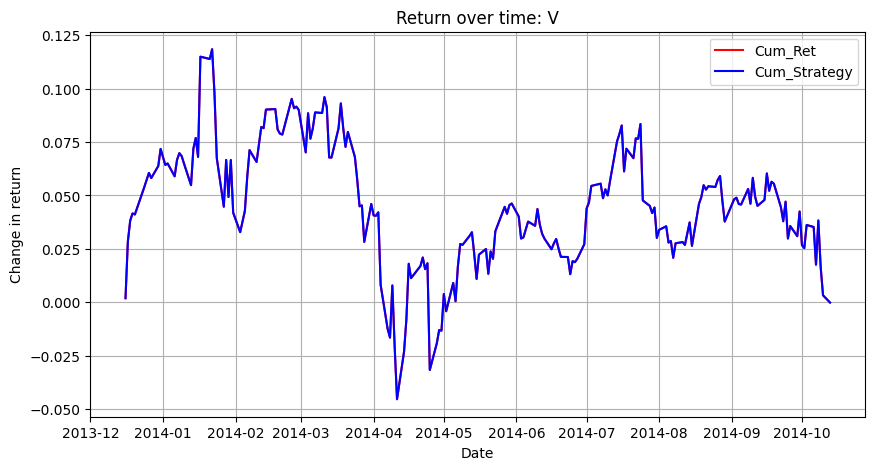

Fold 2:
Modeling  V
Test accuracy: 0.5215311004784688
Test precision: 0.5202312138728323
Test recall: 0.8411214953271028
Test f1: 0.6428571428571429
Train accuracy: 0.5862884160756501


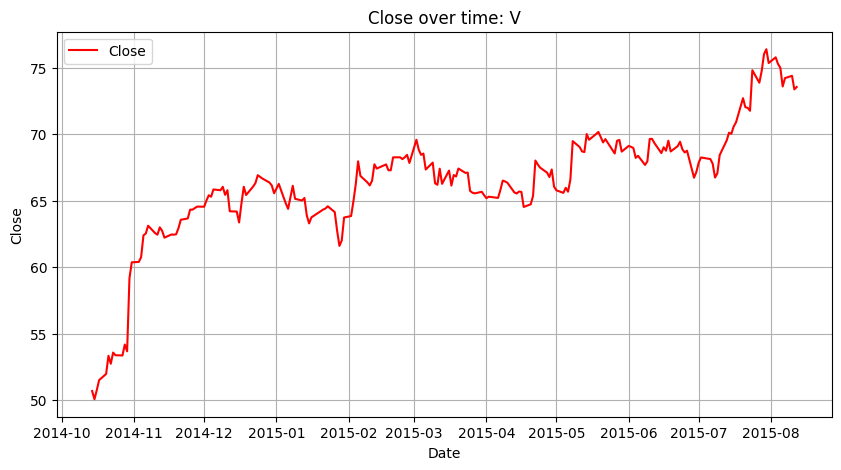

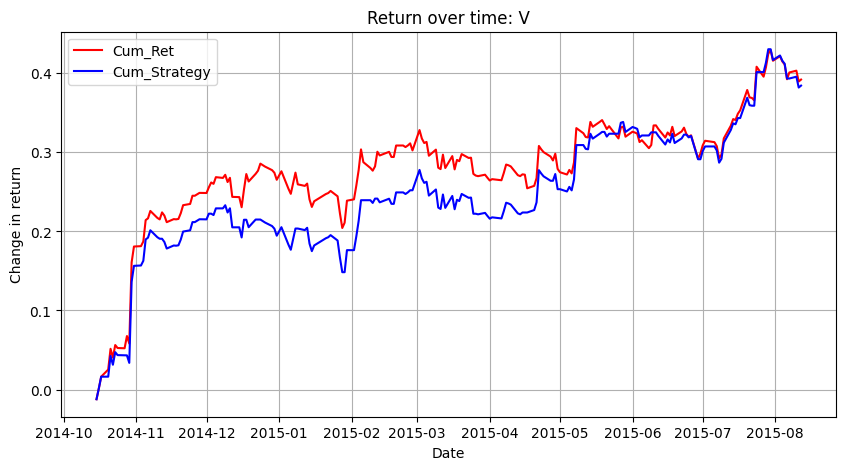

Fold 3:
Modeling  V
Test accuracy: 0.47368421052631576
Test precision: 0.48717948717948717
Test recall: 0.5327102803738317
Test f1: 0.5089285714285714
Train accuracy: 0.5632911392405063


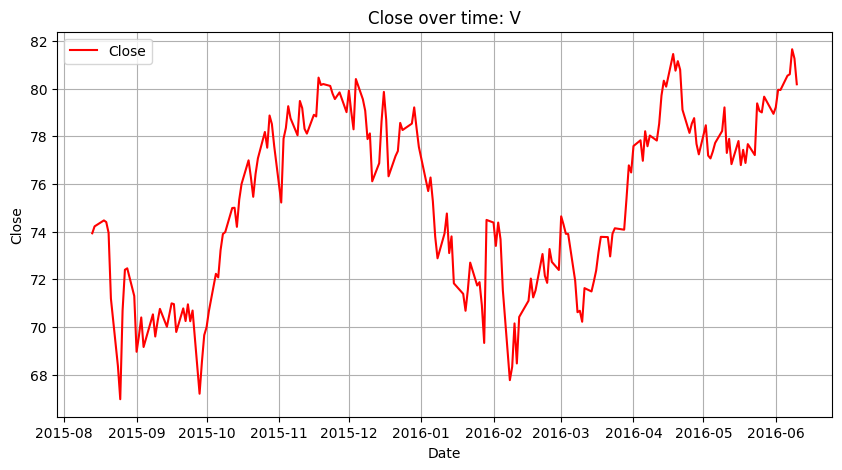

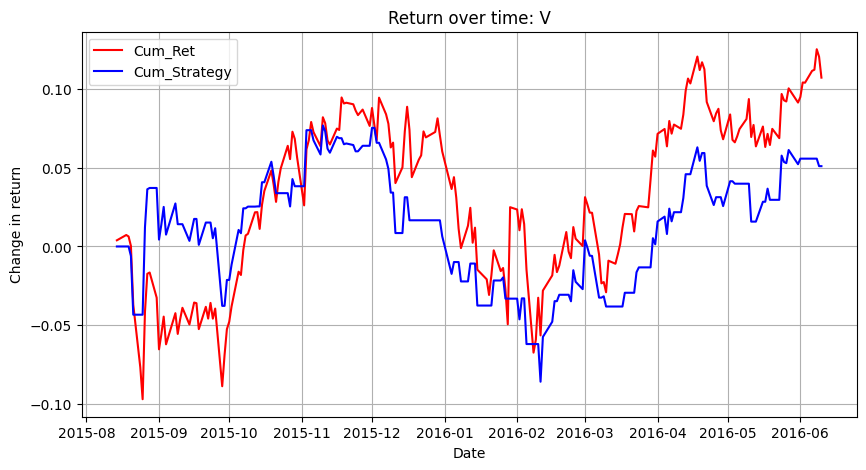

Fold 4:
Modeling  V
Test accuracy: 0.583732057416268
Test precision: 0.6545454545454545
Test recall: 0.5950413223140496
Test f1: 0.6233766233766234
Train accuracy: 0.5648038049940547


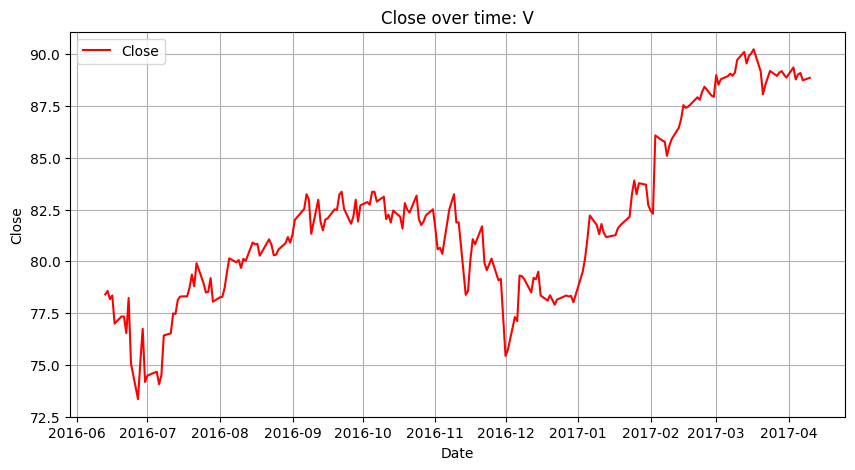

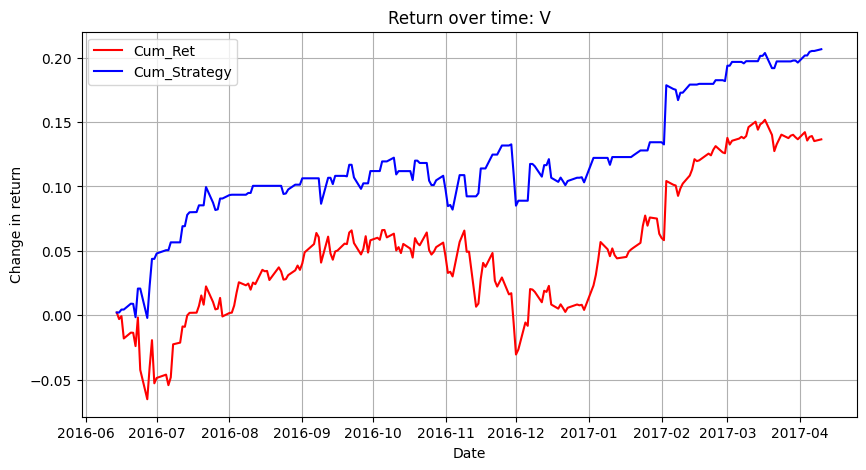

Fold 5:
Modeling  V
Test accuracy: 0.6076555023923444
Test precision: 0.6257668711656442
Test recall: 0.8292682926829268
Test f1: 0.7132867132867133
Train accuracy: 0.5523809523809524


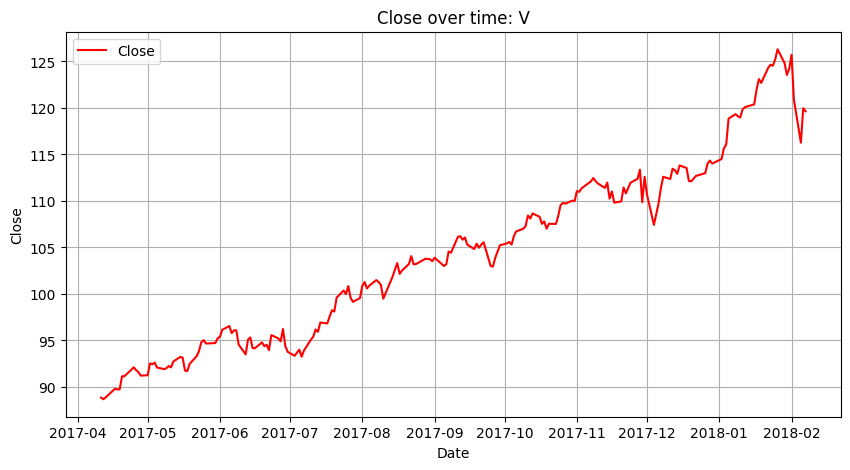

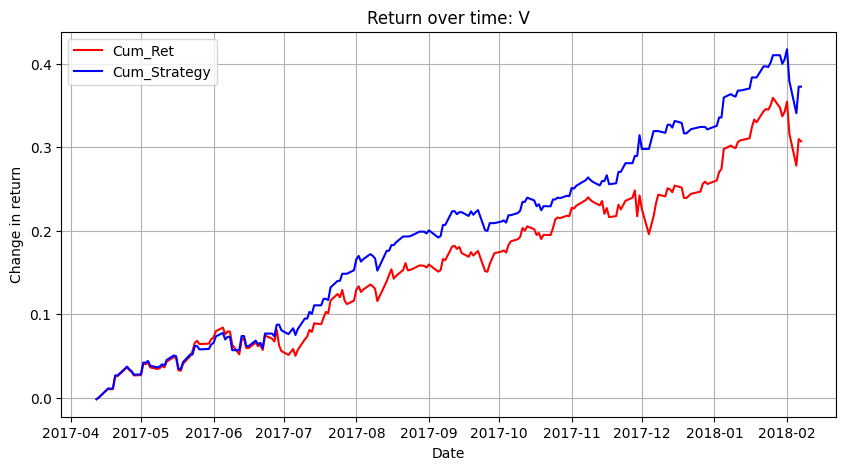

Fold 1:
Modeling  MA
Test accuracy: 0.5023923444976076
Test precision: 0.4973821989528796
Test recall: 0.9223300970873787
Test f1: 0.6462585034013606
Train accuracy: 0.5794392523364486


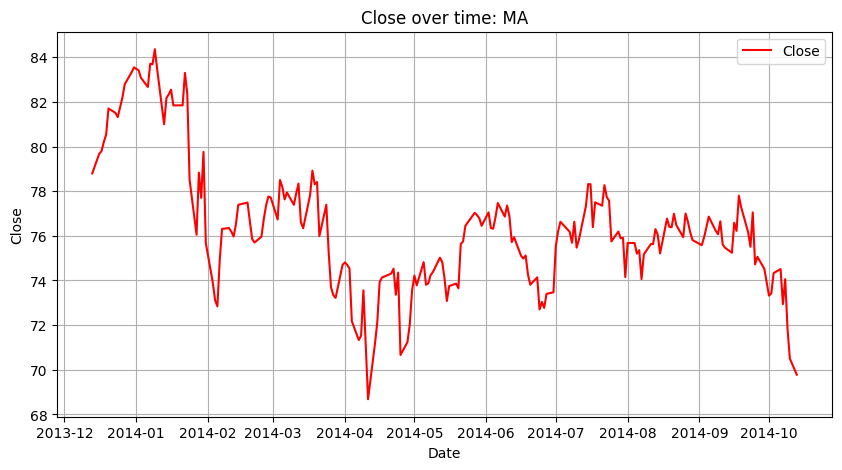

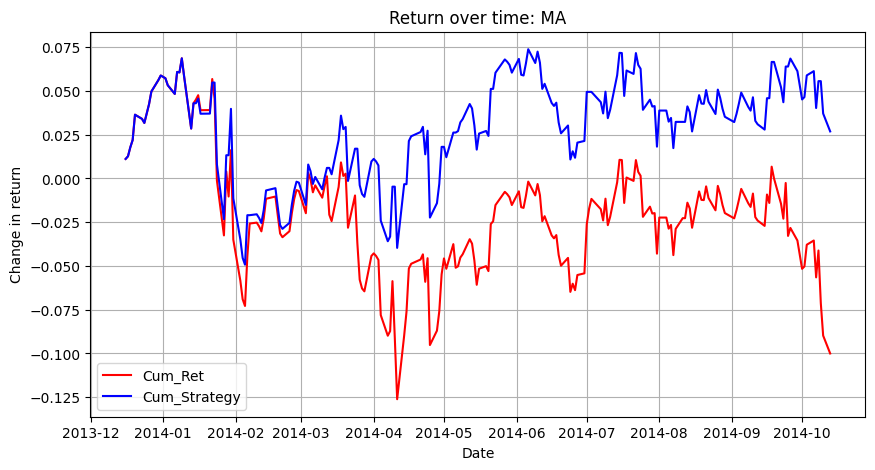

Fold 2:
Modeling  MA
Test accuracy: 0.5550239234449761
Test precision: 0.5647668393782384
Test recall: 0.923728813559322
Test f1: 0.7009646302250804
Train accuracy: 0.5531914893617021


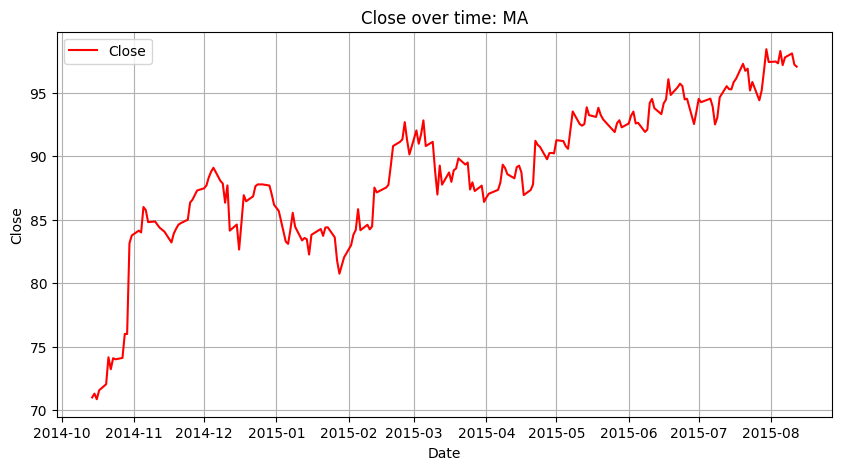

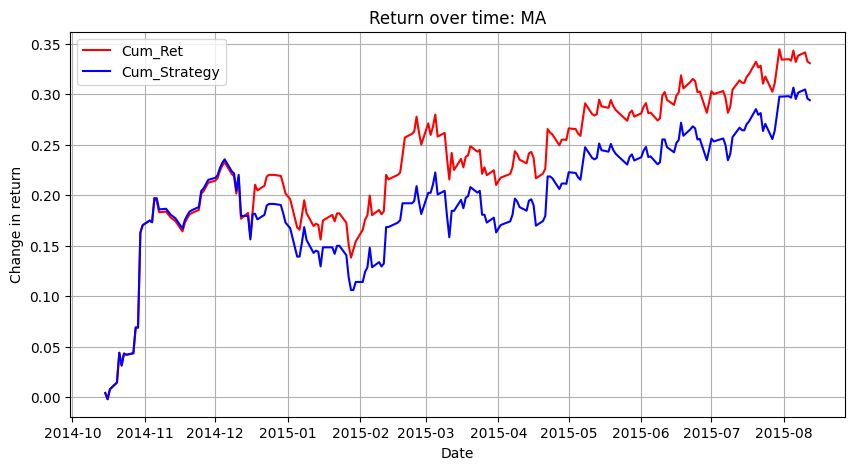

Fold 3:
Modeling  MA
Test accuracy: 0.5215311004784688
Test precision: 0.5198019801980198
Test recall: 0.9722222222222222
Test f1: 0.6774193548387096
Train accuracy: 0.5537974683544303


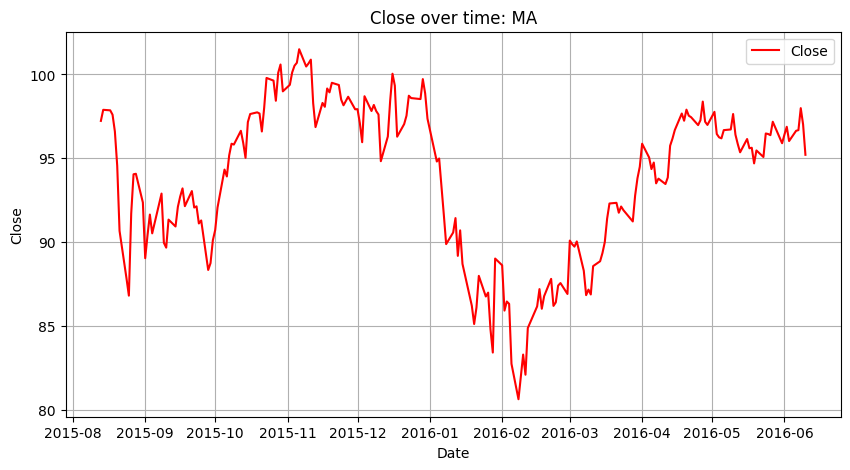

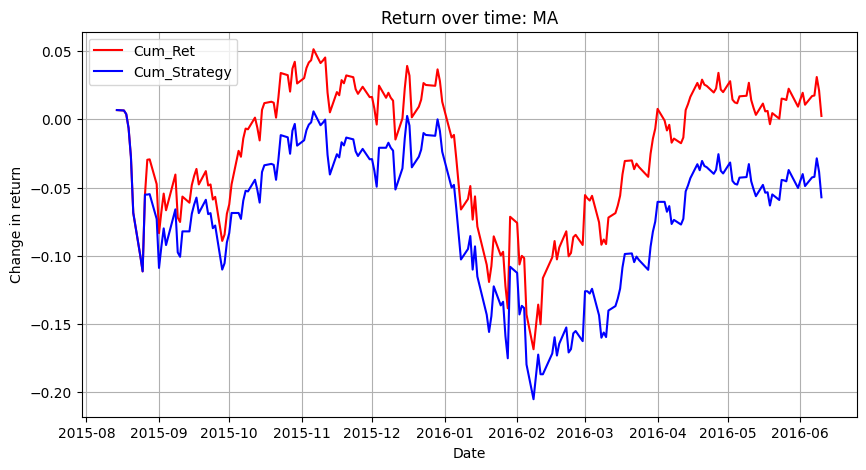

Fold 4:
Modeling  MA
Test accuracy: 0.5789473684210527
Test precision: 0.5756097560975609
Test recall: 0.9915966386554622
Test f1: 0.7283950617283951
Train accuracy: 0.5517241379310345


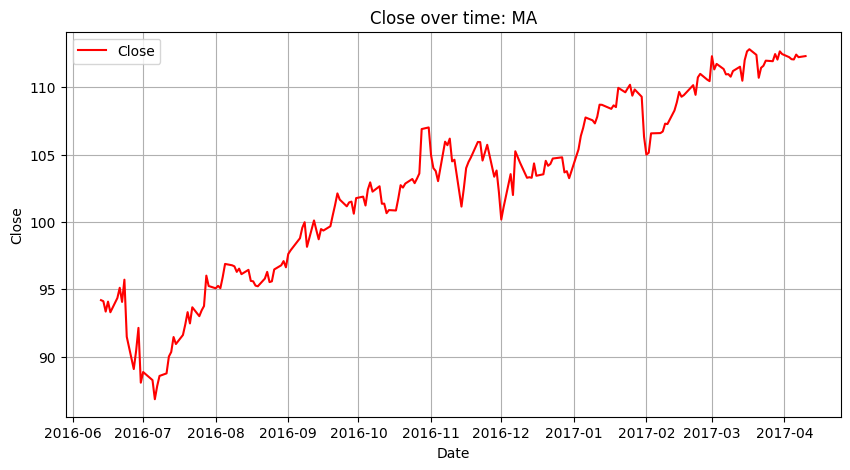

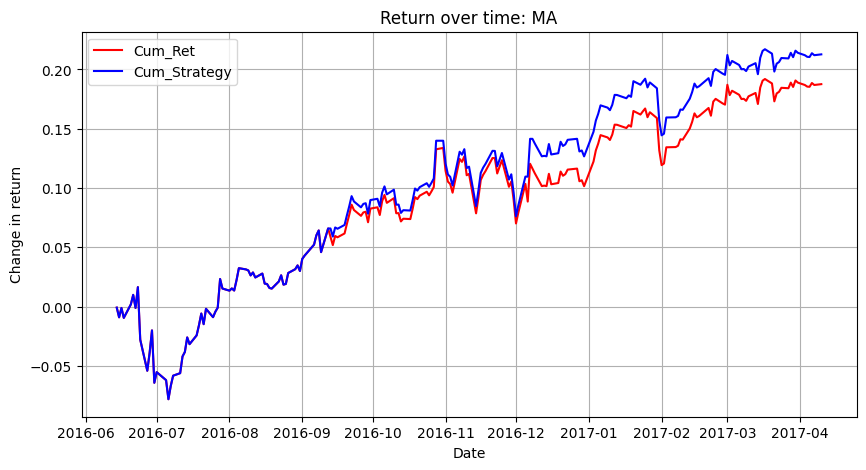

Fold 5:
Modeling  MA
Test accuracy: 0.5980861244019139
Test precision: 0.6102564102564103
Test recall: 0.937007874015748
Test f1: 0.7391304347826086
Train accuracy: 0.5580952380952381


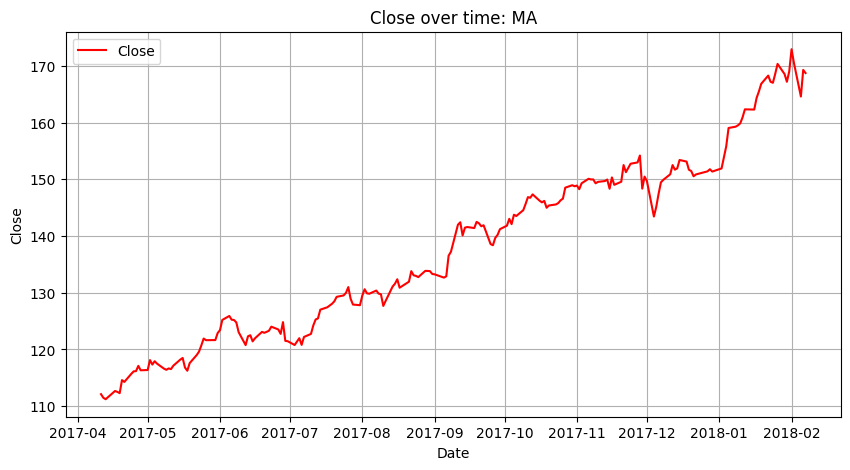

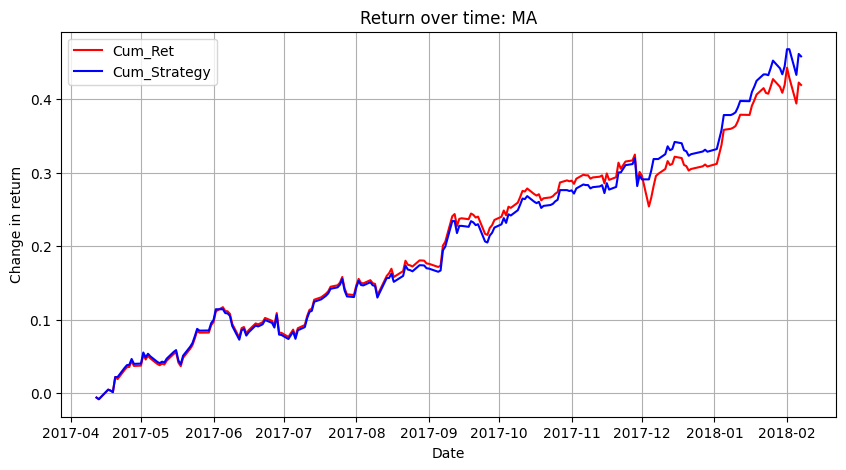

Fold 1:
Modeling  COST
Test accuracy: 0.4880382775119617
Test precision: 0.49029126213592233
Test recall: 0.9805825242718447
Test f1: 0.6537216828478964
Train accuracy: 0.5373831775700935


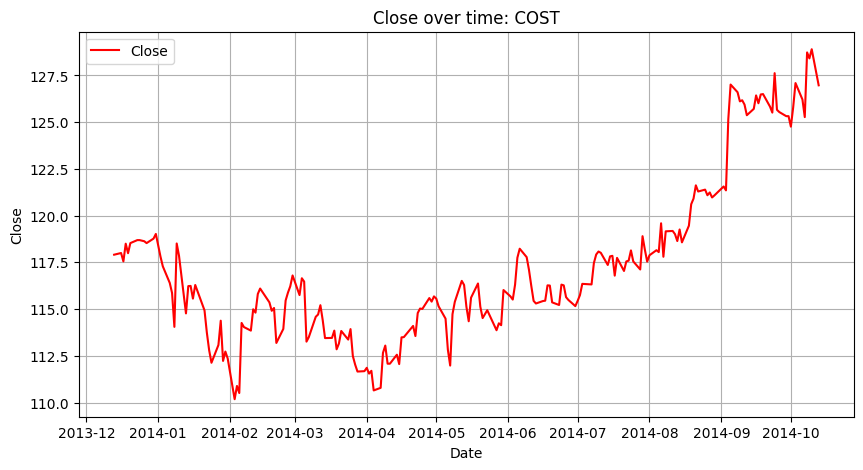

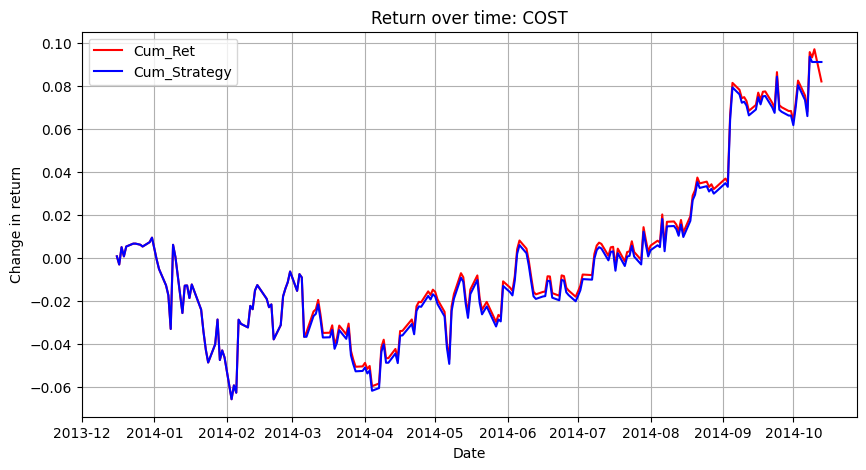

Fold 2:
Modeling  COST
Test accuracy: 0.5119617224880383
Test precision: 0.49710982658959535
Test recall: 0.8514851485148515
Test f1: 0.6277372262773723
Train accuracy: 0.5271867612293144


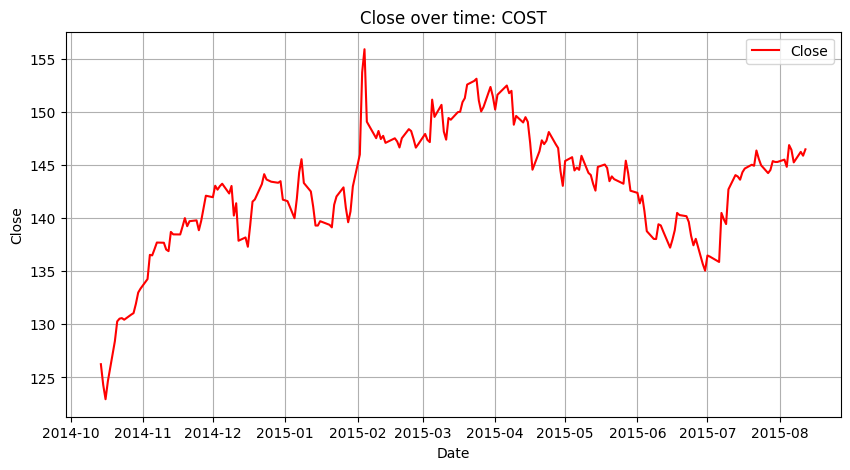

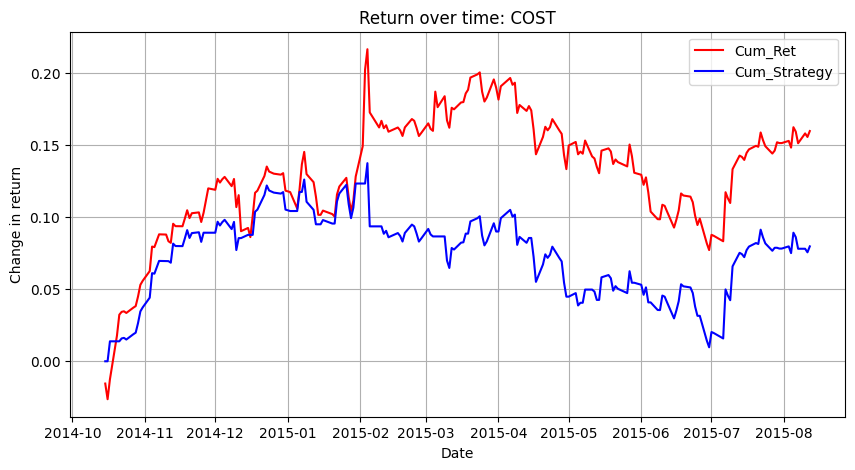

Fold 3:
Modeling  COST
Test accuracy: 0.5167464114832536
Test precision: 0.5802469135802469
Test recall: 0.41228070175438597
Test f1: 0.48205128205128206
Train accuracy: 0.5332278481012658


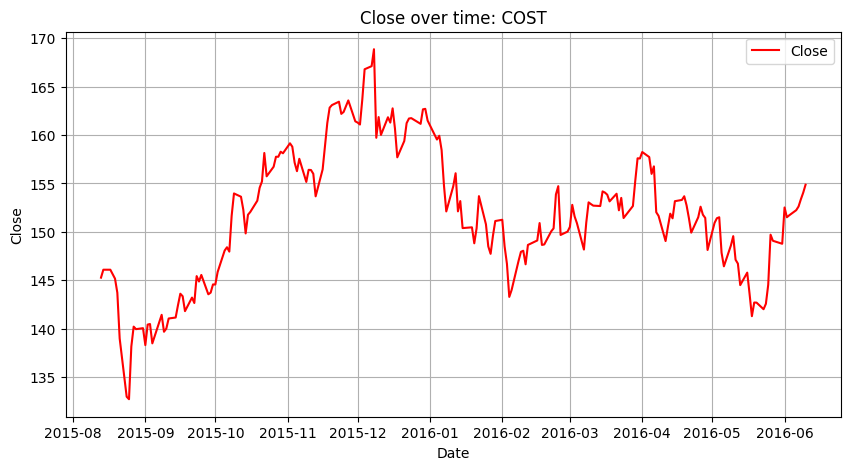

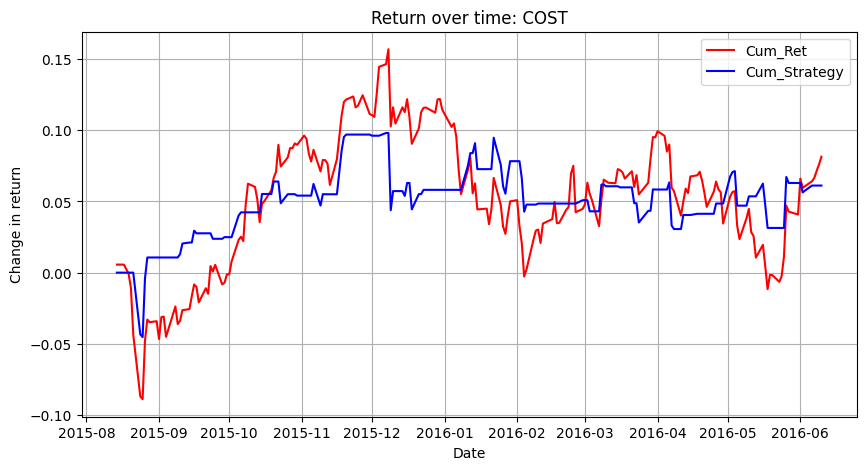

Fold 4:
Modeling  COST
Test accuracy: 0.507177033492823
Test precision: 0.5245901639344263
Test recall: 0.3018867924528302
Test f1: 0.38323353293413176
Train accuracy: 0.535077288941736


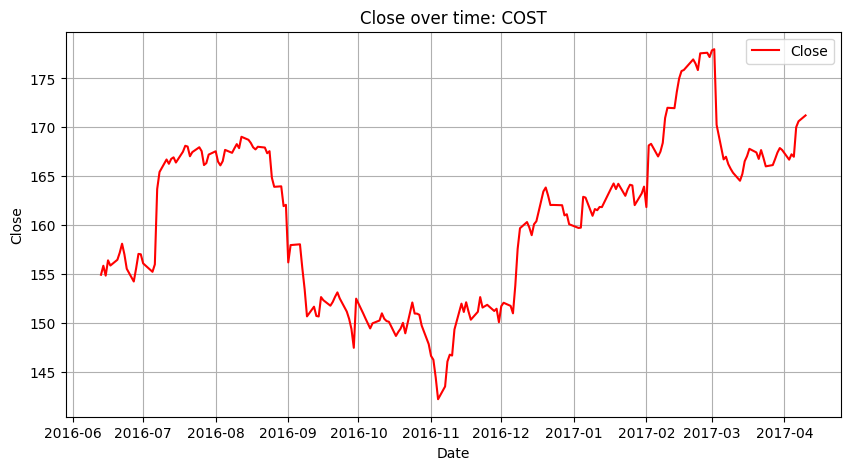

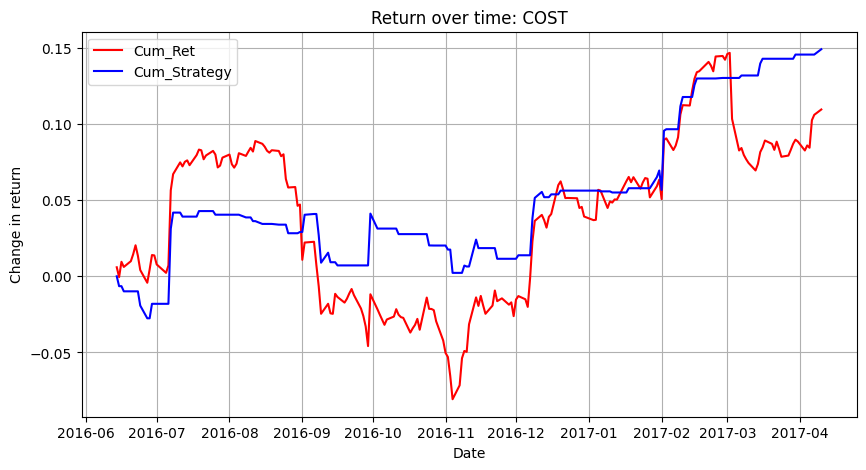

Fold 5:
Modeling  COST
Test accuracy: 0.46411483253588515
Test precision: 0.5
Test recall: 0.5
Test f1: 0.5
Train accuracy: 0.5361904761904762


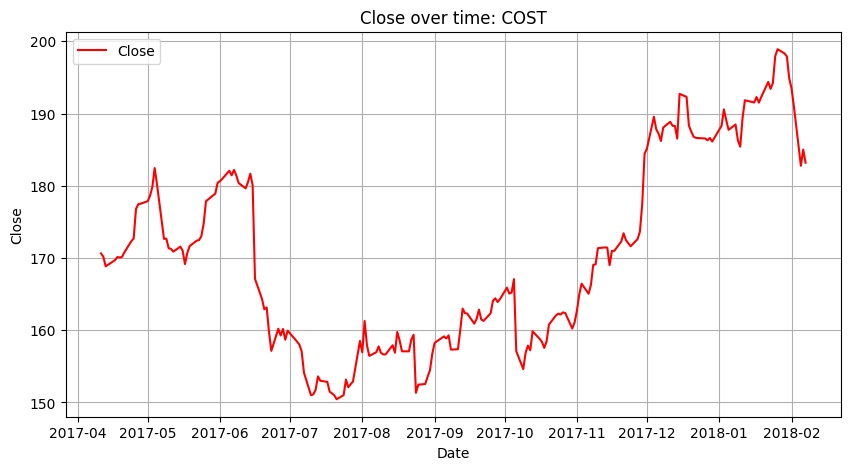

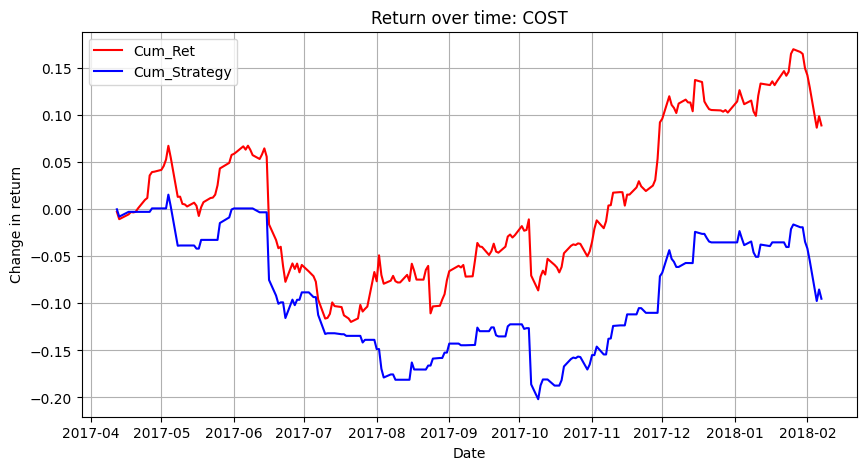

Fold 1:
Modeling  PEP
Test accuracy: 0.5263157894736842
Test precision: 0.6056338028169014
Test recall: 0.37719298245614036
Test f1: 0.4648648648648649
Train accuracy: 0.5560747663551402


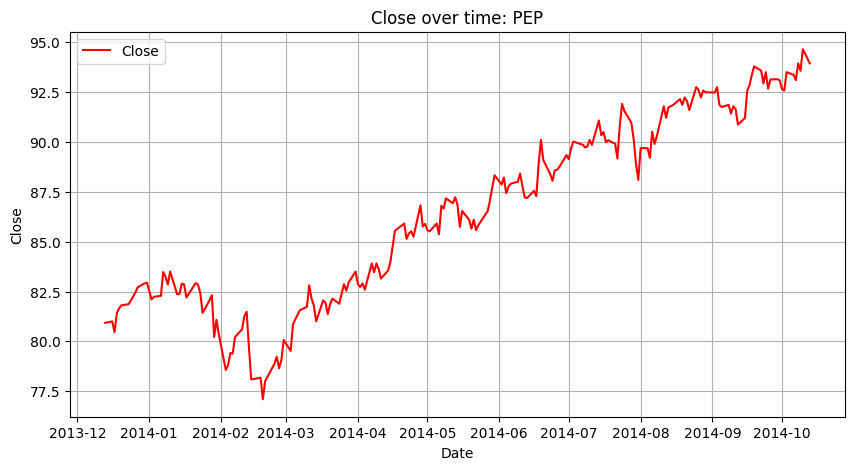

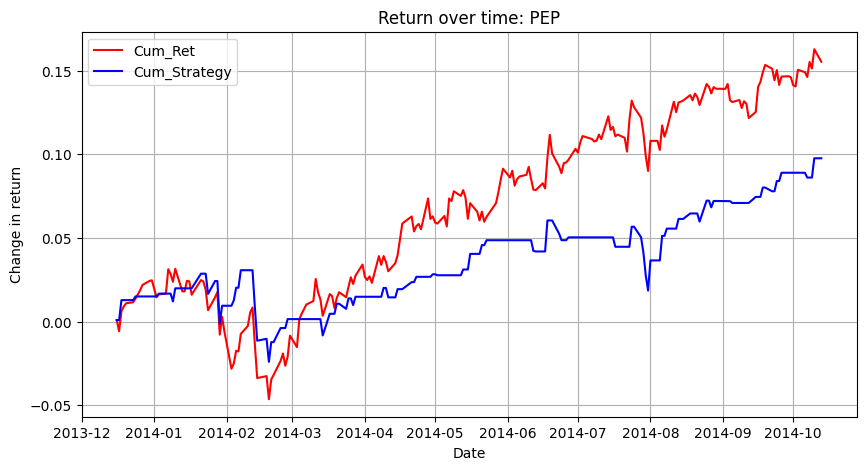

Fold 2:
Modeling  PEP
Test accuracy: 0.4449760765550239
Test precision: 0.4407894736842105
Test recall: 0.6836734693877551
Test f1: 0.536
Train accuracy: 0.6004728132387707


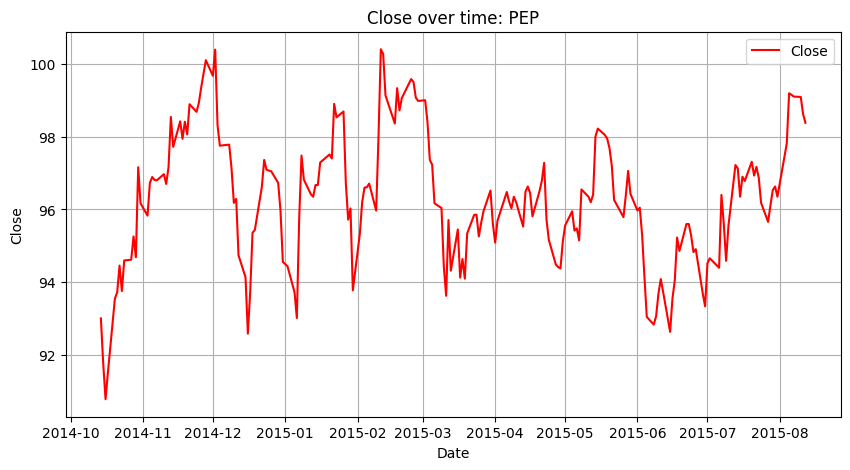

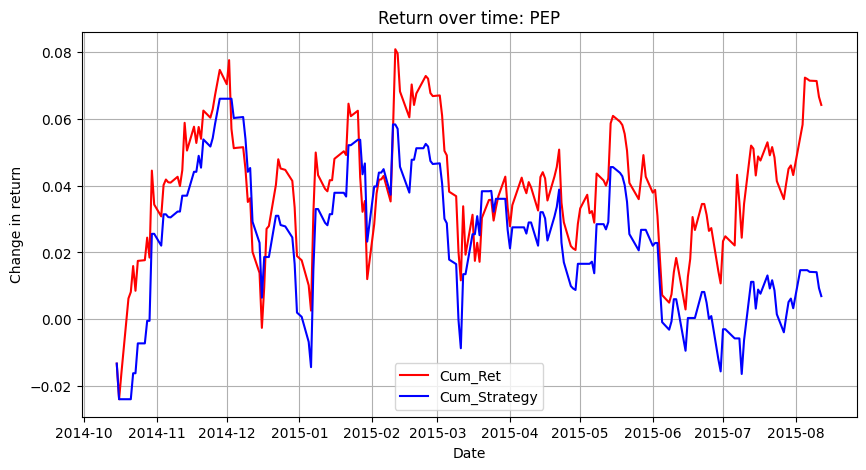

Fold 3:
Modeling  PEP
Test accuracy: 0.5502392344497608
Test precision: 0.5664335664335665
Test recall: 0.7168141592920354
Test f1: 0.6328125
Train accuracy: 0.5490506329113924


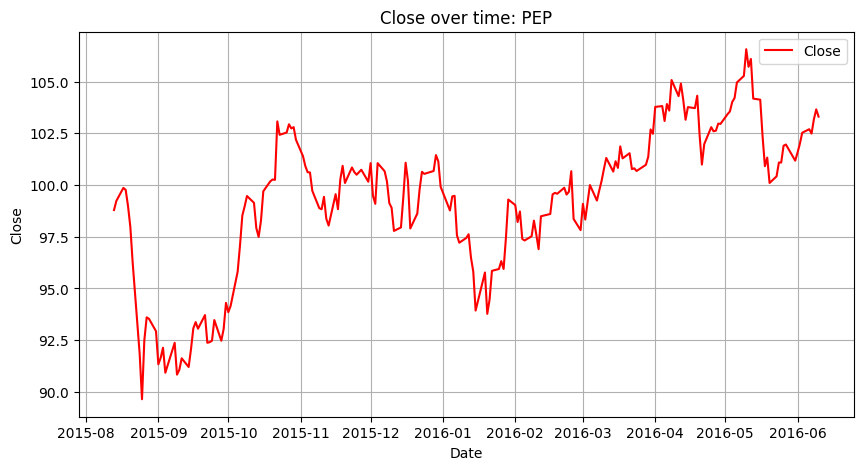

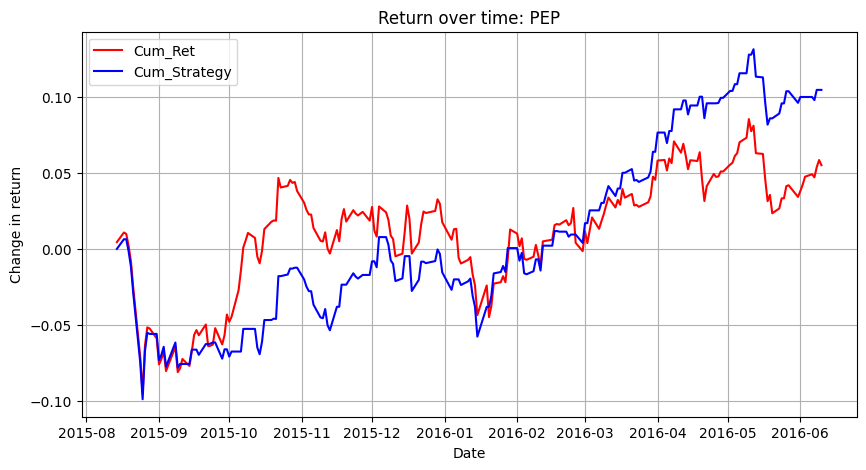

Fold 4:
Modeling  PEP
Test accuracy: 0.507177033492823
Test precision: 0.5114942528735632
Test recall: 0.8317757009345794
Test f1: 0.6334519572953736
Train accuracy: 0.5600475624256838


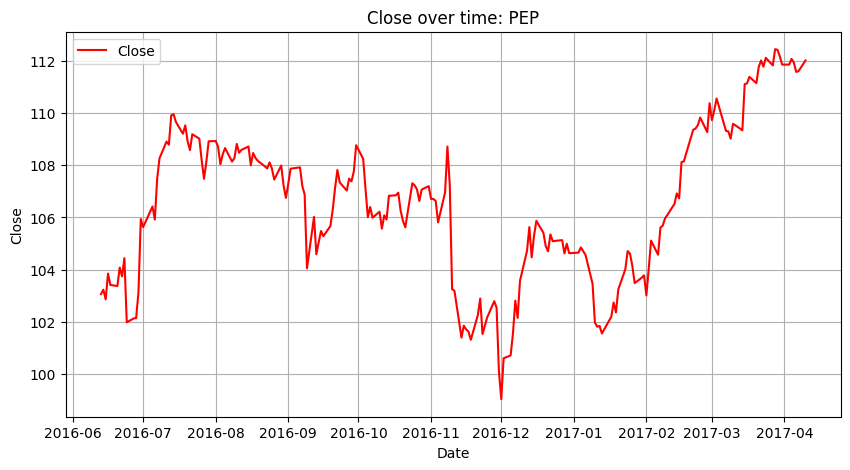

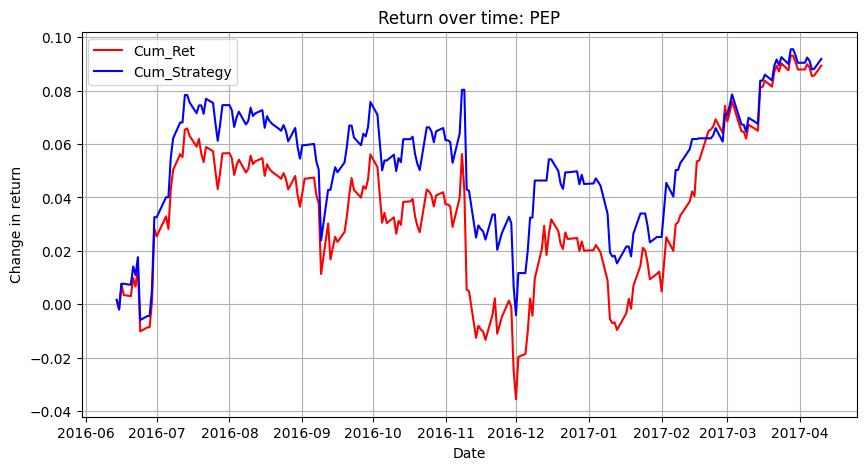

Fold 5:
Modeling  PEP
Test accuracy: 0.5215311004784688
Test precision: 0.5364238410596026
Test recall: 0.7297297297297297
Test f1: 0.6183206106870229
Train accuracy: 0.5542857142857143


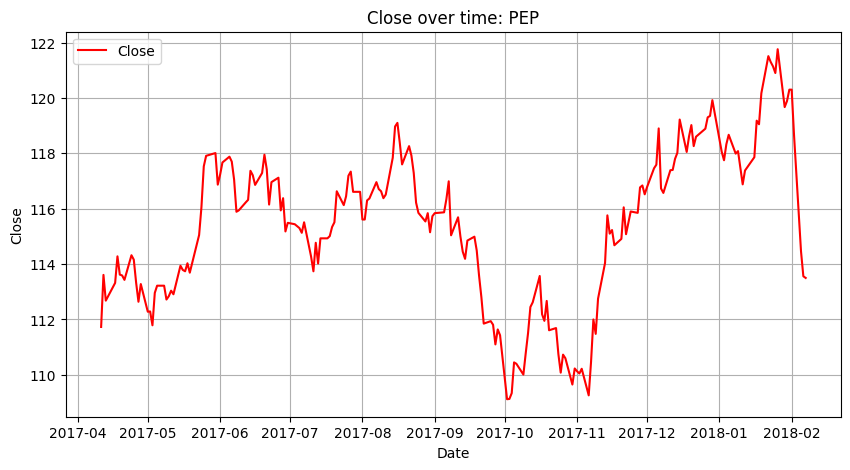

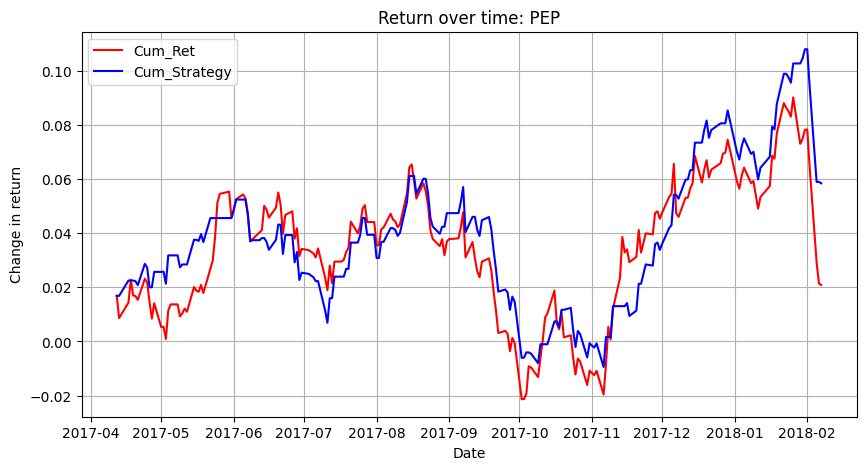

Fold 1:
Modeling  CAT
Test accuracy: 0.5119617224880383
Test precision: 0.45454545454545453
Test recall: 0.04950495049504951
Test f1: 0.08928571428571429
Train accuracy: 0.5700934579439252


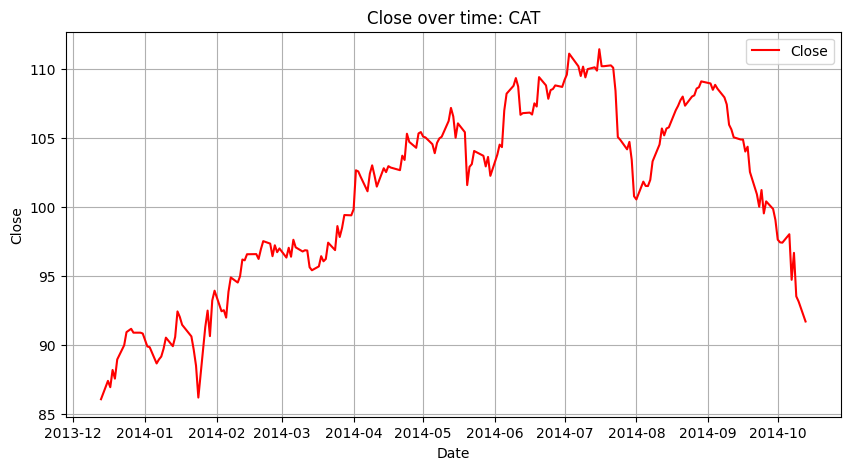

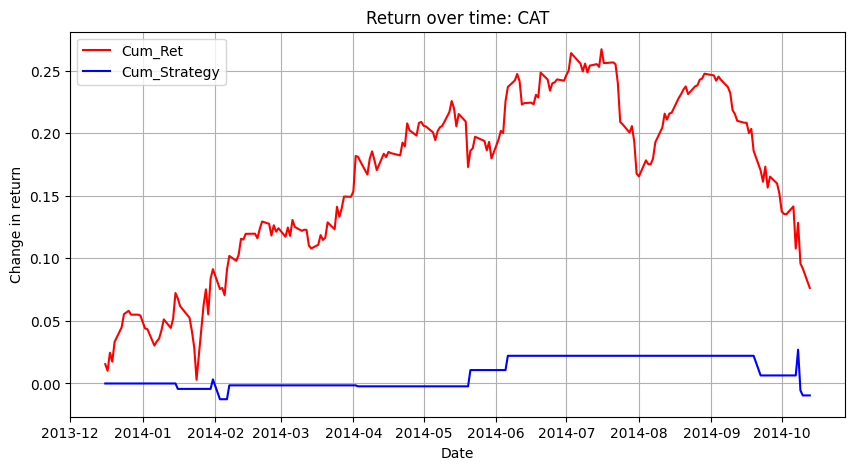

Fold 2:
Modeling  CAT
Test accuracy: 0.5023923444976076
Test precision: 0.3076923076923077
Test recall: 0.04040404040404041
Test f1: 0.07142857142857142
Train accuracy: 0.5390070921985816


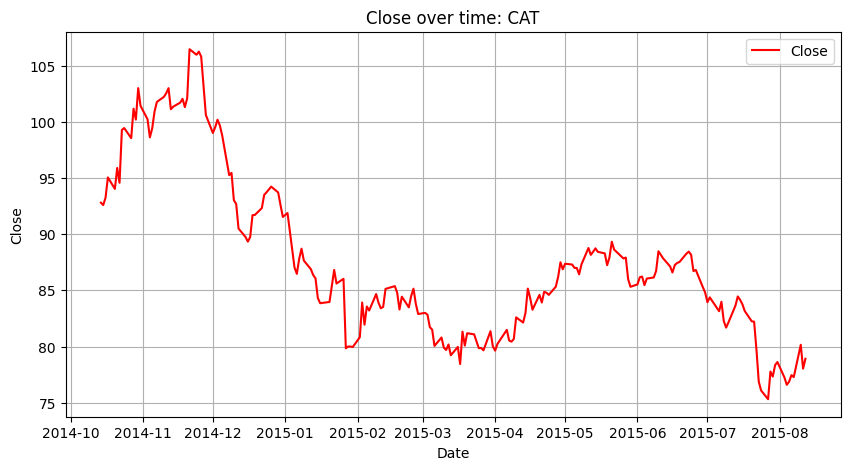

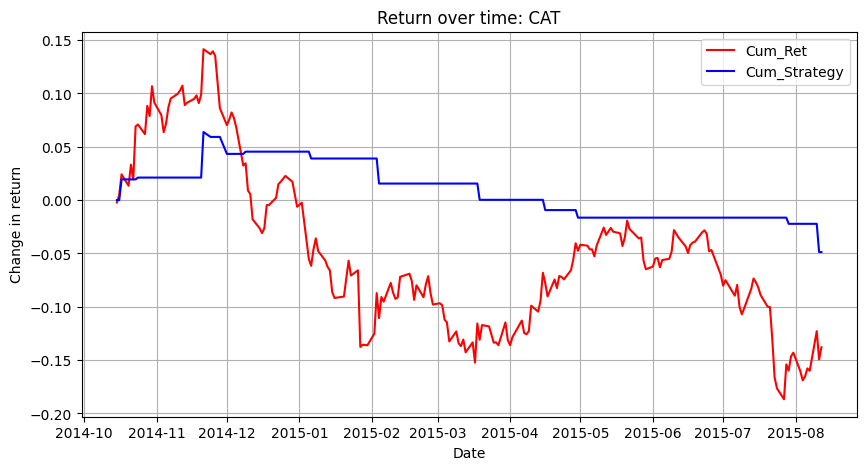

Fold 3:
Modeling  CAT
Test accuracy: 0.5023923444976076
Test precision: 0.6666666666666666
Test recall: 0.056074766355140186
Test f1: 0.10344827586206896
Train accuracy: 0.5316455696202531


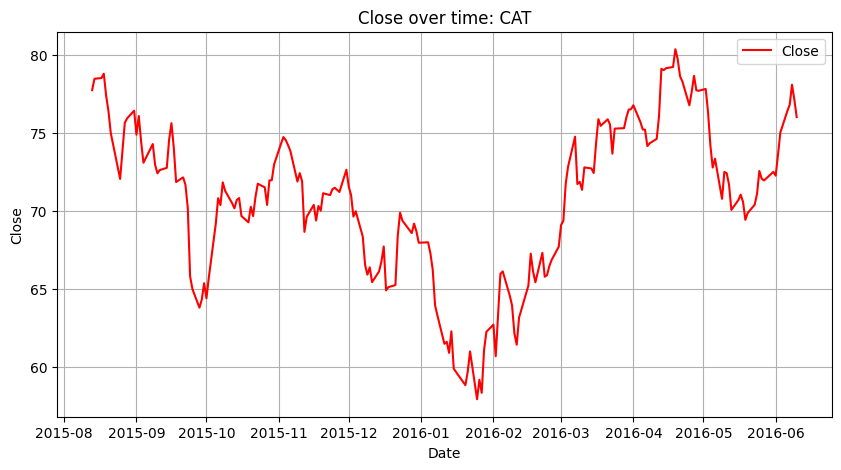

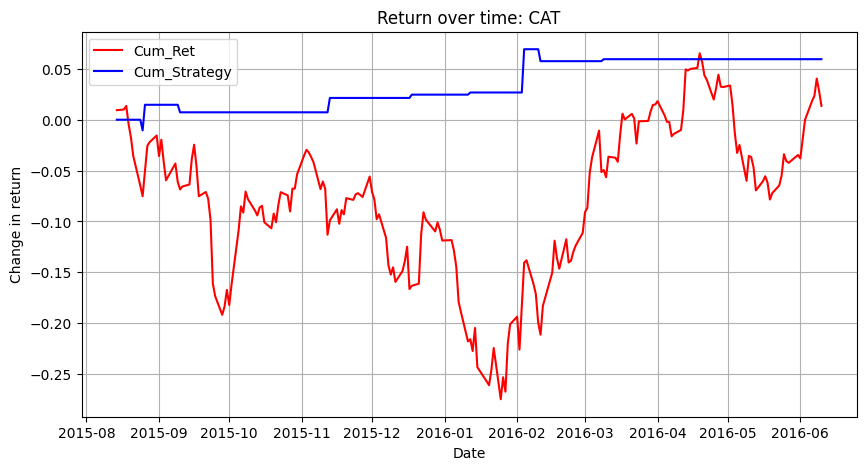

Fold 4:
Modeling  CAT
Test accuracy: 0.5167464114832536
Test precision: 0.5625
Test recall: 0.08737864077669903
Test f1: 0.15126050420168066
Train accuracy: 0.5303210463733651


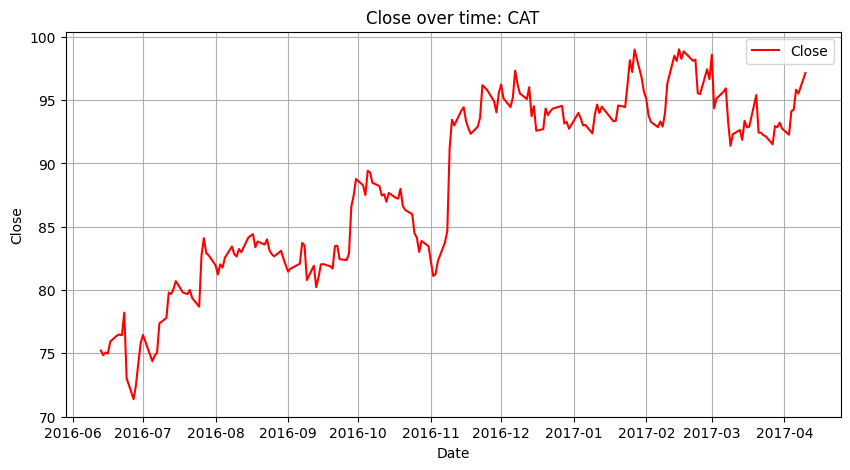

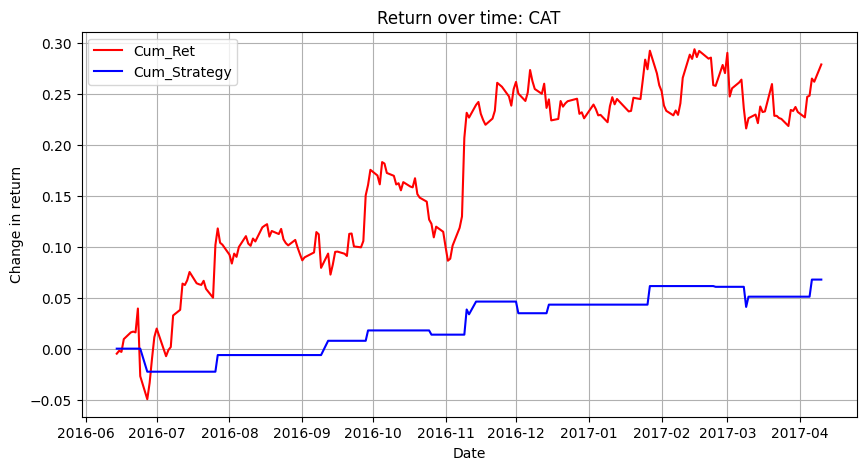

Fold 5:
Modeling  CAT
Test accuracy: 0.46411483253588515
Test precision: 0.6097560975609756
Test recall: 0.2066115702479339
Test f1: 0.30864197530864196
Train accuracy: 0.5342857142857143


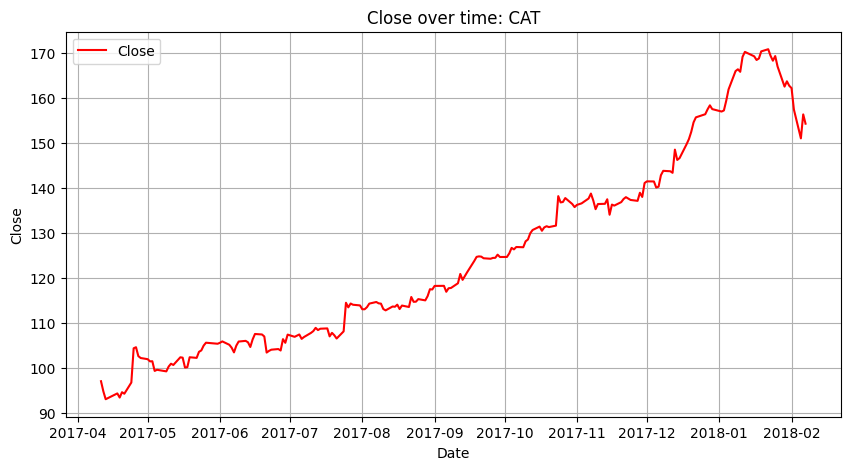

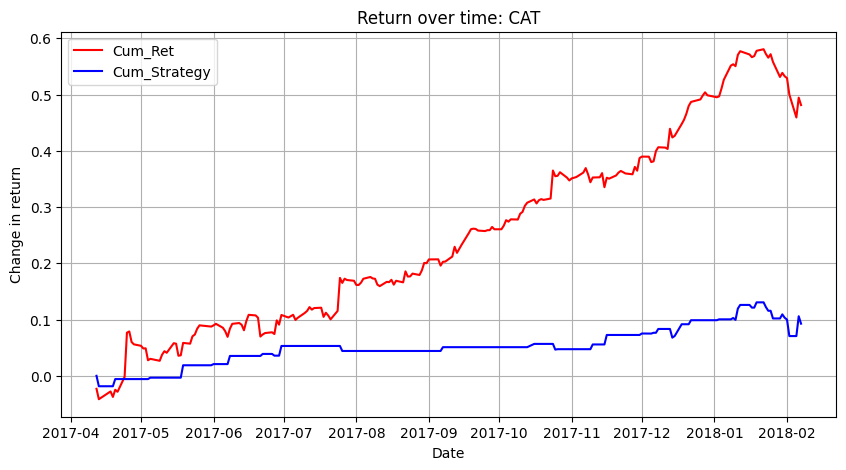

Fold 1:
Modeling  WM
Test accuracy: 0.44019138755980863
Test precision: 0.4473684210526316
Test recall: 0.6732673267326733
Test f1: 0.5375494071146245
Train accuracy: 0.5420560747663551


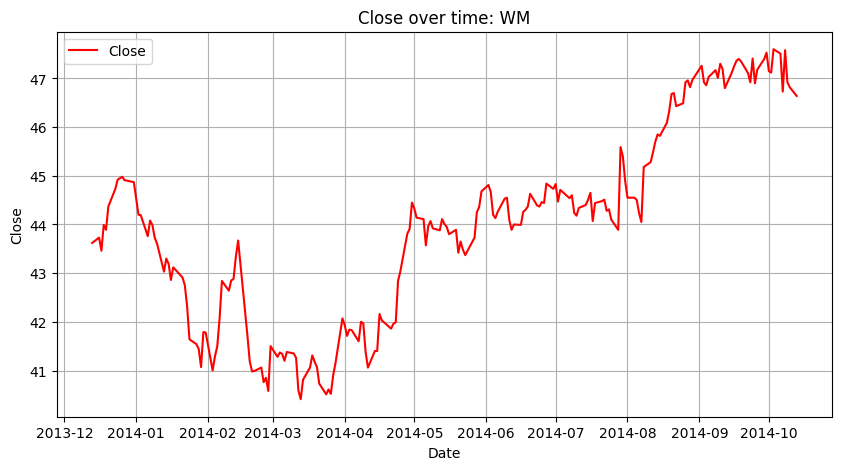

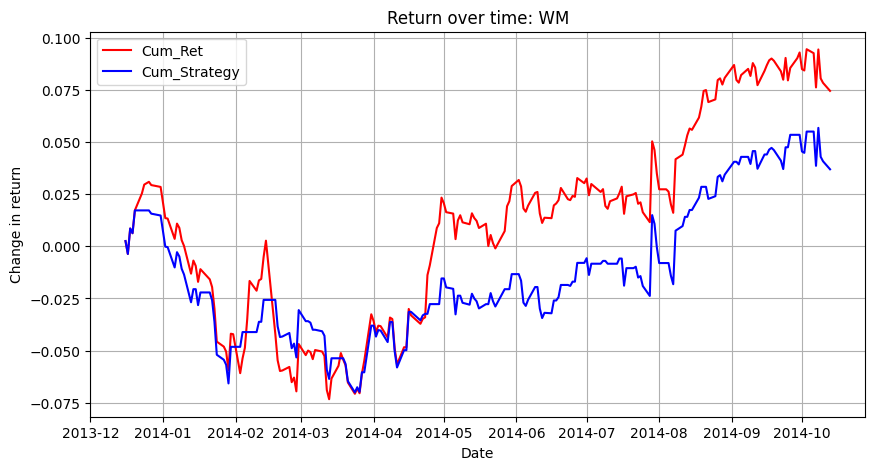

Fold 2:
Modeling  WM
Test accuracy: 0.5454545454545454
Test precision: 0.5655172413793104
Test recall: 0.7192982456140351
Test f1: 0.6332046332046332
Train accuracy: 0.5673758865248227


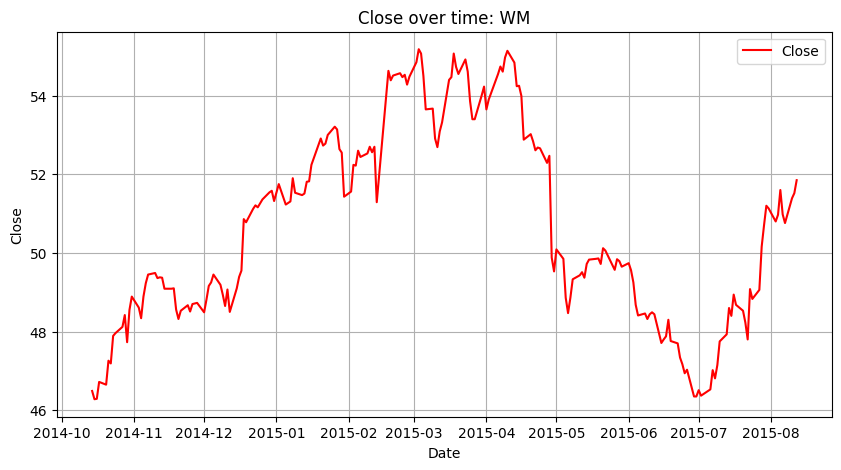

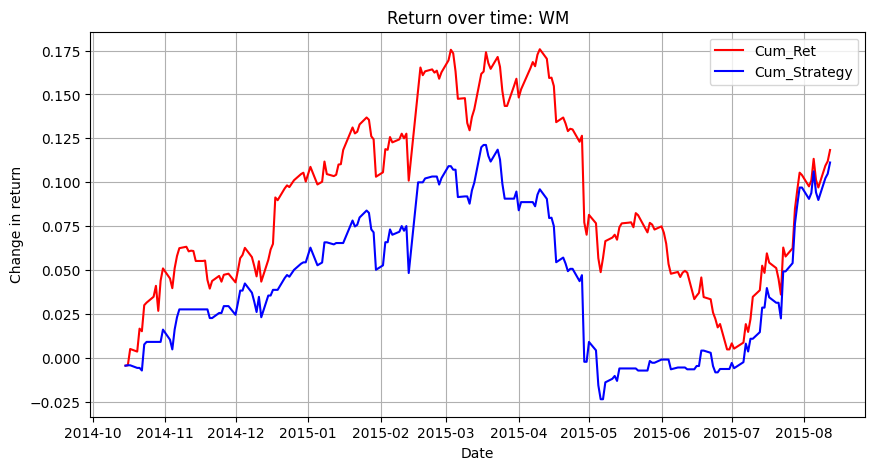

Fold 3:
Modeling  WM
Test accuracy: 0.5454545454545454
Test precision: 0.5543478260869565
Test recall: 0.8869565217391304
Test f1: 0.6822742474916388
Train accuracy: 0.5680379746835443


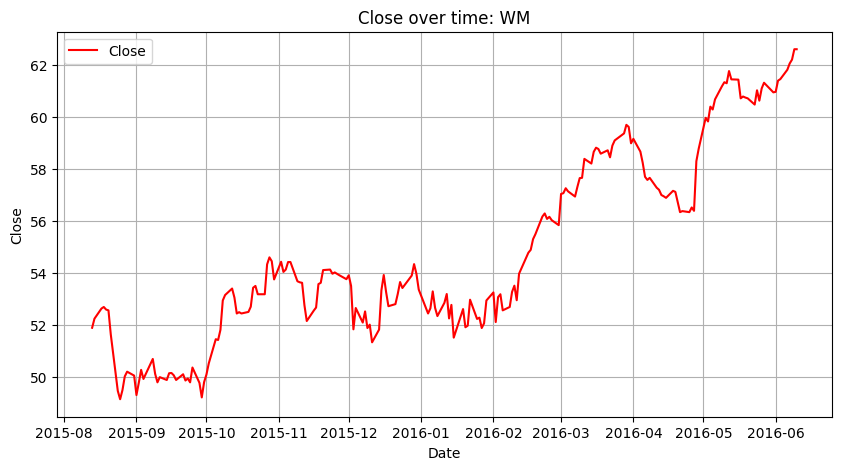

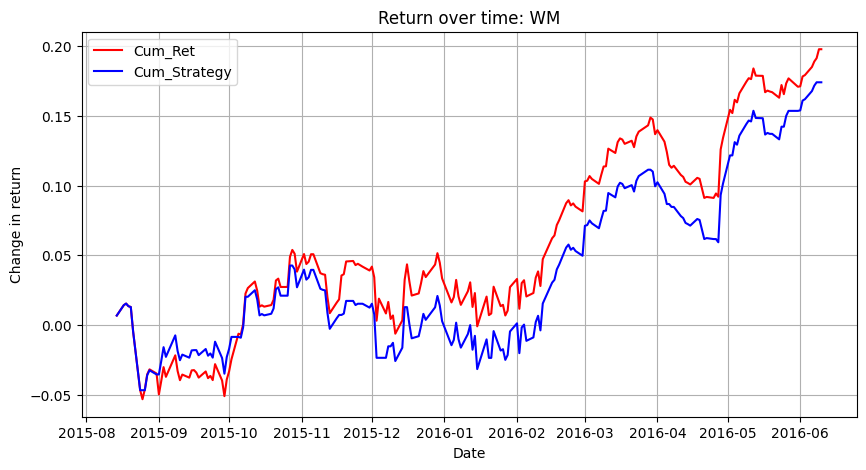

Fold 4:
Modeling  WM
Test accuracy: 0.5885167464114832
Test precision: 0.5921787709497207
Test recall: 0.8907563025210085
Test f1: 0.7114093959731543
Train accuracy: 0.5505350772889417


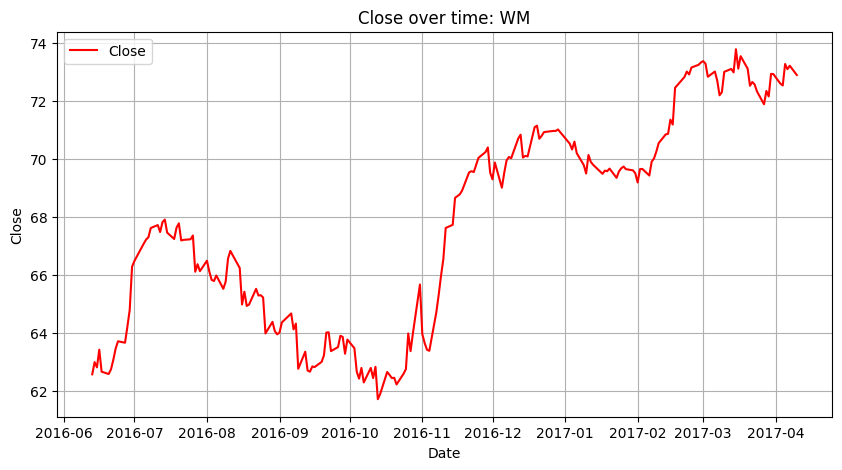

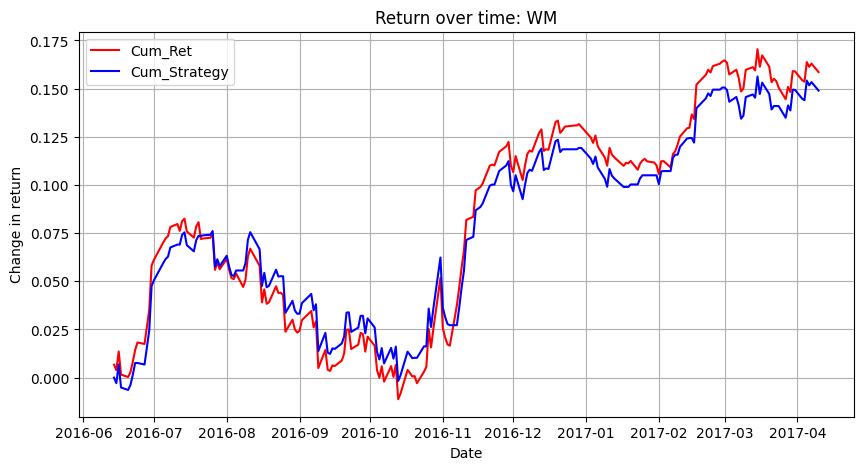

Fold 5:
Modeling  WM
Test accuracy: 0.583732057416268
Test precision: 0.5865384615384616
Test recall: 0.991869918699187
Test f1: 0.7371601208459214
Train accuracy: 0.5342857142857143


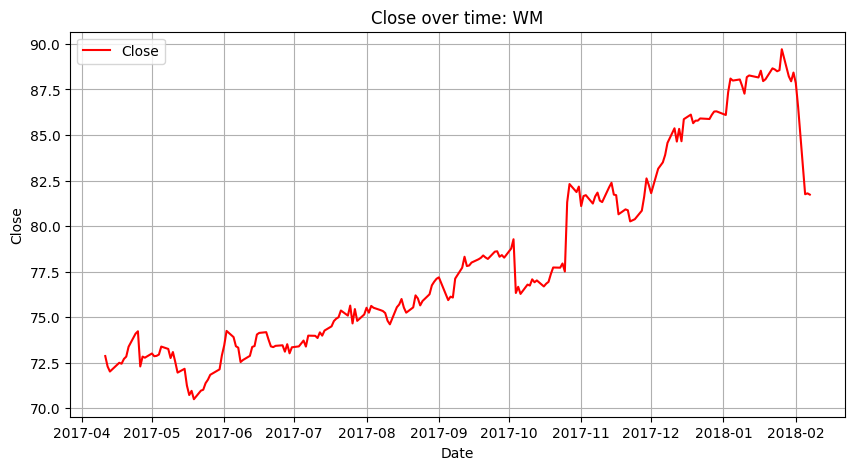

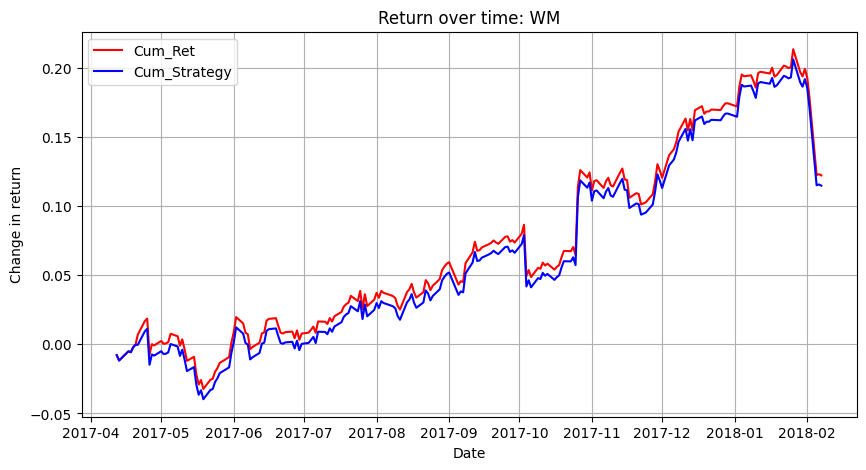

Fold 1:
Modeling  ITW
Test accuracy: 0.5358851674641149
Test precision: 0.5336538461538461
Test recall: 1.0
Test f1: 0.6959247648902821
Train accuracy: 0.5794392523364486


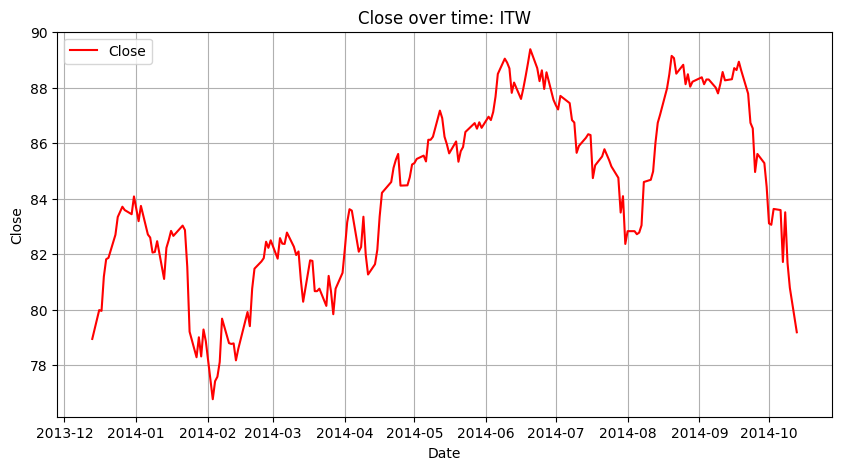

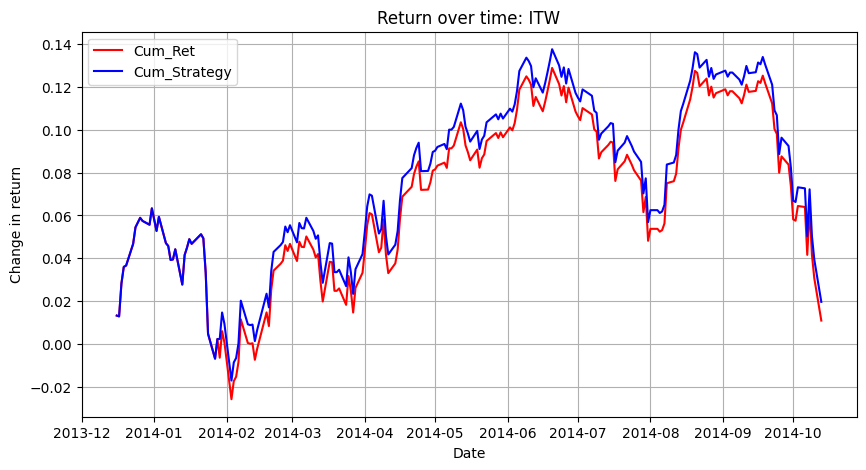

Fold 2:
Modeling  ITW
Test accuracy: 0.507177033492823
Test precision: 0.5050505050505051
Test recall: 0.9523809523809523
Test f1: 0.6600660066006601
Train accuracy: 0.5721040189125296


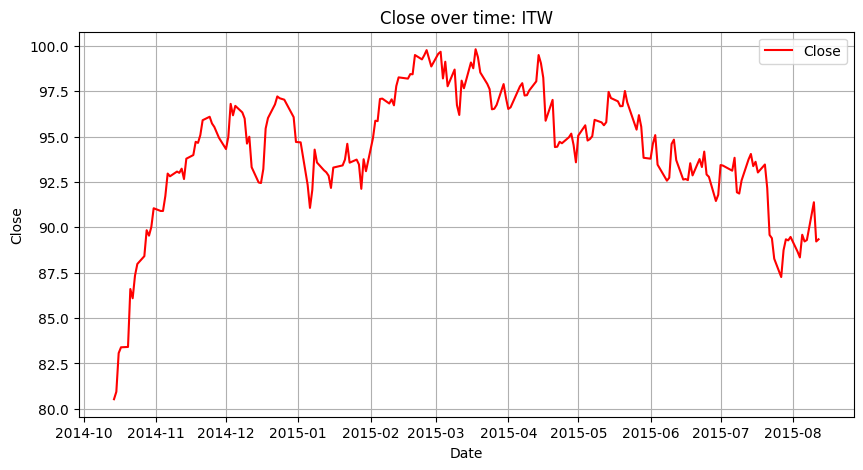

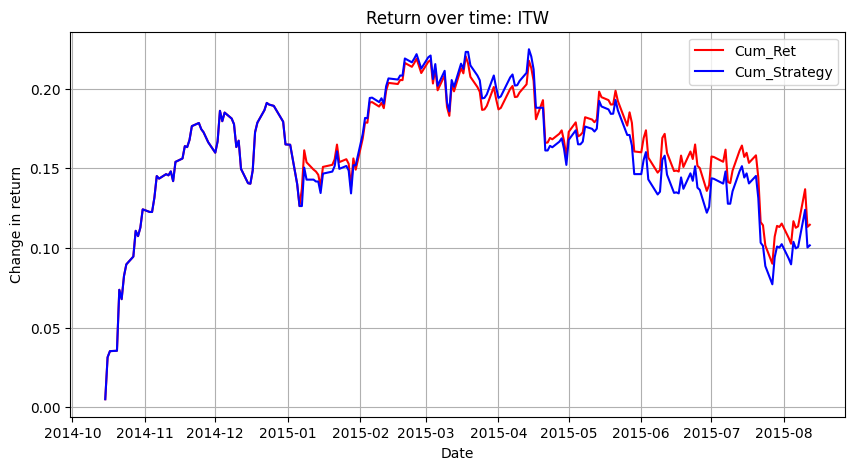

Fold 3:
Modeling  ITW
Test accuracy: 0.49282296650717705
Test precision: 0.5
Test recall: 0.7264150943396226
Test f1: 0.5923076923076923
Train accuracy: 0.5569620253164557


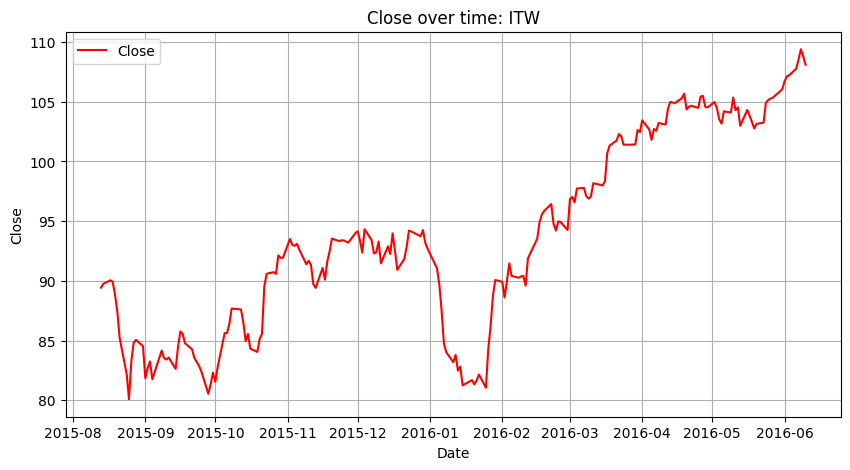

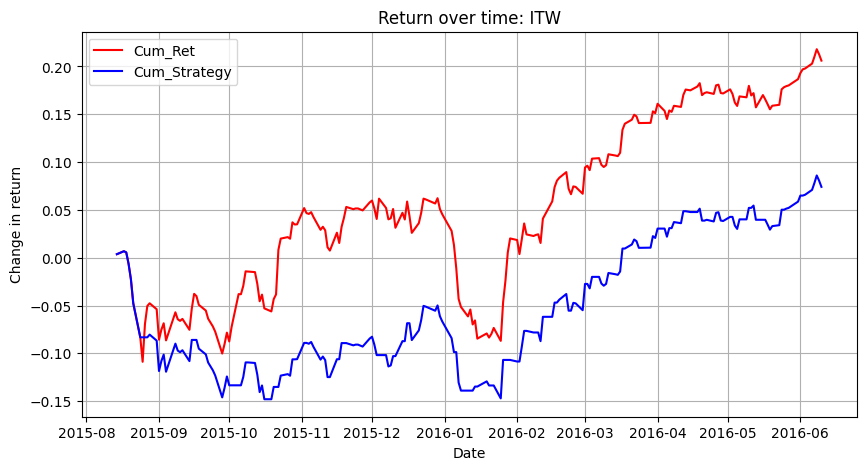

Fold 4:
Modeling  ITW
Test accuracy: 0.5598086124401914
Test precision: 0.5885714285714285
Test recall: 0.8373983739837398
Test f1: 0.6912751677852349
Train accuracy: 0.5505350772889417


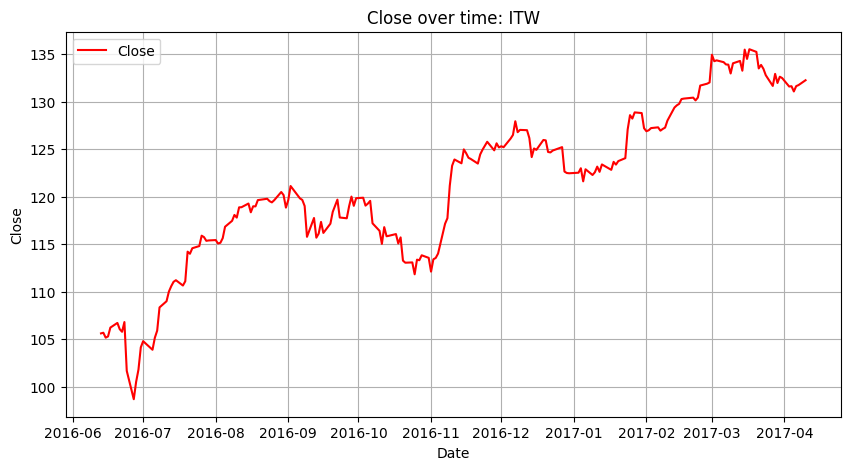

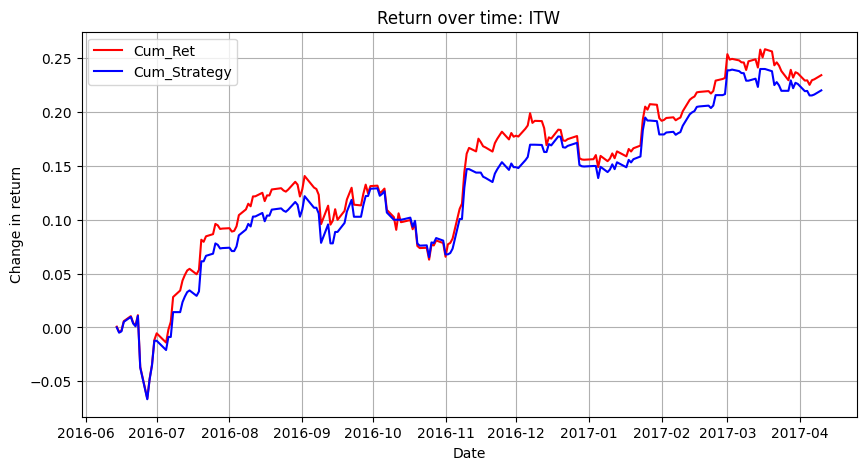

Fold 5:
Modeling  ITW
Test accuracy: 0.5741626794258373
Test precision: 0.581151832460733
Test recall: 0.925
Test f1: 0.7138263665594855
Train accuracy: 0.5514285714285714


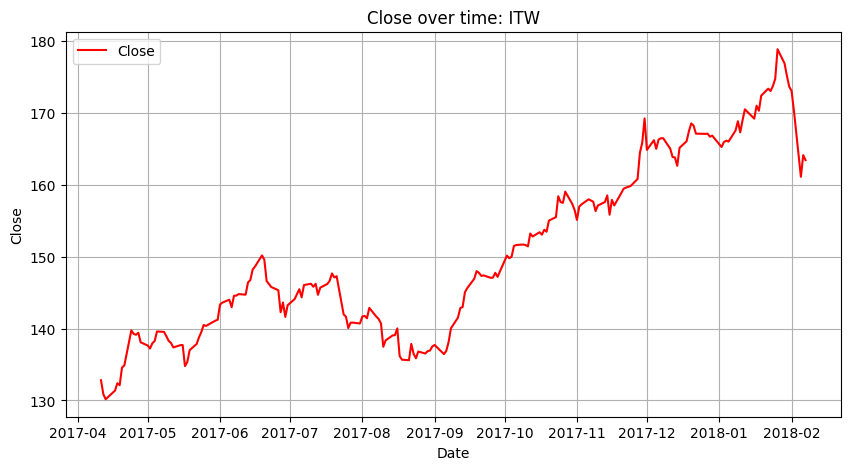

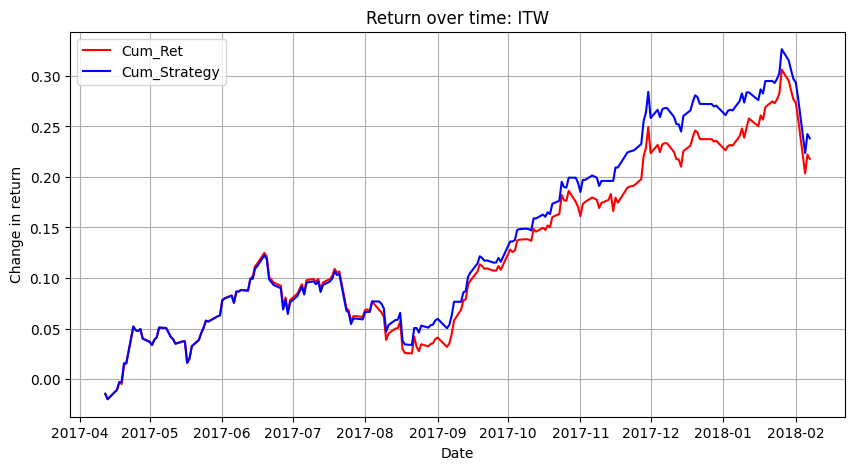

Final returns!!
[-0.010490955071375763, 0.2095311574308386, 0.3231582706526974, 0.4338580968377692, 0.9512642963276436]
[-0.01838004441853014, 0.31265137580583646, 0.1014833069179526, -0.019292647275337083, 0.0909966467954747]
Avg accuracy:  0.5210961287516311
Avg f1:  0.5633500049507993
Avg precision:  0.5362906787035598
Avg recall:  0.6759309025991889


In [12]:
######################################
# Section four - Kfold cross-validation
######################################

# Try this by looping through multiple stock symbols and using a k-fold time-series split

# https://towardsdatascience.com/how-to-cross-validation-with-time-series-data-9802a06272c6
# Try splitting time-series data
from sklearn.model_selection import TimeSeriesSplit

# Define TimeSeriesSplit object
tss = TimeSeriesSplit(n_splits=5)

tick_names = unique_values

tick_names = ['AMZN', 'AAPL', 'MSFT', 'WMT', 'V', 'MA', 'COST', 'PEP', 'CAT', 'WM', 'ITW']

market_return = [0, 0, 0, 0, 0]
strat_return = [0, 0, 0, 0, 0]

num_results = 0
sum_accuracy = 0
sum_precision = 0
sum_recall = 0
sum_f1 = 0

for name in tick_names:
    stock = df.loc[df['Ticks'] == name]
    stock.index = pd.to_datetime(stock['date']) 
    
    # Split & print out results
    for i, (train_index, test_index) in enumerate(tss.split(stock)):
        print(f"Fold {i+1}:")
        stock_train, stock_test = stock.iloc[train_index], stock.iloc[test_index]
        
        print("Modeling ", name) 

        #########
        # Train!
        #########
        
        stock_train['Open-Close'] = stock_train['open'] - stock_train['close']
        stock_train['High-Low'] = stock_train['high'] - stock_train['low']
          
        # Store all predictor variables in a variable X 
        X_train = stock_train[['Open-Close', 'High-Low']] 
        y_train = np.where(stock_train['close'].shift(-1) > stock_train['close'], 1, 0) 
    
        svm = SVC()
        cls = svm.fit(X_train, y_train)
        
        ########
        # Test!
        ########
        
        stock_test['Open-Close'] = stock_test['open'] - stock_test['close']
        stock_test['High-Low'] = stock_test['high'] - stock_test['low']
          
        # Store all predictor variables in a variable X 
        X_test = stock_test[['Open-Close', 'High-Low']] 
        y_test = np.where(stock_test['close'].shift(-1) > stock_test['close'], 1, 0)  
    
        
        y_pred = cls.predict(X_test)
        y_pred_train = cls.predict(X_train)
    
        accuracy = accuracy_score(y_test, y_pred)
        print("Test accuracy:", accuracy)
        
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        print("Test precision:", precision)
        print("Test recall:", recall)
        print("Test f1:", f1)
        sum_accuracy += accuracy
        sum_precision += precision
        sum_recall += recall
        sum_f1 += f1
        
        num_results += 1
        
        
        accuracy = accuracy_score(y_train, y_pred_train)
        print("Train accuracy:", accuracy)
    
        # Only show the returns of the test period:
    
        stock_test['Predicted_Signal'] = cls.predict(X_test)
        stock_test['Return'] = stock_test['close'].pct_change()
        stock_test['Strategy_Return'] = stock_test.Return * stock_test.Predicted_Signal.shift(1)
        stock_test['Cum_Ret'] = stock_test['Return'].cumsum() 
        stock_test['Cum_Strategy'] = stock_test['Strategy_Return'].cumsum()

        # Compare returns for these days
        day1 = stock_test.iloc[1]['Cum_Ret']
        day3 = stock_test.iloc[3]['Cum_Ret']
        day5 = stock_test.iloc[5]['Cum_Ret']
        day10 = stock_test.iloc[10]['Cum_Ret']
        day15 = stock_test.iloc[15]['Cum_Ret']

        strat_day1 = stock_test.iloc[1]['Strategy_Return']
        strat_day3 = stock_test.iloc[3]['Strategy_Return']
        strat_day5 = stock_test.iloc[5]['Strategy_Return']
        strat_day10 = stock_test.iloc[10]['Strategy_Return']
        strat_day15 = stock_test.iloc[15]['Strategy_Return']

        market_return[0] += day1
        market_return[1] += day3
        market_return[2] += day5
        market_return[3] += day10
        market_return[4] += day15
        
        strat_return[0] += strat_day1
        strat_return[1] += strat_day3
        strat_return[2] += strat_day5
        strat_return[3] += strat_day10
        strat_return[4] += strat_day15
    
    
        plt.figure(figsize=(10, 5))
        plt.plot(stock_test['close'],color='red', label="Close") 
        plt.title('Close over time: ' + name, )
        plt.xlabel('Date')
        plt.ylabel('Close')
        plt.legend()
        plt.grid(True)
        plt.show()
    
        plt.figure(figsize=(10, 5))
        plt.plot(stock_test['Cum_Ret'],color='red', label="Cum_Ret") 
        plt.plot(stock_test['Cum_Strategy'],color='blue', label="Cum_Strategy")
        plt.title('Return over time: ' + name, )
        plt.xlabel('Date')
        plt.ylabel('Change in return')
        plt.legend()
        plt.grid(True)
        plt.show()

print("Final returns!!")
print(market_return)
print(strat_return)

print("Avg accuracy: ", sum_accuracy / num_results)
print("Avg f1: ", sum_f1 / num_results)
print("Avg precision: ", sum_precision / num_results)
print("Avg recall: ", sum_recall / num_results)
    

In [27]:
##############
# Section four 
##############

# Try this by looping through multiple stock symbols

# https://towardsdatascience.com/how-to-cross-validation-with-time-series-data-9802a06272c6
# Try splitting time-series data
from sklearn.model_selection import TimeSeriesSplit

neg_mark = 0
better_than_neg = 0

# Iterate over random sets for 5 splits
for size in range (16, 150, 5):
    # Define TimeSeriesSplit object
    tss = TimeSeriesSplit(n_splits=2, test_size=size)
    
    # Removed 'APTV', 'BHF',DHR, BHGE, ES, FTV, 'O', DVN, 'DVA','DTE',

    # A mostly random selection of stocks from S&P500
    tick_names = ["MSFT", "ADBE", "AMZN", "GOOGL", "GOOG", "AAPL", "V", "MA", 'ATVI', 'AVB', 'AVGO', 'AVY', 'AWK', 'AXP',
        'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY', 'BDX', 'BEN', 'BF.B',
        'BIIB', 'BK', 'BLK', 'BLL', 'BMY', 'BRK.B', 'BSX',
        'HP', 'HRB', 'HRL', 'HRS', 'HSIC', 'HST', 'HSY', 'HUM', 'IBM', 'ICE', 'IDXX', 'IFF',
        'ILMN', 'INCY','NAVI', 'NBL', 'NCLH', 'NDAQ', 'NEE', 'NEM', 'NFLX', 'NFX', 'NI', 'NKE', 'NLSN',
        'NOC', 'NOV', 'NRG', 'NSC', 'NTAP', 'NUE', 'NVDA', 'NWL', 'NWSA', 'NWS',
        'OKE', 'OMC', 'ORCL',
                     'WY', 'XEC', 'XEL', 'XLNX', 'XL', 'XRAY', 'XRX', 'XYL', 'YUM', 'ZBH', 'ZION',
        'ZTS'
                 ]
        
    
    market_return = [0, 0, 0, 0, 0, 0]
    strat_return = [0, 0, 0, 0, 0, 0]
    
    
    for name in tick_names:
        stock = df.loc[df['Ticks'] == name]
        stock.index = pd.to_datetime(stock['date']) 
        
        # Split & print out results
        # Limit the test size to 30 days
        for i, (train_index, test_index) in enumerate(tss.split(stock)):
            # print(f"Fold {i+1}:")
            stock_train, stock_test = stock.iloc[train_index], stock.iloc[test_index]
        
            # Train!
        
            stock_train['Open-Close'] = stock_train['open'] - stock_train['close']
            stock_train['High-Low'] = stock_train['high'] - stock_train['low']
              
            # Store all predictor variables in a variable X 
            X_train = stock_train[['Open-Close', 'High-Low']] 
            y_train = np.where(stock_train['close'].shift(-1) > stock_train['close'], 1, 0) 
        
            svm = SVC(kernel ='sigmoid')
            cls = svm.fit(X_train, y_train)
        
            # Test!
            stock_test['Open-Close'] = stock_test['open'] - stock_test['close']
            stock_test['High-Low'] = stock_test['high'] - stock_test['low']
              
            # Store all predictor variables in a variable X 
            X_test = stock_test[['Open-Close', 'High-Low']] 
            y_test = np.where(stock_test['close'].shift(-1) > stock_test['close'], 1, 0)  
        
            
            y_pred = cls.predict(X_test)
            y_pred_train = cls.predict(X_train)
        
            accuracy = accuracy_score(y_test, y_pred)
            # # print("Test accuracy:", accuracy)
            
            accuracy = accuracy_score(y_train, y_pred_train)
            # print("Train accuracy:", accuracy)
        
            # Only show the returns of the test period:
        
            stock_test['Predicted_Signal'] = cls.predict(X_test)
            stock_test['Return'] = stock_test['close'].pct_change()
            stock_test['Strategy_Return'] = stock_test.Return * stock_test.Predicted_Signal.shift(1)
            stock_test['Cum_Ret'] = stock_test['Return'].cumsum() 
            stock_test['Cum_Strategy'] = stock_test['Strategy_Return'].cumsum()
    
            # Compare returns for these days
            day0 = stock_test.iloc[0]['Cum_Ret']
            day1 = stock_test.iloc[1]['Cum_Ret']
            day3 = stock_test.iloc[3]['Cum_Ret']
            day5 = stock_test.iloc[5]['Cum_Ret']
            day10 = stock_test.iloc[10]['Cum_Ret']
            day15 = stock_test.iloc[15]['Cum_Ret']
    
            strat_day0 = stock_test.iloc[0]['Cum_Strategy']
            strat_day1 = stock_test.iloc[1]['Cum_Strategy']
            strat_day3 = stock_test.iloc[3]['Cum_Strategy']
            strat_day5 = stock_test.iloc[5]['Cum_Strategy']
            strat_day10 = stock_test.iloc[10]['Cum_Strategy']
            strat_day15 = stock_test.iloc[15]['Cum_Strategy']
    
            market_return[0] += day0
            market_return[1] += day1
            market_return[2] += day3
            market_return[3] += day5
            market_return[4] += day10
            market_return[5] += day15
    
            strat_return[0] += strat_day0
            strat_return[1] += strat_day1
            strat_return[2] += strat_day3
            strat_return[3] += strat_day5
            strat_return[4] += strat_day10
            strat_return[5] += strat_day15

    if (market_return[1] < 0):
        neg_mark += 1
        if (market_return[1] < strat_return[1]):
            better_than_neg += 1
        
    
    print("Final returns!!")
    
    print(market_return)
    print(strat_return)
    print("Neg market: ", neg_mark)
    print("Better than negative market: ", better_than_neg)
    

Final returns!!
[nan, -0.23084629310796723, 0.7597311432315546, 1.1444808725856566, 3.568370092425279, 0.2704893038971482]
[nan, -0.16334156759154794, 0.39958087593328917, 0.5931194985368229, 1.5465122166805845, -0.22660547250721585]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.4110901705252885, 1.7483373049635742, 1.3705059762260703, 3.3555579379555227, 2.896408457870812]
[nan, 0.07741471165679181, 0.6816953448726195, 0.25607126710701367, 1.0233104962023076, 0.7118405337297258]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.8005677571560169, 2.675959762068377, 3.573030025462433, 4.4412706639486235, 5.525728175689272]
[nan, 0.2887125929207979, 1.2096050516518784, 1.5799976897919477, 1.7094085789255669, 2.0996163548262987]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, -0.2946830331456538, -0.1190023587007597, -0.07088603415480144, 3.0132272519579333, 6.090457035467647]
[nan, -0.13258193731353407, -0.087093968066631

In [28]:
# Try this by looping through multiple stock symbols

# Pick a few stocks
tick_names = ["MSFT", "ADBE", "AMZN", "GOOGL", "GOOG", "AAPL", "V", "MA", 'ATVI', 'AVB', 'AVGO', 'AVY', 'AWK', 'AXP',
        'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY', 'BDX', 'BEN', 'BF.B',
        'BIIB', 'BK', 'BLK', 'BLL', 'BMY', 'BRK.B', 'BSX',
        'HP', 'HRB', 'HRL', 'HRS', 'HSIC', 'HST', 'HSY', 'HUM', 'IBM', 'ICE', 'IDXX', 'IFF',
        'ILMN', 'INCY','NAVI', 'NBL', 'NCLH', 'NDAQ', 'NEE', 'NEM', 'NFLX', 'NFX', 'NI', 'NKE', 'NLSN',
        'NOC', 'NOV', 'NRG', 'NSC', 'NTAP', 'NUE', 'NVDA', 'NWL', 'NWSA', 'NWS',
        'OKE', 'OMC', 'ORCL',
                     'WY', 'XEC', 'XEL', 'XLNX', 'XL', 'XRAY', 'XRX', 'XYL', 'YUM', 'ZBH', 'ZION',
        'ZTS']

neg_mark = 0
better_than_neg = 0

import random

# Perform random splits to see out out strategy compares to other strategies
for random_split in range(0,100):

    random_split = random.uniform(0.5, 0.9)

    print(random_split)

    market_return = [0, 0, 0, 0, 0, 0]
    strat_return = [0, 0, 0, 0, 0, 0]

    # Train a model for each stock
    for name in tick_names:
        stock = df.loc[df['Ticks'] == name]
        stock.index = pd.to_datetime(stock['date']) 
    
        stock = stock.drop(['date'], axis='columns') 
        stock['Open-Close'] = stock['open'] - stock['close']
        stock['High-Low'] = stock['high'] - stock['low']
          
        # Store all predictor variables in a variable X 
        X = stock[['Open-Close', 'High-Low']] 
    
        y = np.where(stock['close'].shift(-1) > stock['close'], 1, 0) 
        split_percentage = random_split
        split = int(split_percentage*len(X)) 
          
        # Train data set 
        X_train = X[:split] 
        y_train = y[:split] 
          
        # Test data set 
        X_test = X[split:] 
        y_test = y[split:]
    
        svm = SVC()
        cls = svm.fit(X_train, y_train)
        
        y_pred = cls.predict(X_test)
        y_pred_train = cls.predict(X_train)
 
        # Only show the returns of the test period:
    
        stock_future = stock[split:]
    
        stock_future['Predicted_Signal'] = cls.predict(X_test)
        stock_future['Return'] = stock_future['close'].pct_change()
        stock_future['Strategy_Return'] = stock_future.Return * stock_future.Predicted_Signal.shift(1)
        stock_future['Cum_Ret'] = stock_future['Return'].cumsum() 
        stock_future['Cum_Strategy'] = stock_future['Strategy_Return'].cumsum() 
    
        # Compare returns for these days
        day0 = stock_future.iloc[0]['Cum_Ret']
        day1 = stock_future.iloc[1]['Cum_Ret']
        day3 = stock_future.iloc[3]['Cum_Ret']
        day5 = stock_future.iloc[5]['Cum_Ret']
        day10 = stock_future.iloc[10]['Cum_Ret']
        day15 = stock_future.iloc[15]['Cum_Ret']
    
        strat_day0 = stock_future.iloc[0]['Cum_Strategy']
        strat_day1 = stock_future.iloc[1]['Cum_Strategy']
        strat_day3 = stock_future.iloc[3]['Cum_Strategy']
        strat_day5 = stock_future.iloc[5]['Cum_Strategy']
        strat_day10 = stock_future.iloc[10]['Cum_Strategy']
        strat_day15 = stock_future.iloc[15]['Cum_Strategy']

        market_return[0] += day0
        market_return[1] += day1
        market_return[2] += day3
        market_return[3] += day5
        market_return[4] += day10
        market_return[5] += day15

        strat_return[0] += strat_day0
        strat_return[1] += strat_day1
        strat_return[2] += strat_day3
        strat_return[3] += strat_day5
        strat_return[4] += strat_day10
        strat_return[5] += strat_day15
    
    if (market_return[1] < 0):
        neg_mark += 1
        if (market_return[1] < strat_return[1]):
            better_than_neg += 1
        
    
    print("Final returns!!")
    
    print(market_return)
    print(strat_return)
    print("Neg market: ", neg_mark)
    print("Better than negative market: ", better_than_neg)


0.7550844015590115
Final returns!!
[nan, -0.1508649468214197, 0.07266321449889701, 0.8808070679714461, 0.6917417641075574, 2.3118469345714154]
[nan, -0.009931315000174523, 0.11808593615758411, 0.7325133453227041, 0.5080353049519774, 1.5581066076422248]
Neg market:  1
Better than negative market:  1
0.5898159512771148
Final returns!!
[nan, 1.4197579006286374, 1.5079765016370819, 1.2224067005538581, 2.739801364233242, -1.6490243192092904]
[nan, 0.8017454770302928, 0.7224595269244785, 0.3282488211263008, 1.041242355520313, -1.4402053014314948]
Neg market:  1
Better than negative market:  1
0.875019917221005
Final returns!!
[nan, 0.11859040067728632, 0.12545049896207938, -0.12493188813266021, -0.24558005202768873, 1.5685010155794927]
[nan, 0.06835791979924866, 0.053497541521950076, -0.16710168571389472, -0.11104145611866789, 1.2896584219669764]
Neg market:  1
Better than negative market:  1
0.6239175588597552
Final returns!!
[nan, -0.10321856583279865, 0.8038448179374679, 1.279178096798877

# Other Data Examples from experiments 

<!-- tick_names = ["MSFT", "ADBE", "AMZN", "GOOGL", "GOOG", "AAPL", "V", "MA", 'ATVI', 'AVB', 'AVGO', 'AVY', 'AWK', 'AXP',
    'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY', 'BDX', 'BEN', 'BF.B',
    'BIIB', 'BK', 'BLK', 'BLL', 'BMY', 'BRK.B', 'BSX',
    'HP', 'HRB', 'HRL', 'HRS', 'HSIC', 'HST', 'HSY', 'HUM', 'IBM', 'ICE', 'IDXX', 'IFF',
    'ILMN', 'INCY','NAVI', 'NBL', 'NCLH', 'NDAQ', 'NEE', 'NEM', 'NFLX', 'NFX', 'NI', 'NKE', 'NLSN',
    'NOC', 'NOV', 'NRG', 'NSC', 'NTAP', 'NUE', 'NVDA', 'NWL', 'NWSA', 'NWS',
    'OKE', 'OMC', 'ORCL','WY', 'XEC', 'XEL', 'XLNX', 'XL', 'XRAY', 'XRX', 'XYL', 'YUM', 'ZBH', 'ZION',
    'ZTS'] -->

# Youll see in all these kfold tests that the 1-day out (index 1) is consistently higher than the market
# Market is first row, strategy is second row

# Days is the number of splits, all test sizes were 30
Here we sum the returns for all stocks for all folds (one-day out), and compare the cumulative market result to the model strategy result.

# 3 days: 
0.19985409669712717
0.3924281793412364
             
# 5 days:
0.5874899900064499
0.7585442365270453

# 10 days:
0.7444966521630164
0.8918709816763325

# 15 days:
-0.48675826342066464
0.28104718251779504

# 20 days:
-3.2331655087226743
-1.2763742348469993

# 25 days:
-5.411893577279912
-2.4770446544000313

Input:

neg_mark = 0
better_than_neg = 0

# Iterate over random sets for 5 splits
for size in range (16, 70, 3):
    # https://towardsdatascience.com/how-to-cross-validation-with-time-series-data-9802a06272c6
    # Try splitting time-series data
    from sklearn.model_selection import TimeSeriesSplit
    
    # Define TimeSeriesSplit object
    tss = TimeSeriesSplit(n_splits=5, test_size=size)
    
    # Removed 'APTV', 'BHF',DHR, BHGE, ES, FTV, 'O', DVN, 'DVA','DTE',
    
    tick_names = ["MSFT", "ADBE", "AMZN", "GOOGL", "GOOG", "AAPL", "V", "MA", 'ATVI', 'AVB', 'AVGO', 'AVY', 'AWK', 'AXP',
        'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY', 'BDX', 'BEN', 'BF.B',
        'BIIB', 'BK', 'BLK', 'BLL', 'BMY', 'BRK.B', 'BSX',
        'HP', 'HRB', 'HRL', 'HRS', 'HSIC', 'HST', 'HSY', 'HUM', 'IBM', 'ICE', 'IDXX', 'IFF',
        'ILMN', 'INCY','NAVI', 'NBL', 'NCLH', 'NDAQ', 'NEE', 'NEM', 'NFLX', 'NFX', 'NI', 'NKE', 'NLSN',
        'NOC', 'NOV', 'NRG', 'NSC', 'NTAP', 'NUE', 'NVDA', 'NWL', 'NWSA', 'NWS',
        'OKE', 'OMC', 'ORCL',
                     'WY', 'XEC', 'XEL', 'XLNX', 'XL', 'XRAY', 'XRX', 'XYL', 'YUM', 'ZBH', 'ZION',
        'ZTS'
                 ]

                 

Final returns!!
[nan, 0.4646685579288795, 1.018092663546497, 1.3862295534760736, 4.801351989277899, 3.402647543186089]
[nan, 0.5251374394812977, 1.1733351718584302, 1.5679274506086673, 4.078451680471862, 3.0942075631169548]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, 1.1569515521040394, 2.9530148866892723, 3.152456448928696, 8.252109151880061, 7.685556480240664]
[nan, 0.8452328832416645, 2.2148558578466786, 2.4640284593573263, 5.965078591173272, 6.300479087125808]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, 0.806495851999185, 2.1559171576198737, 2.2019124318888443, 6.105339568651411, 6.442900502703475]
[nan, 0.6075897546813039, 1.4419918529237148, 1.6222001563436104, 5.0203482331299965, 4.747883257492589]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, 0.976971971323733, 2.9705147330969734, 1.8334176019676858, 5.278529457230285, 8.367590172905478]
[nan, 0.5843064483972433, 1.964375978446056, 1.4582092702844445, 4.1036299234437745, 6.083574142646643]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, 0.30934218371997335, 3.677107353352884, 4.59809793801195, 8.107495416187797, 8.359942959692532]
[nan, 0.004674352099958812, 2.4568176600945835, 3.0755139147380985, 5.540842054387626, 6.1659693443186985]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, 0.4496872354616894, 1.5368109316134453, -0.653560527704883, 5.47406183707526, 11.248954655233522]
[nan, 0.47218372789302077, 1.591917885191698, 0.32075112237135783, 5.135228675500298, 8.995594380524388]
Neg market:  0
Better than negative market:  0
Final returns!!
[nan, -0.8560411625878865, -0.34715948767882177, 0.3421327095049147, 1.9670731749802255, 5.352106784265255]
[nan, -0.8009090937385344, -0.83096185883078, -0.2914109508053242, 1.3139327804767023, 4.466999379097725]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.05053646326865602, 1.9031952952413225, 3.7496477435344167, 6.559890370261841, 9.497560482524431]
[nan, -0.03157536670649297, 1.3115432369609334, 2.3153060881001553, 4.835502129724324, 7.211671541234871]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.12508187960912664, 0.7349274234309778, 1.8070050296920979, 1.5045639334692005, 5.291869455685054]
[nan, 0.08435816793408113, 0.8496385987404237, 1.9155784497167454, 1.5293240920848832, 4.434990989696374]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, -0.01340547120751212, 0.16403455033587722, -1.2585799405024978, -0.3846203525422647, 2.3612582290297026]
[nan, 0.08668414807508351, 0.4175263201102615, -0.596396727234872, 0.8134994995056761, 3.1753028872580416]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 0.1702519762514052, 1.9780571119014803, 3.2068343717375445, 3.682675388920008, 4.137029432568862]
[nan, 0.4663253418408394, 1.707495862959435, 2.6692947165898087, 3.713698000509991, 4.226732645278737]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 1.5226213210074566, 2.184999627340697, 2.5577903681863154, 5.690029811591825, 6.487133268694136]
[nan, 1.1112466258388376, 1.5061244525484578, 1.9983234569883404, 4.733599604051848, 5.703096445705184]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 0.16986311092296769, 1.2093660476361339, 3.786459649793041, 6.0137045506356355, 9.1554127247823]
[nan, 0.14517642553587973, 0.9322105482012695, 2.882273202052987, 4.975302767785061, 8.026385796777452]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 1.2616603245745486, 2.6262987687411816, 1.996067139709416, 4.65993906082001, 4.766488269087845]
[nan, 0.6490658198923743, 1.6264429277080756, 1.6165392135279457, 3.4981638551414718, 3.6855226128644474]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, -0.7475150519279411, -0.5970221789937781, 1.1932274773448297, 0.7657611674143221, 4.106053716852041]
[nan, -0.4561570346346613, -0.218721092455473, 1.1307783231467647, 0.12814769159236583, 2.415131094924534]
Neg market:  3
Better than negative market:  3
Final returns!!
[nan, 0.513675771989763, -0.06106397986937806, 1.4213179735222652, 2.9398463114224267, 6.473824788069306]
[nan, 0.17298704510631324, -0.10007852635838732, 1.4148736972433409, 2.686627563921502, 4.489372157905485]
Neg market:  3
Better than negative market:  3
Final returns!!
[nan, -0.8302464622572202, -2.9268101125339596, 0.0821727173963619, 2.2884287588449643, 7.310236011881591]
[nan, -0.7155504009980157, -1.9527602716144206, 0.2504724027304034, 1.9870098252897468, 5.524898689554433]
Neg market:  4
Better than negative market:  4
Final returns!!
[nan, -1.0420365125626039, -0.6423469750297948, -0.4699130370169119, -1.531378983817881, -1.186703997570235]
[nan, -0.9182011461983112, -0.29894779128351967, 0.14776357782640337, 0.37342432545354043, 1.4112152729289453]
Neg market:  5
Better than negative market:  5

neg_mark = 0
better_than_neg = 0

# Iterate over random sets for 5 splits
for size in range (16, 150, 10):
    # https://towardsdatascience.com/how-to-cross-validation-with-time-series-data-9802a06272c6
    # Try splitting time-series data
    from sklearn.model_selection import TimeSeriesSplit
    
    # Define TimeSeriesSplit object
    tss = TimeSeriesSplit(n_splits=2, test_size=size)
    



Final returns!!
[nan, -0.23084629310796723, 0.7597311432315546, 1.1444808725856566, 3.568370092425279, 0.2704893038971482]
[nan, -0.15574331857555157, 0.5880261577241367, 0.7604184043548441, 2.512635423953567, -0.1724603888547086]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.8005677571560169, 2.675959762068377, 3.573030025462433, 4.4412706639486235, 5.525728175689272]
[nan, 0.4946639122823142, 1.8729753174181787, 2.462376035750706, 3.2074054179037983, 3.8802046520260784]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, 0.5616862883028872, 0.7680177288486332, 1.0043552313860937, 2.43429944214006, 3.4047166531565085]
[nan, 0.3951313646350938, 0.5756997934773642, 0.7028242979983678, 1.9732797069881531, 2.869342518308026]
Neg market:  1
Better than negative market:  1
Final returns!!
[nan, -0.13224857087537234, 0.04120764152024281, 1.142079546201043, 1.627306731179635, 2.4367163421542717]
[nan, 0.18971028931286382, 0.39478108160640235, 1.269044455037004, 1.8662979043478183, 2.3523100944261754]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 0.3876242398131331, 1.6810220165216547, 1.545847351771915, 3.977336647564521, 4.491364928049139]
[nan, 0.05853282971634621, 0.8945789096443278, 0.6786141654830253, 2.25174023927083, 2.54971021602546]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 0.5019933622418873, 0.3892542430151199, 0.09108908879464095, -0.33339651739536447, 0.13580619383254033]
[nan, 0.42900305140964734, 0.5858595139038929, 0.5598635446830338, 0.9196898591173198, 1.31682457676292]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, 0.35771645179996847, -0.3920373419853692, -0.5540172326902588, 1.8161875631235704, 2.951168719226379]
[nan, 0.4977509844238466, 0.04565658373773751, -0.14900788577871016, 1.8706885658656436, 2.897558972638354]
Neg market:  2
Better than negative market:  2
Final returns!!
[nan, -0.2420726663683349, -0.25476471849448057, -0.19544895055573708, 1.212555718392661, 1.178613411176084]
[nan, -0.17858163665373505, -0.04008288388663339, -0.23974429124287755, 1.012055789058145, 0.9890070004346048]
Neg market:  3
Better than negative market:  3
Final returns!!
[nan, 0.10723727904165636, 0.2849242957212801, 0.5482799098370812, 1.87968131241363, 3.2877914728321933]
[nan, -0.008380094327746446, -0.0005492712339302264, 0.29498179686711357, 1.1883033265149867, 2.4080657323955696]
Neg market:  3
Better than negative market:  3
Final returns!!
[nan, -0.22641047457595553, 1.0267063469458266, 0.012886833973235423, 1.0233172703841358, 2.9177580771542995]
[nan, -0.06299484644656228, 0.8813719548539363, 0.0016473742453843032, 0.9601997176030713, 2.5848381166534002]
Neg market:  4
Better than negative market:  4
Final returns!!
[nan, 0.21186927656796273, 0.06469666499599658, 0.9471027096078376, 0.31759671425026903, 2.2583111427804816]
[nan, 0.22920667172928044, 0.17850256993386793, 0.6369620830339467, -0.0898513656622878, 1.0319103697401462]
Neg market:  4
Better than negative market:  4
Final returns!!
[nan, -0.7608767863881708, 1.1292931910670638, 1.795546943821776, 1.1371130815803376, 1.9410786915319824]
[nan, -0.2818215263766378, 1.2336532220016894, 1.8082874995922156, 1.3207383369064654, 2.12044411253765]
Neg market:  5
Better than negative market:  5
Final returns!!
[nan, -0.23536085781936678, -0.3482990832433638, -0.1509415125442286, 0.4955720177531362, -0.44727298271216276]
[nan, -0.23970864346719856, -0.1816078896562009, 0.00694084178106924, 0.5445629936846853, 0.356421089565229]
Neg market:  6
Better than negative market:  5
Final returns!!
[nan, 0.08839226557498214, 0.3816542753169283, 0.9549175782387782, 1.652215057917112, 0.6356711032130987]
[nan, 0.08228024176815896, 0.1310935644321909, 0.776895242378874, 1.4420006336041649, 0.7003231312659249]
Neg market:  6
Better than negative market:  5